# LSTM

In [27]:
import pandas as pd # version: 1.4.4
import numpy as np # version: 1.19.5
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt # version: 3.1.0
import os

In [28]:
tr = []; sn24 = []; sn360 = []; sn8760 = []; re = []
full_data = [tr, sn24, sn360, sn8760, re]
name = ["trend", "seasonal_24", "seasonal_360", "seasonal_8760", "residual"]

for i in range(len(name)):
    comp = name[i]
    for j in range(7):
        x_train = pd.read_csv(f"./pca_data_newofnew/{comp}_data/x_train_{comp}_split{j}.csv")
        y_train = pd.read_csv(f"./pca_data_newofnew/{comp}_data/y_train_{comp}_split{j}.csv")
        x_valid = pd.read_csv(f"./pca_data_newofnew/{comp}_data/x_valid_{comp}_split{j}.csv")
        y_valid = pd.read_csv(f"./pca_data_newofnew/{comp}_data/y_valid_{comp}_split{j}.csv")
        split_data = [x_train, y_train, x_valid, y_valid]
        full_data[i].append(split_data)

In [29]:
# Min-Max scaling
# To prevent excessively large values from interfering with the learning process, applying min-max scaling.

from sklearn.preprocessing import MinMaxScaler

def min_max_scaling(train_df, valid_df):
    scaler = MinMaxScaler()
    scaler = scaler.fit(train_df)
    
    train_scaled = scaler.transform(train_df)
    train_scaled = pd.DataFrame(train_scaled)
    
    valid_scaled = scaler.transform(valid_df)
    valid_scaled = pd.DataFrame(valid_scaled)
    
    return scaler, train_scaled, valid_scaled

In [30]:
def inverse_min_max_scaling(scaler, df):
    return scaler.inverse_transform(df)

In [31]:
scaled_data = full_data

scaler_X = []
scaler_y = []

for i in range(len(full_data)):
    temp_X = []
    temp_y = []
    for j in range(len(full_data[0])):
        (scaler, scaled_data[i][j][0], scaled_data[i][j][2]) = min_max_scaling(full_data[i][j][0], full_data[i][j][2])
        temp_X.append(scaler)
        (scaler, scaled_data[i][j][1], scaled_data[i][j][3]) = min_max_scaling(full_data[i][j][1], full_data[i][j][3])
        temp_y.append(scaler)
    scaler_X.append(temp_X)
    scaler_y.append(temp_y)

In [32]:
def make_dataset(X_df, y_df, time_step = 8, y_step = 3):
    new_X_df = []
    new_y_df = []
    X_df = pd.concat([X_df, y_df], axis=1)
    for i in range(len(X_df) - time_step - y_step + 1):
        new_X_df.append(np.array(X_df.iloc[i:i + time_step]))
        new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step]))
    return np.array(new_X_df), np.array(new_y_df)

In [33]:
scaler = MinMaxScaler()
scaler = scaler.fit(full_data[i][j][1])
    
train_scaled = scaler.transform(full_data[i][j][1])
train_scaled = pd.DataFrame(train_scaled)

train_scaled
hello = pd.DataFrame(pred[:, j])

inverse_min_max_scaling(scaler, hello)

IndexError: index 6 is out of bounds for axis 1 with size 3

In [26]:
pred[:, j]

array([[0.21356496],
       [0.21475618],
       [0.2159122 ],
       ...,
       [0.23366785],
       [0.23354214],
       [0.23260759]], dtype=float32)

In [24]:
lstm_y_valid[: 0]

array([], shape=(0, 1), dtype=float64)

In [21]:
full_data[i][j][1]

,0
0,1.000000
1,0.999872
2,0.999744
3,0.999616
4,0.999488
...,...
5003,0.000850
5004,0.000638
5005,0.000425
5006,0.000213


In [31]:
lstm_y_valid[:, j].reshape(-1, 1)

array([[0.28127908],
       [0.27373451],
       [0.28011996],
       ...,
       [0.23880565],
       [0.23691279],
       [0.25799763]])

In [14]:
scaler_y[3][0]

MinMaxScaler()

In [40]:
pred[:, 2]

array([[0.2991945 ],
       [0.2995898 ],
       [0.30019385],
       ...,
       [0.3127473 ],
       [0.3127805 ],
       [0.31250185]], dtype=float32)

In [39]:
for i in range(7):

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[3][i][0], scaled_data[3][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[3][i][2], scaled_data[3][i][3], time_step)
    
    print(len(lstm_y_train), len(lstm_y_valid))

4996 1240
4996 1240
4996 1240
4996 1240
4996 1240
4996 1240
4996 1240


157/157 [==============================] - 11s 68ms/step - loss: 0.0075 - val_loss: 0.0459
{'mae': 0    1.41269
dtype: float64, 'mape': 0    83.874872
dtype: float64, 'mse': 0    3.961106
dtype: float64}


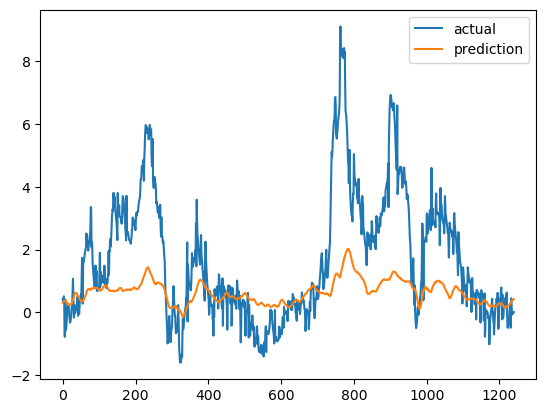

{'mae': 0    1.477771
dtype: float64, 'mape': 0    110.317345
dtype: float64, 'mse': 0    4.21111
dtype: float64}


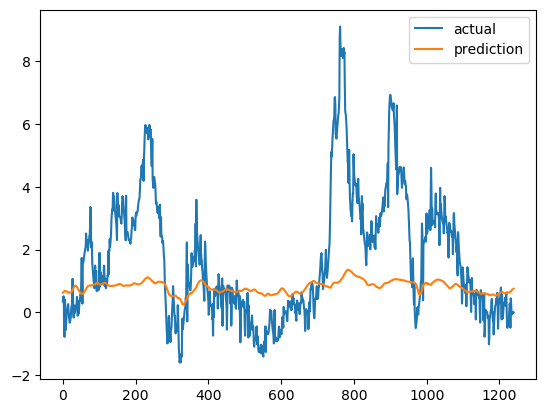

{'mae': 0    1.506842
dtype: float64, 'mape': 0    103.81434
dtype: float64, 'mse': 0    4.424182
dtype: float64}


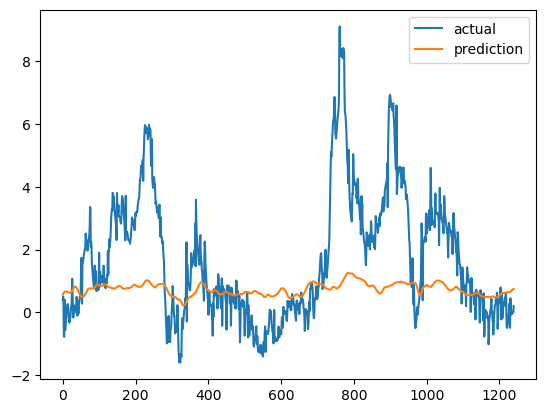

157/157 [==============================] - 10s 64ms/step - loss: 0.0290 - val_loss: 0.1851
{'mae': 0    1.050768
dtype: float64, 'mape': 0    178.771368
dtype: float64, 'mse': 0    2.934075
dtype: float64}


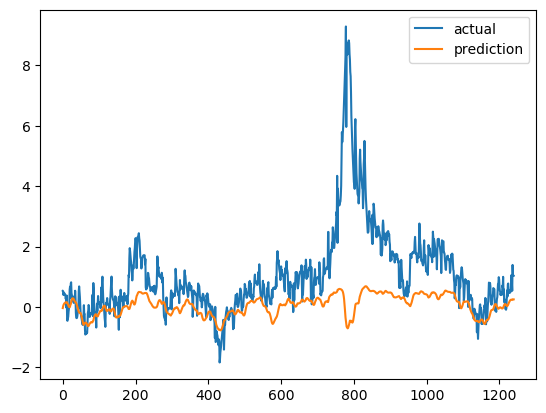

{'mae': 0    1.326089
dtype: float64, 'mape': 0    116.542464
dtype: float64, 'mse': 0    7.321024
dtype: float64}


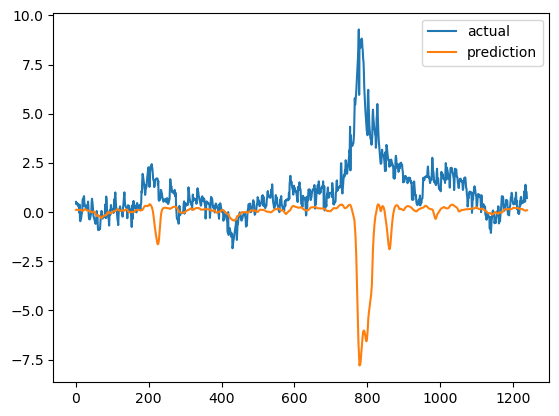

{'mae': 0    2.127774
dtype: float64, 'mape': 0    191.140356
dtype: float64, 'mse': 0    17.427408
dtype: float64}


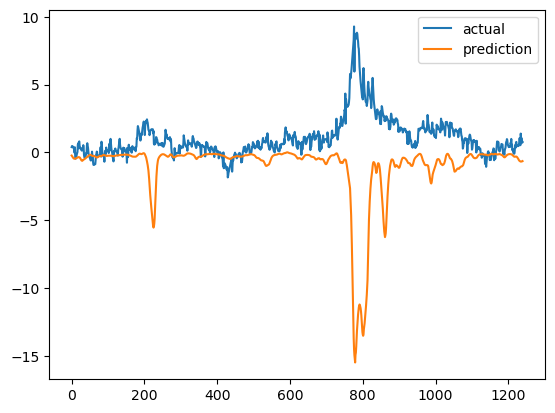

157/157 [==============================] - 10s 65ms/step - loss: 0.0303 - val_loss: 0.0013
{'mae': 0    0.168785
dtype: float64, 'mape': 0   -21.535239
dtype: float64, 'mse': 0    0.042495
dtype: float64}


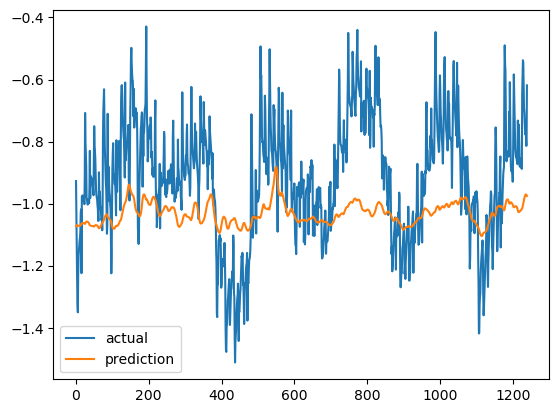

{'mae': 0    0.136067
dtype: float64, 'mape': 0   -16.848014
dtype: float64, 'mse': 0    0.030724
dtype: float64}


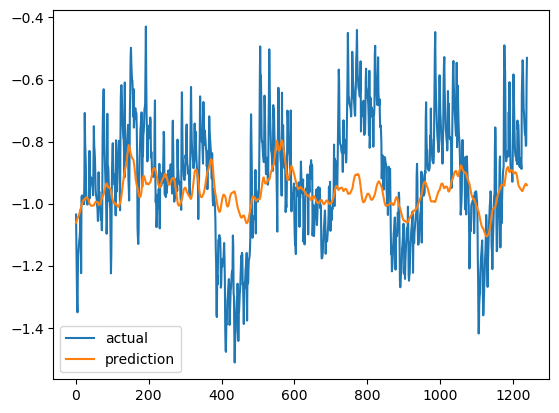

{'mae': 0    0.184468
dtype: float64, 'mape': 0   -23.860173
dtype: float64, 'mse': 0    0.053881
dtype: float64}


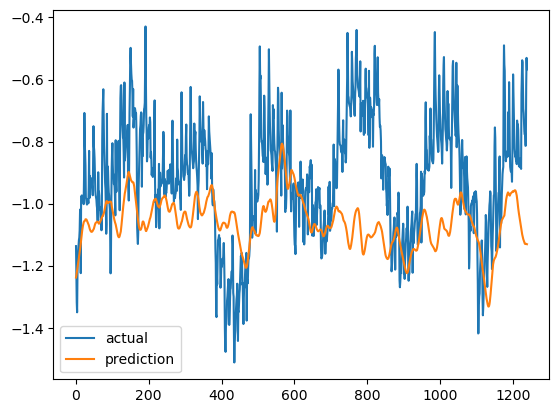

157/157 [==============================] - 11s 71ms/step - loss: 0.0117 - val_loss: 0.0087
{'mae': 0    0.270669
dtype: float64, 'mape': 0    30.4469
dtype: float64, 'mse': 0    0.105153
dtype: float64}


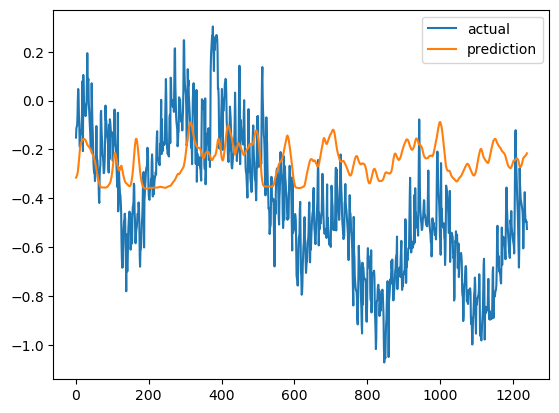

{'mae': 0    0.481582
dtype: float64, 'mape': 0   -92.339298
dtype: float64, 'mse': 0    0.303386
dtype: float64}


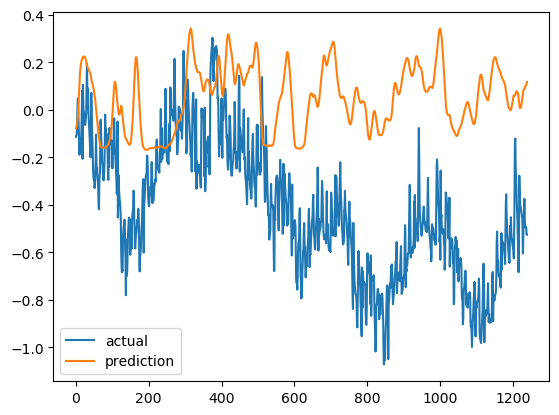

{'mae': 0    0.64334
dtype: float64, 'mape': 0   -113.688243
dtype: float64, 'mse': 0    0.505142
dtype: float64}


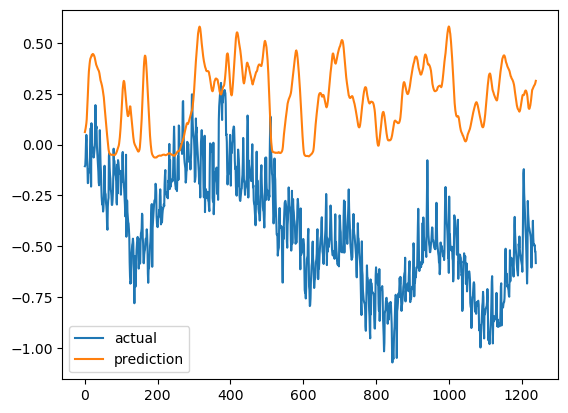

 29/157 [====>.........................] - ETA: 7s - loss: 0.0618

KeyboardInterrupt: 

In [43]:
# CHECK!!!! seasonal_8760
#time_step = 10, patience = 10, epochs = 300 했더니 꽤나 좋았다
#time_step = 50, patience = 100 했더니 오히려 안 좋음
#time_step = 10, patience = 100 오 개조아
for i in range(7):
    time_step = 10
    y_step = 3
    patience = 1
    epochs = 1

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[3][i][0], scaled_data[3][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[3][i][2], scaled_data[3][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)
    

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[3][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[3][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[3][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[3][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

In [6]:
def make_dataset(X_df, y_df, time_step = 8):
    new_X_df = []
    new_y_df = []
    X_df = pd.concat([X_df, y_df], axis=1)
    for i in range(len(X_df) - time_step):
        new_X_df.append(np.array(X_df.iloc[i:i + time_step]))
        new_y_df.append(np.array(y_df.iloc[i + time_step]))
    return np.array(new_X_df), np.array(new_y_df)

# (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[1][1][0], scaled_data[1][1][1])
# (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[1][1][2], scaled_data[1][1][3])

In [488]:
from tensorflow import keras

# There are many articles that argue batchnorm is better than dropout.
# Just for testing

def LSTM_model(feature_num, time_step = 8): # time_step: The parameter for determining how many past data points to use.
    
    units_1 = 128
    units_2 = 64
    units_3 = 16
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units_1, # the number of hidden cells.
                   #kernel_regularizer = tf.keras.regularizers.L1L2(l1=0.01, l2=0.0),
                   input_shape=(time_step, feature_num), # The latter one means the number of features.
                   activation='relu',
                   return_sequences = True)
              )
    #model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LSTM(units_2,
                   activation='relu',
                return_sequences = True)
              )
    #model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LSTM(units_3,
                   activation='relu')
              )
    model.add(keras.layers.Dense(1))
    return model

In [489]:
#from keras.callbacks import ModelCheckpoint, EarlyStopping
import os

def LSTM_fit(model, X_train, y_train, X_valid, y_valid, time_step = 8):
    
    adam = tf.keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon= None, decay=0.0, amsgrad=False)
    #nadam = tf.keras.optimizers.experimental.Nadam
    model.compile(loss='mean_squared_error', optimizer = 'nadam')
    early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

    model_path = 'model'
    filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    checkpoint = keras.callbacks.ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    
    history = model.fit(X_train, y_train, 
                        epochs = 200,
                        validation_data = (X_valid, y_valid), 
                        callbacks = [early_stop],
                        shuffle = False)
    return history

In [25]:
def calculate_metrics(true, pred):
    true = pd.DataFrame(true)
    pred = pd.DataFrame(pred)
    mae = (true - pred).abs().mean()
    mape = (true - pred).abs().div(true).mean() * 100
    mse = ((true - pred) ** 2).mean()
    return {
        "mae": mae,
        "mape": mape,
        "mse": mse,
    }

In [48]:
# seasonal_24
for i in range(7):
    
    time_step = 20
    
    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[1][i][0], scaled_data[1][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[1][i][2], scaled_data[1][i][3], time_step)
    
    model = LSTM_model(len(lstm_X_train[0][0]), time_step)
    # model.summary()
    
    history = LSTM_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step)
    
    pred = model.predict(lstm_X_valid)
    
    print(calculate_metrics(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid), inverse_min_max_scaling(scaler_y[1][i], pred)))
    
    plt.plot(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid), label = 'actual')
    plt.plot(inverse_min_max_scaling(scaler_y[1][i], pred), label = 'prediction')
    plt.legend()
    plt.show()

In [49]:
# CHECK!!!! seasonal_24
for i in range(7):
    
    time_step = 20
    
    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[1][i][1], scaled_data[1][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[1][i][3], scaled_data[1][i][3], time_step)
    
    model = LSTM_model(len(lstm_X_train[0][0]), time_step)
    # model.summary()
    
    history = LSTM_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step)
    
    pred = model.predict(lstm_X_valid)
    
    print(calculate_metrics(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid), inverse_min_max_scaling(scaler_y[1][i], pred)))
    
    plt.plot(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid), label = 'actual')
    plt.plot(inverse_min_max_scaling(scaler_y[1][i], pred), label = 'prediction')
    plt.legend()
    plt.show()

In [415]:
len(lstm_X_valid)

1244

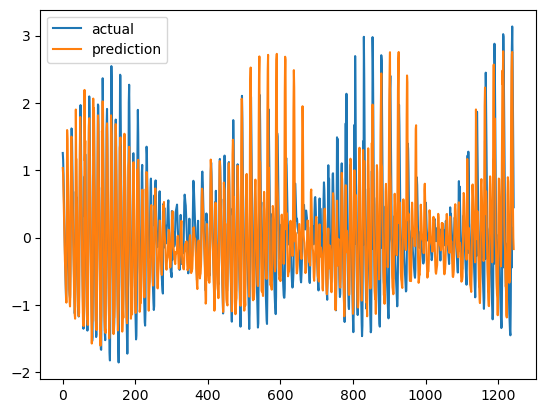

In [433]:
pred = model.predict(lstm_X_valid)
plt.plot(lstm_y_valid, label = 'actual')
plt.plot(pred, label = 'prediction')
plt.legend()
plt.show()
# 뭔가 반대로 예측하는 느낌이... 뭐지...

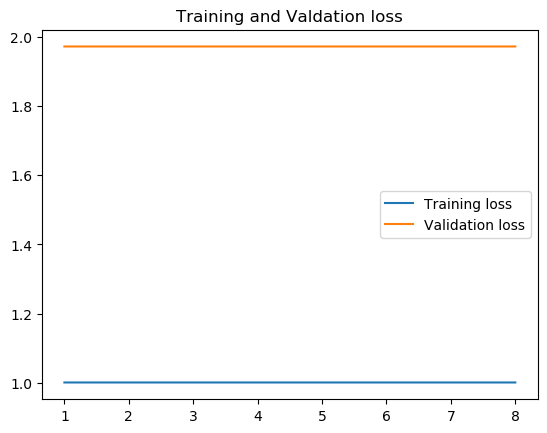

In [ ]:
# loss = history.history['loss']
# val_loss = history.history['val_loss']
# epochs = range(1, len(loss)+1)
# plt.figure()
# plt.plot(epochs, loss, label='Training loss')
# plt.plot(epochs, val_loss, label='Validation loss')
# plt.title('Training and Valdation loss')
# plt.legend()
# plt.show()  

In [ ]:
# def fit_lstm(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons):
# 	# reshape training into [samples, timesteps, features]
# 	X, y = train[:, 0:n_lag], train[:, n_lag:]
# 	X = X.reshape(X.shape[0], 1, X.shape[1])
# 	# design network
# 	model = Sequential()
# 	model.add(LSTM(n_neurons, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
# 	model.add(Dense(y.shape[1]))
# 	model.compile(loss='mean_squared_error', optimizer='adam')
# 	# fit network
# 	for i in range(nb_epoch):
# 		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
# 		model.reset_states()
# 	return model

# Seq2Seq Model

In [534]:
def make_dataset(X_df, y_df, time_step = 8, y_step = 3):
    new_X_df = []
    new_y_df = []
    X_df = pd.concat([X_df, y_df], axis=1)
    for i in range(len(X_df) - time_step - y_step + 1):
        new_X_df.append(np.array(X_df.iloc[i:i + time_step]))
        new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step]))
    return np.array(new_X_df), np.array(new_y_df)

(lstm_X_train, lstm_y_train) = make_dataset(scaled_data[1][1][0], scaled_data[1][1][1])
(lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[1][1][2], scaled_data[1][1][3])

In [615]:
def Seq2_model(feature_num, time_step, y_step):

    model = keras.Sequential()
    model.add(keras.layers.LSTM(128, activation = 'relu', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal'))
    model.add(keras.layers.LSTM(64, activation = 'relu'))
    model.add(keras.layers.RepeatVector(y_step))
    model.add(keras.layers.LSTM(64, activation = 'relu', return_sequences = True))
    model.add(keras.layers.LSTM(128, activation = 'relu', return_sequences = True))
    model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
    model.compile(optimizer = 'nadam', loss = 'mse')
    model.summary()
    
    return model

In [616]:
def Seq2_fit(model, X_train, y_train, X_valid, y_valid, time_step = 8):
    
    #adam = tf.keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon= None, decay=0.0, amsgrad=False)
    #nadam = tf.keras.optimizers.experimental.Nadam
    model.compile(loss='mean_squared_error', optimizer = 'nadam')
    early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

    #model_path = 'model'
    #filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    #checkpoint = keras.callbacks.ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    
    history = model.fit(X_train, y_train, 
                        epochs = 300,
                        validation_data = (X_valid, y_valid), 
                        callbacks = [early_stop],
                        shuffle = False)
    return history

Model: "sequential_82"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_226 (LSTM)              (None, 20, 128)           67072     
_________________________________________________________________
lstm_227 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_13 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_228 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_229 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_10 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

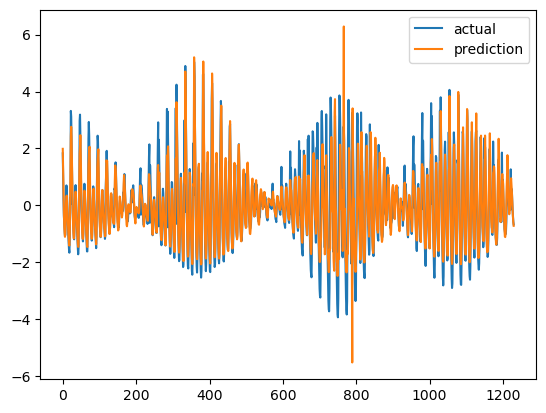

{'mae': 0    0.387925
dtype: float64, 'mape': 0   -6.248391
dtype: float64, 'mse': 0    0.574762
dtype: float64}


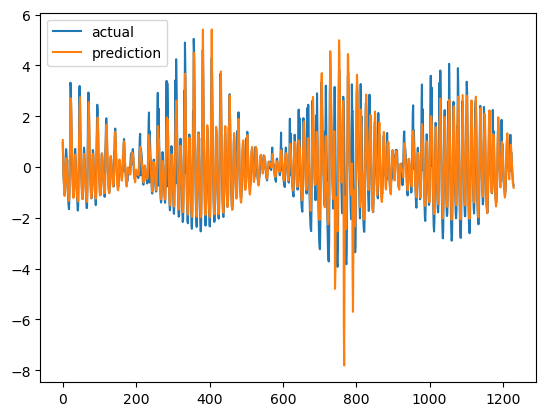

{'mae': 0    0.397877
dtype: float64, 'mape': 0   -6.969565
dtype: float64, 'mse': 0    0.485706
dtype: float64}


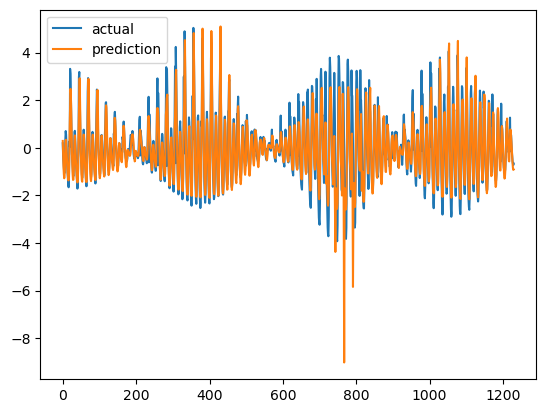

Model: "sequential_83"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_230 (LSTM)              (None, 20, 128)           67072     
_________________________________________________________________
lstm_231 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_14 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_232 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_233 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_11 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

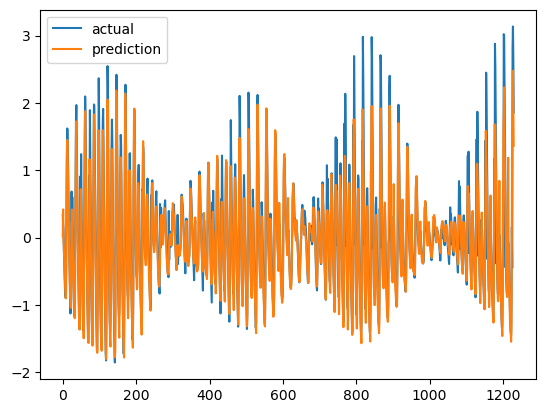

{'mae': 0    0.187528
dtype: float64, 'mape': 0    4.307681
dtype: float64, 'mse': 0    0.092902
dtype: float64}


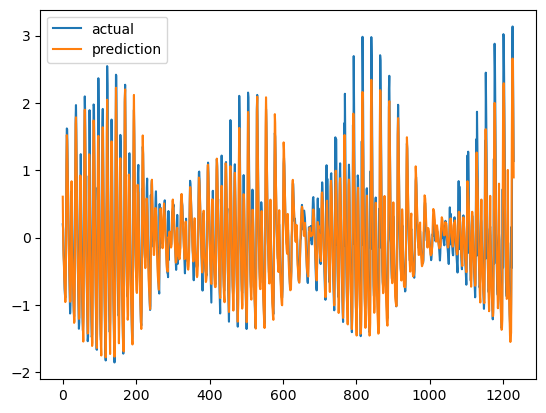

{'mae': 0    0.182906
dtype: float64, 'mape': 0    5.588462
dtype: float64, 'mse': 0    0.084558
dtype: float64}


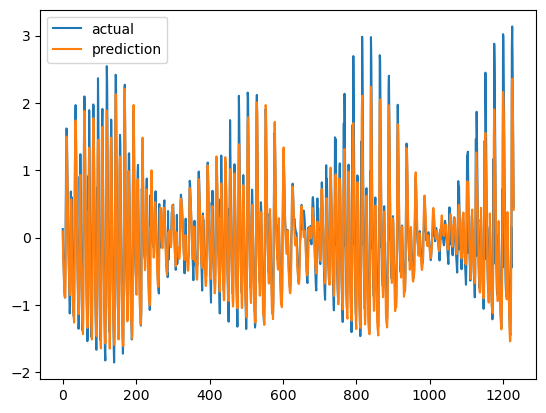

Model: "sequential_84"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_234 (LSTM)              (None, 20, 128)           67072     
_________________________________________________________________
lstm_235 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_15 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_236 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_237 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_12 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

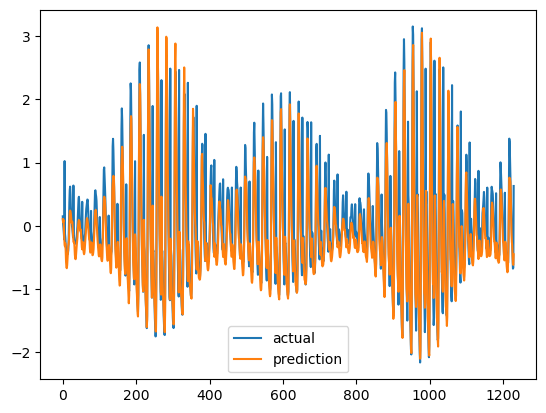

{'mae': 0    0.276624
dtype: float64, 'mape': 0   -107.697885
dtype: float64, 'mse': 0    0.200349
dtype: float64}


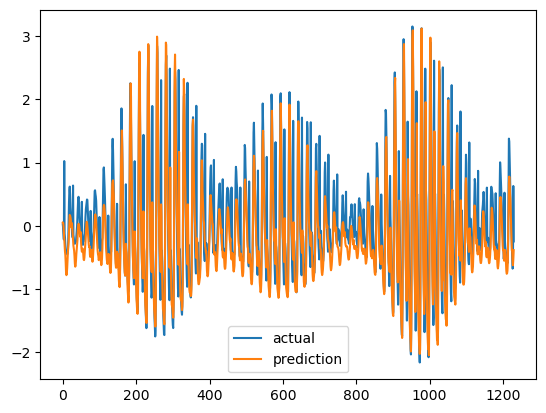

{'mae': 0    0.318512
dtype: float64, 'mape': 0   -175.36831
dtype: float64, 'mse': 0    0.215856
dtype: float64}


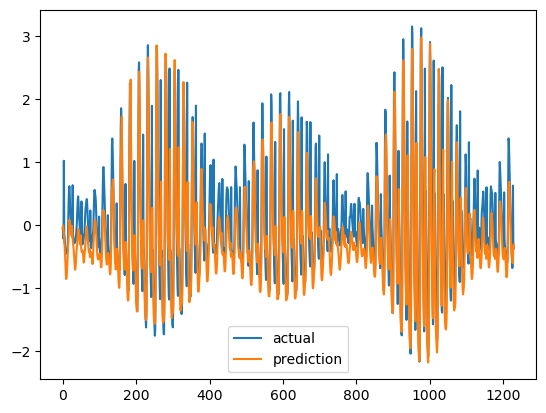

Model: "sequential_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_238 (LSTM)              (None, 20, 128)           67072     
_________________________________________________________________
lstm_239 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_16 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_240 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_241 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_13 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [612]:
# CHECK!!!! seasonal_24
for i in range(7):
    
    time_step = 20
    y_step = 3
    
    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[1][i][0], scaled_data[1][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[1][i][2], scaled_data[1][i][3], time_step)
    
    model = Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    # model.summary()
    
    history = Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step)
    
    pred = model.predict(lstm_X_valid)
    
    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[1][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[1][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
    
    

Model: "sequential_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_254 (LSTM)              (None, 50, 128)           67072     
_________________________________________________________________
lstm_255 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_20 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_256 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_257 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_17 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

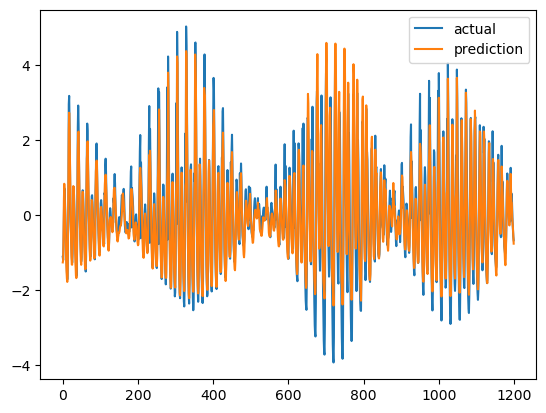

{'mae': 0    0.365526
dtype: float64, 'mape': 0   -3.747912
dtype: float64, 'mse': 0    0.341122
dtype: float64}


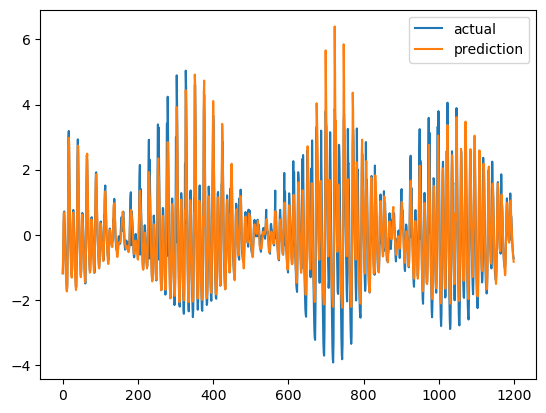

{'mae': 0    0.367783
dtype: float64, 'mape': 0   -6.822726
dtype: float64, 'mse': 0    0.338972
dtype: float64}


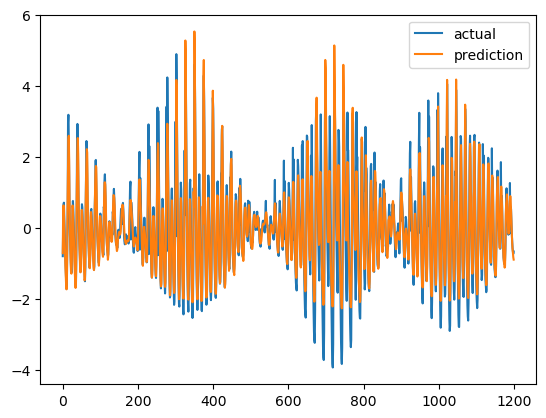

Model: "sequential_90"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_258 (LSTM)              (None, 50, 128)           67072     
_________________________________________________________________
lstm_259 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_21 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_260 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_261 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_18 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

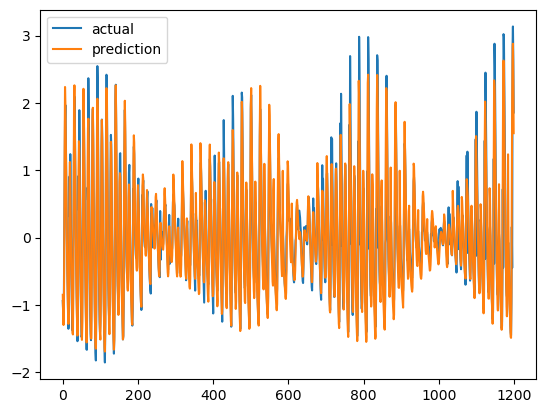

{'mae': 0    0.183728
dtype: float64, 'mape': 0    16.331865
dtype: float64, 'mse': 0    0.102
dtype: float64}


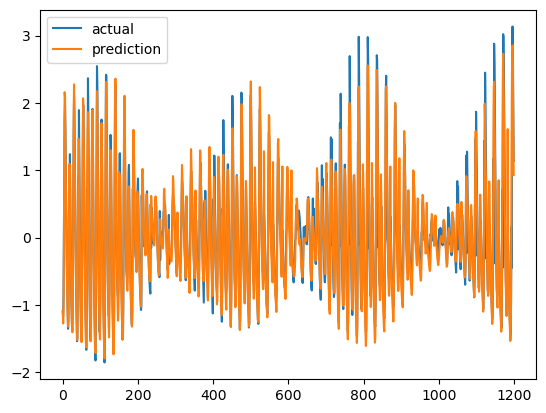

{'mae': 0    0.193558
dtype: float64, 'mape': 0    6.879587
dtype: float64, 'mse': 0    0.108087
dtype: float64}


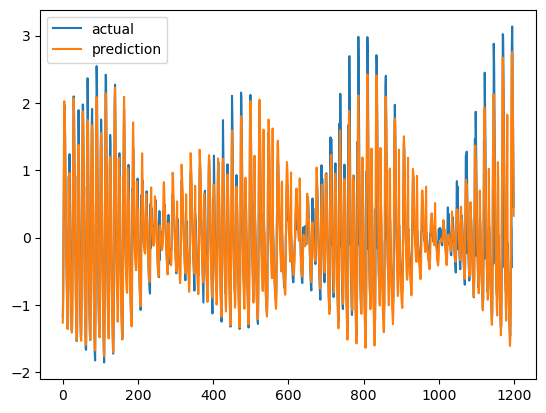

Model: "sequential_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_262 (LSTM)              (None, 50, 128)           67072     
_________________________________________________________________
lstm_263 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_22 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_264 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_265 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_19 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

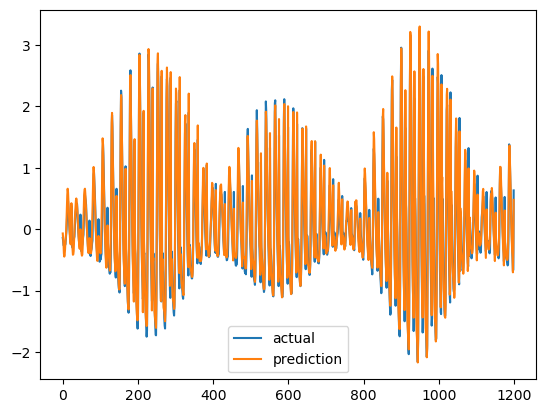

{'mae': 0    0.143415
dtype: float64, 'mape': 0   -34.152026
dtype: float64, 'mse': 0    0.038783
dtype: float64}


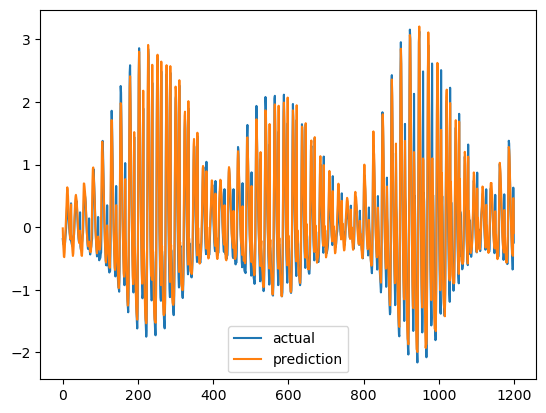

{'mae': 0    0.150556
dtype: float64, 'mape': 0   -42.243137
dtype: float64, 'mse': 0    0.054244
dtype: float64}


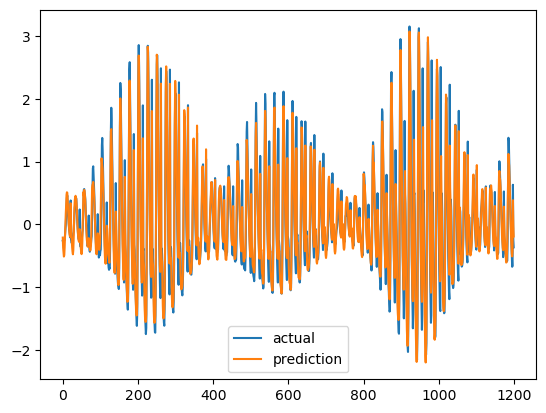

Model: "sequential_92"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_266 (LSTM)              (None, 50, 128)           67072     
_________________________________________________________________
lstm_267 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_23 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_268 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_269 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_20 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

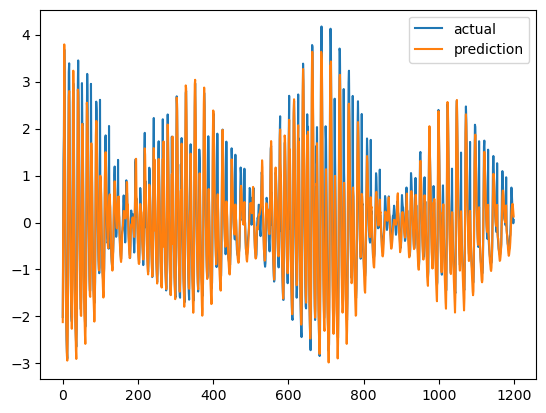

{'mae': 0    0.296985
dtype: float64, 'mape': 0    16.227071
dtype: float64, 'mse': 0    0.228027
dtype: float64}


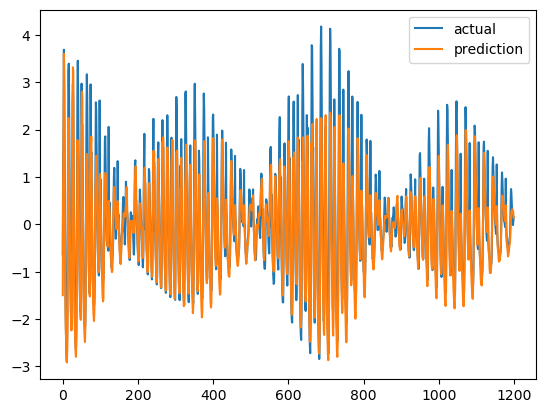

{'mae': 0    0.266691
dtype: float64, 'mape': 0    26.279751
dtype: float64, 'mse': 0    0.140957
dtype: float64}


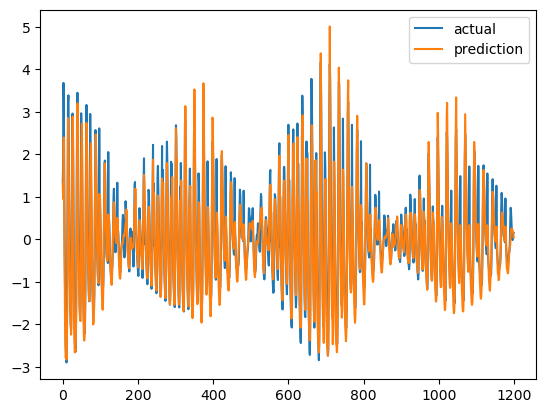

Model: "sequential_93"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_270 (LSTM)              (None, 50, 128)           67072     
_________________________________________________________________
lstm_271 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_24 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_272 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_273 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_21 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

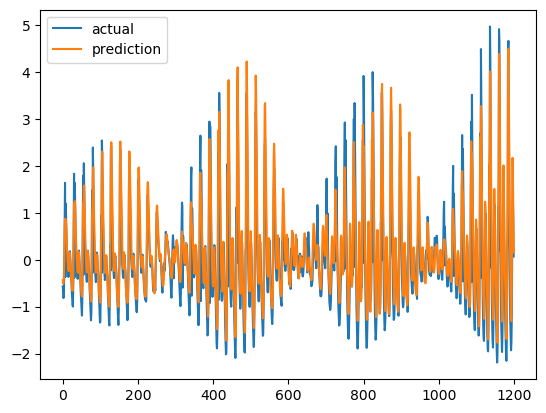

{'mae': 0    0.347234
dtype: float64, 'mape': 0   -38.837251
dtype: float64, 'mse': 0    0.269101
dtype: float64}


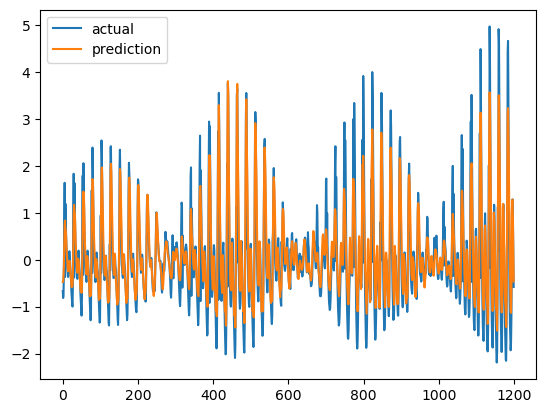

{'mae': 0    0.346233
dtype: float64, 'mape': 0   -18.984305
dtype: float64, 'mse': 0    0.26679
dtype: float64}


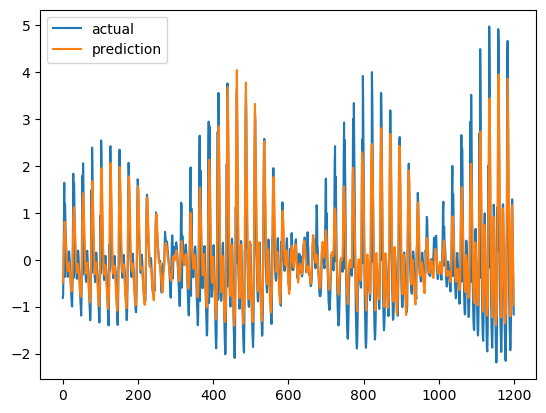

Model: "sequential_94"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_274 (LSTM)              (None, 50, 128)           67072     
_________________________________________________________________
lstm_275 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_25 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_276 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_277 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_22 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

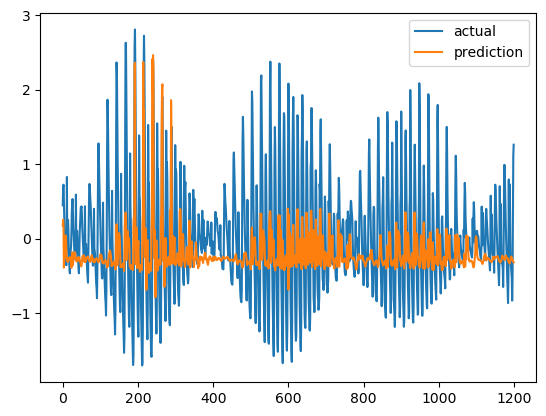

{'mae': 0    0.590471
dtype: float64, 'mape': 0   -77.016399
dtype: float64, 'mse': 0    0.57292
dtype: float64}


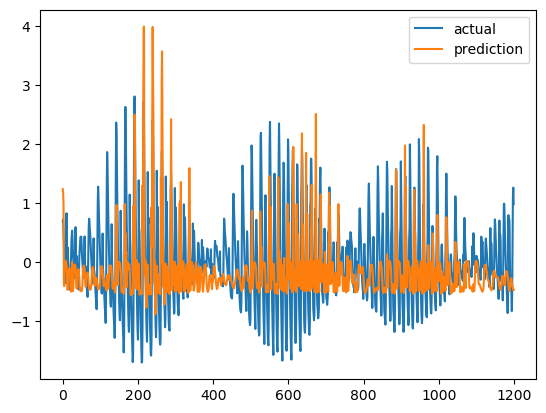

{'mae': 0    1.031095
dtype: float64, 'mape': 0   -741.549558
dtype: float64, 'mse': 0    1.454785
dtype: float64}


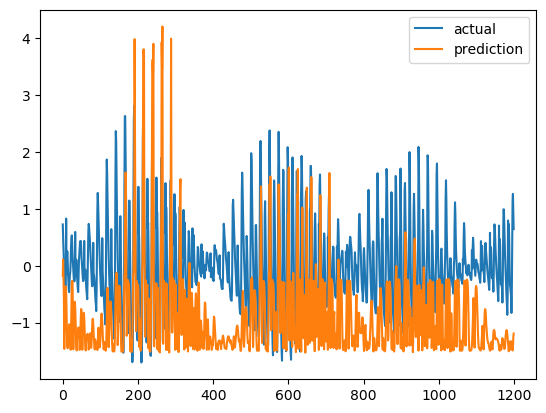

Model: "sequential_95"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_278 (LSTM)              (None, 50, 128)           67072     
_________________________________________________________________
lstm_279 (LSTM)              (None, 64)                49408     
_________________________________________________________________
repeat_vector_26 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_280 (LSTM)              (None, 3, 64)             33024     
_________________________________________________________________
lstm_281 (LSTM)              (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_23 (TimeDis (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
_______________________________________________

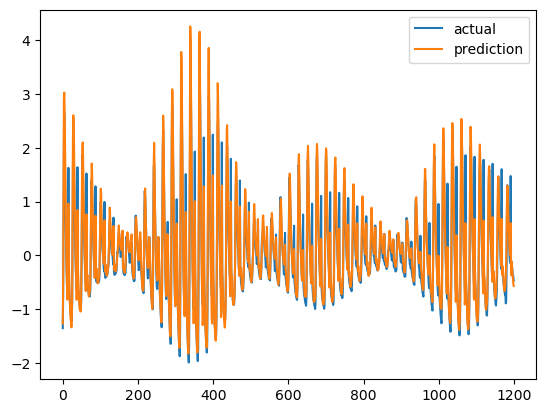

{'mae': 0    0.198474
dtype: float64, 'mape': 0   -15.229201
dtype: float64, 'mse': 0    0.079877
dtype: float64}


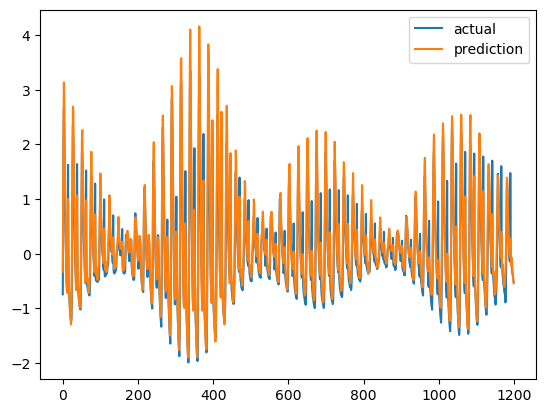

{'mae': 0    0.197114
dtype: float64, 'mape': 0   -13.276393
dtype: float64, 'mse': 0    0.079752
dtype: float64}


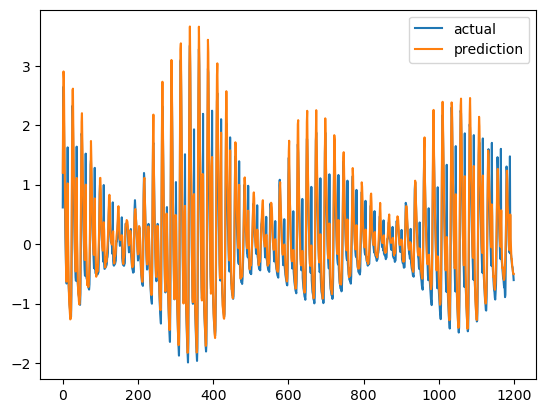

In [613]:
# CHECK!!!! seasonal_24
for i in range(7):
    
    time_step = 50
    y_step = 3
    
    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[1][i][1], scaled_data[1][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[1][i][3], scaled_data[1][i][3], time_step)
    
    model = Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    # model.summary()
    
    history = Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step)
    
    pred = model.predict(lstm_X_valid)
    
    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[1][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[1][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
    
    

In [655]:
def Seq2_resid_model(feature_num, time_step, y_step):

    model = keras.Sequential()
    model.add(keras.layers.LSTM(128, activation = 'relu', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal', dropout = 0.2))
    model.add(keras.layers.LSTM(64, activation = 'relu', dropout = 0.2))
    model.add(keras.layers.RepeatVector(y_step))
    model.add(keras.layers.LSTM(64, activation = 'relu', return_sequences = True, dropout = 0.2))
    model.add(keras.layers.LSTM(128, activation = 'relu', return_sequences = True, dropout = 0.2))
    model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
    model.summary()
    
    return model

In [ ]:
def Seq2_resid_fit(model, X_train, y_train, X_valid, y_valid, time_step = 8):
    
    #adam = tf.keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon= None, decay=0.0, amsgrad=False)
    #nadam = tf.keras.optimizers.experimental.Nadam
    adam = tf.keras.optimizers.Adam(lr = 0.0005, clipnorm = 1.)
    model.compile(loss='mean_squared_error', optimizer = adam)
    early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=100)

    #model_path = 'model'
    #filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    #checkpoint = keras.callbacks.ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    
    history = model.fit(X_train, y_train, 
                        epochs = 1000,
                        validation_data = (X_valid, y_valid), 
                        callbacks = [early_stop],
                        shuffle = False)
    return history

In [ ]:
# CHECK!!!! residual
for i in range(7):
    if i == 1:
        time_step = 50
        y_step = 3a

        (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[4][i][0], scaled_data[4][i][1], time_step)
        (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[4][i][2], scaled_data[4][i][3], time_step)

        model = Seq2_resid_model(len(lstm_X_train[0][0]), time_step, y_step)
        # model.summary()

        history = Seq2_resid_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step)

        pred = model.predict(lstm_X_valid)

        for j in range(y_step):
            print(calculate_metrics(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[1][i], pred[:, j])))
            plt.plot(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), label = 'actual')
            plt.plot(inverse_min_max_scaling(scaler_y[1][i], pred[:, j]), label = 'prediction')
            plt.legend()
            plt.show()
    
    

## ATTENTION

In [13]:
def make_dataset(X_df, y_df, time_step = 8, y_step = 3):
    new_X_df = []
    new_y_df = []
    X_df = pd.concat([X_df, y_df], axis=1)
    for i in range(len(X_df) - time_step - y_step + 1):
        new_X_df.append(np.array(X_df.iloc[i:i + time_step]))
        new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step]))
    return np.array(new_X_df), np.array(new_y_df)

In [14]:
def attention_model(feature_num, time_step, y_step):
    
#     model = keras.Sequential()
#     model.add(keras.layers.LSTM(128, activation = 'relu', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal', dropout = 0.2))
#     model.add(keras.layers.LSTM(64, activation = 'relu', dropout = 0.2))
#     model.add(keras.layers.RepeatVector(y_step))
#     model.add(keras.layers.LSTM(64, activation = 'relu', return_sequences = True, dropout = 0.2))
#     model.add(keras.layers.LSTM(128, activation = 'relu', return_sequences = True, dropout = 0.2))
#     model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
    
    input_train = keras.layers.Input(shape=(time_step, feature_num))
    output_train = keras.layers.Input(shape=(y_step, feature_num))
    
    (en_stack_h, en_last_h, en_last_c) = keras.layers.LSTM(128, activation='relu',
                                                         return_sequences = True, kernel_initializer = 'he_normal',
                                                        dropout=0.2, recurrent_dropout = 0.2,
                                                        return_state = True)(input_train)
    
    en_last_h = keras.layers.BatchNormalization(momentum = 0.6)(en_last_h)
    en_last_c = keras.layers.BatchNormalization(momentum = 0.6)(en_last_c)
    
    de_input = keras.layers.RepeatVector(y_step)(en_last_h)
    de_stack_h = keras.layers.LSTM(128, activation = 'relu',
                                   return_sequences = True, dropout = 0.2,
                                   return_state = False)(de_input, initial_state = [en_last_h, en_last_c])
    
    attention = keras.layers.dot([de_stack_h, en_stack_h], axes = [2, 2])
    attention = keras.layers.Activation('softmax')(attention)
    
    context = keras.layers.dot([attention, en_stack_h], axes = [2, 1])
    context = keras.layers.BatchNormalization(momentum = 0.6)(context)
    
    de_combined_context = keras.layers.concatenate([context, de_stack_h])
    
    out = keras.layers.TimeDistributed(keras.layers.Dense(1))(de_combined_context)
    
    model = keras.models.Model(inputs = input_train, outputs = out)
    
    return model
    

    #input_train = Input(shape=(input_train.shape[1], input_train.shape[2]-1))
    #output_train = Input(shape=(X_output_train.shape[1], X_output_train.shape[2]-1))
    
#     encoder_stack_h, encoder_last_h, encoder_last_c = keras.layers.LSTM(n_hidden, activation='relu', 
#                                                         dropout=0.2, recurrent_dropout = 0.2,
#                                                         return_state = True, return_sequences=True)(input_train)
    
#     encoder_last_h = keras.layers.BatchNormalization(momentum=0.6)(encoder_last_h)
#     encoder_last_c = keras.layers.BatchNormalization(momentum=0.6)(encoder_last_c)
    
#     decoder_input = keras.layers.RepeatVector(y_step)(encoder_last_h)
#     decoder_stack_h = keras.layers.LSTM(n_hidden, activation = 'relu',
#                        dropout=0.2, 
#                        recurrent_dropout=0.2,
#                        return_state =False , 
#                        return_sequences = True)(decoder_input, initial_state=[encoder_last_h, encoder_last_c])
    
#     attention = dot([decoder_stack_h, encoder_stack_h], axes = [2,2])
#     attention = keras.layers.Activation('softmax')(attention)
    
#     context = dot([attention, encoder_stack_h], axes = [2,1])
#     context = keras.layers.BatchNormalization(momentum = 0.6)(context)
    
#     decoder_combined_context = concatenate([context, decoder_stack_h])
    
#     out = keras.layers.TimeDistributed(keras.layers.Dense(1))(decoder_combined_context)
    
#     model = keras.Model(inputs=input_train, outputs = out)
    
    # return model

In [15]:
def attention_fit(model, X_train, y_train, X_valid, y_valid, time_step = 8):
    
    adam = tf.keras.optimizers.Adam(lr = 0.0001, clipnorm = 1)
    model.compile(loss='mean_squared_error', optimizer = adam)
    early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

    model_path = 'MyFiles/model_checkpoint.h5'
    
    filename = os.path.join(model_path)
    checkpoint = keras.callbacks.ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    
    history = model.fit(X_train, y_train, 
                        epochs = 1000,
                        validation_data = (X_valid, y_valid), 
                        callbacks = [early_stop, checkpoint],
                        shuffle = False)
    return history

Model: "functional_27"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_27 (InputLayer)           [(None, 50, 6)]      0                                            
__________________________________________________________________________________________________
lstm_26 (LSTM)                  [(None, 50, 128), (N 69120       input_27[0][0]                   
__________________________________________________________________________________________________
batch_normalization_39 (BatchNo (None, 128)          512         lstm_26[0][1]                    
__________________________________________________________________________________________________
repeat_vector_13 (RepeatVector) (None, 3, 128)       0           batch_normalization_39[0][0]     
______________________________________________________________________________________

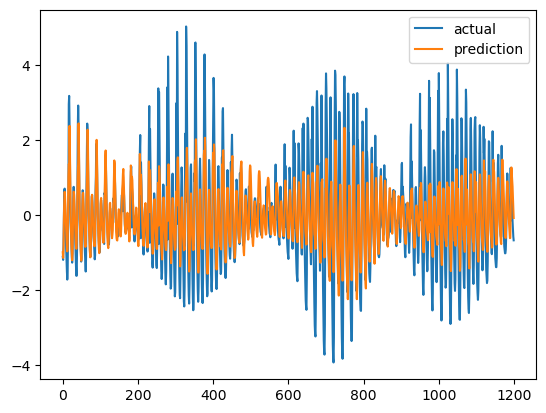

{'mae': 0    0.68576
dtype: float64, 'mape': 0   -7.380887
dtype: float64, 'mse': 0    0.942745
dtype: float64}


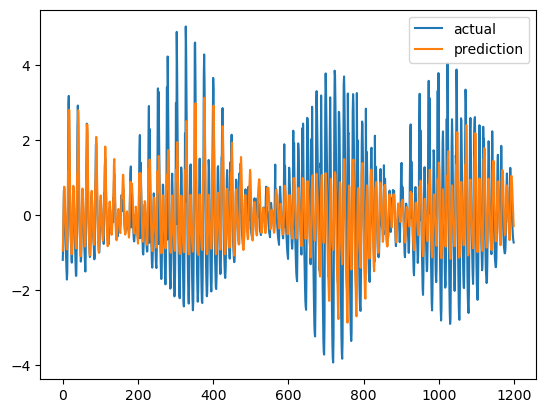

{'mae': 0    0.732579
dtype: float64, 'mape': 0   -15.13805
dtype: float64, 'mse': 0    1.062566
dtype: float64}


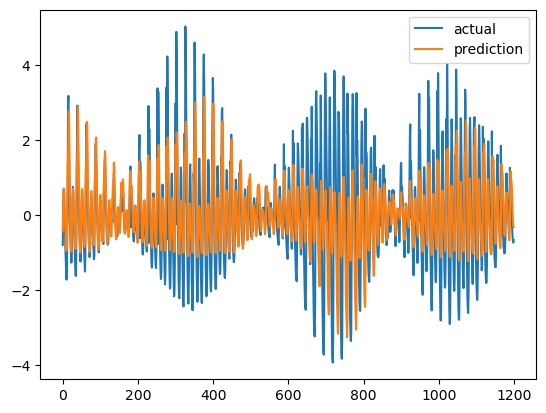

Model: "functional_29"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           [(None, 50, 6)]      0                                            
__________________________________________________________________________________________________
lstm_28 (LSTM)                  [(None, 50, 128), (N 69120       input_29[0][0]                   
__________________________________________________________________________________________________
batch_normalization_42 (BatchNo (None, 128)          512         lstm_28[0][1]                    
__________________________________________________________________________________________________
repeat_vector_14 (RepeatVector) (None, 3, 128)       0           batch_normalization_42[0][0]     
______________________________________________________________________________________

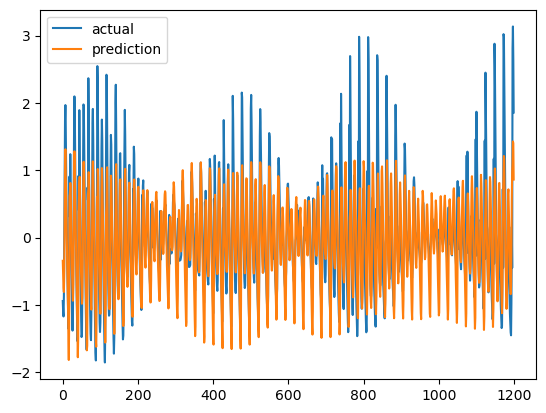

{'mae': 0    0.437656
dtype: float64, 'mape': 0    101.65562
dtype: float64, 'mse': 0    0.364797
dtype: float64}


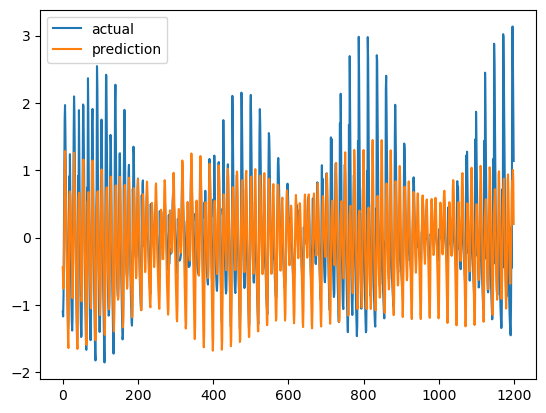

{'mae': 0    0.461729
dtype: float64, 'mape': 0    117.956092
dtype: float64, 'mse': 0    0.407057
dtype: float64}


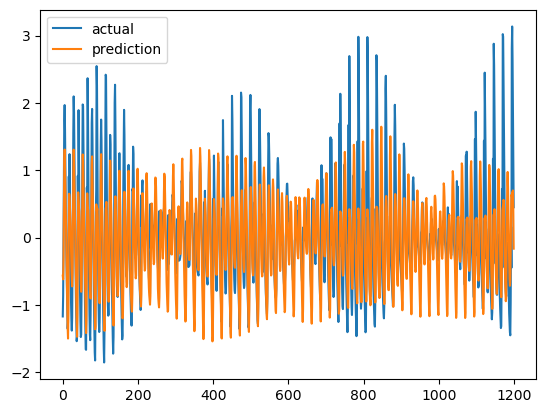

Model: "functional_31"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_31 (InputLayer)           [(None, 50, 6)]      0                                            
__________________________________________________________________________________________________
lstm_30 (LSTM)                  [(None, 50, 128), (N 69120       input_31[0][0]                   
__________________________________________________________________________________________________
batch_normalization_45 (BatchNo (None, 128)          512         lstm_30[0][1]                    
__________________________________________________________________________________________________
repeat_vector_15 (RepeatVector) (None, 3, 128)       0           batch_normalization_45[0][0]     
______________________________________________________________________________________

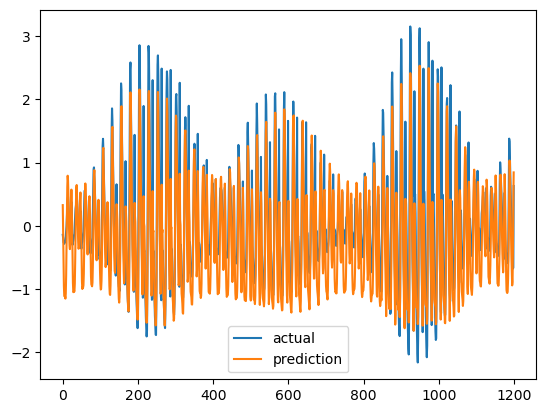

{'mae': 0    0.407165
dtype: float64, 'mape': 0   -107.274601
dtype: float64, 'mse': 0    0.265924
dtype: float64}


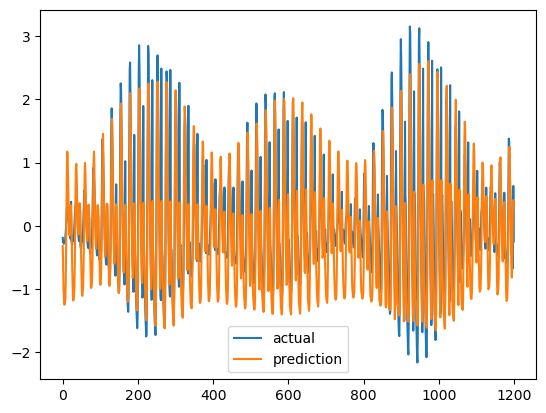

{'mae': 0    0.42046
dtype: float64, 'mape': 0   -57.734204
dtype: float64, 'mse': 0    0.286205
dtype: float64}


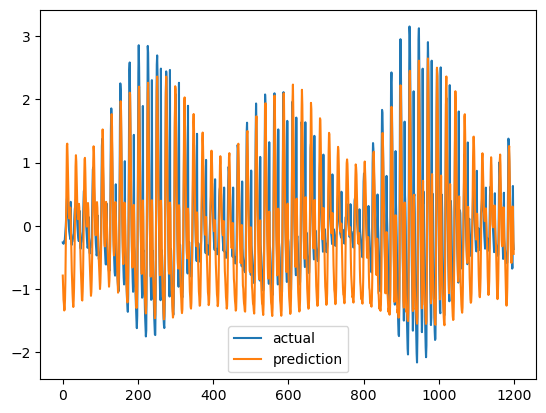

Model: "functional_33"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           [(None, 50, 7)]      0                                            
__________________________________________________________________________________________________
lstm_32 (LSTM)                  [(None, 50, 128), (N 69632       input_33[0][0]                   
__________________________________________________________________________________________________
batch_normalization_48 (BatchNo (None, 128)          512         lstm_32[0][1]                    
__________________________________________________________________________________________________
repeat_vector_16 (RepeatVector) (None, 3, 128)       0           batch_normalization_48[0][0]     
______________________________________________________________________________________

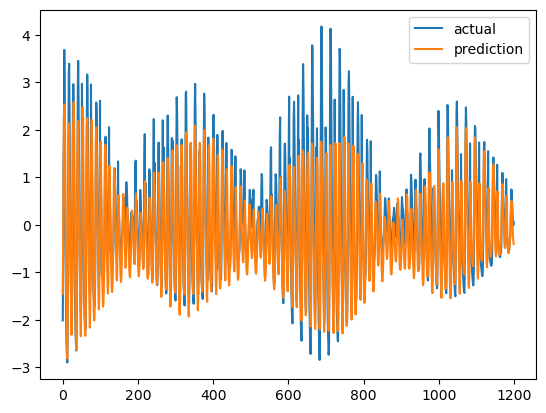

{'mae': 0    0.551404
dtype: float64, 'mape': 0    0.927818
dtype: float64, 'mse': 0    0.497021
dtype: float64}


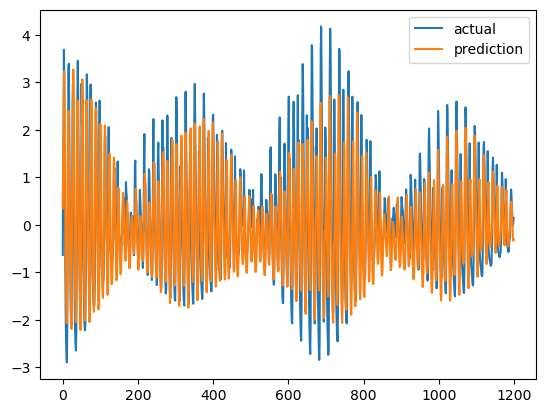

{'mae': 0    0.578225
dtype: float64, 'mape': 0   -47.03123
dtype: float64, 'mse': 0    0.559253
dtype: float64}


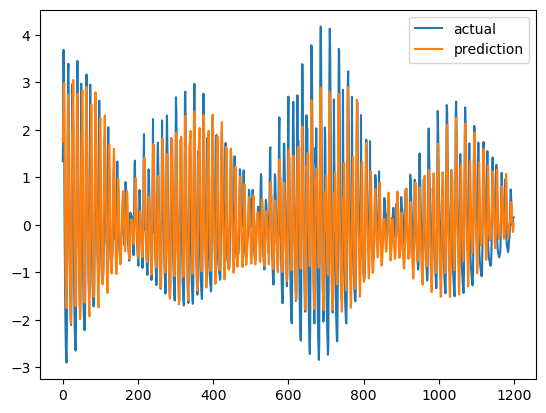

Model: "functional_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_35 (InputLayer)           [(None, 50, 6)]      0                                            
__________________________________________________________________________________________________
lstm_34 (LSTM)                  [(None, 50, 128), (N 69120       input_35[0][0]                   
__________________________________________________________________________________________________
batch_normalization_51 (BatchNo (None, 128)          512         lstm_34[0][1]                    
__________________________________________________________________________________________________
repeat_vector_17 (RepeatVector) (None, 3, 128)       0           batch_normalization_51[0][0]     
______________________________________________________________________________________

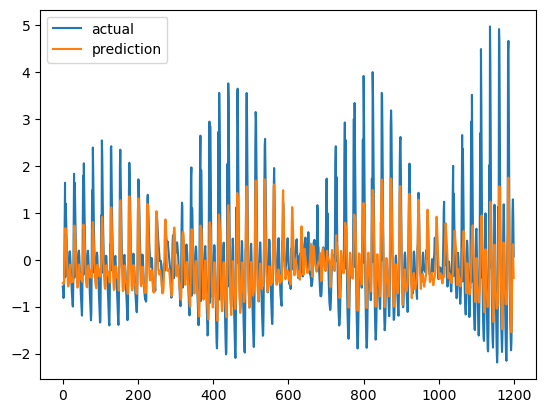

{'mae': 0    0.504454
dtype: float64, 'mape': 0   -8.111806
dtype: float64, 'mse': 0    0.540982
dtype: float64}


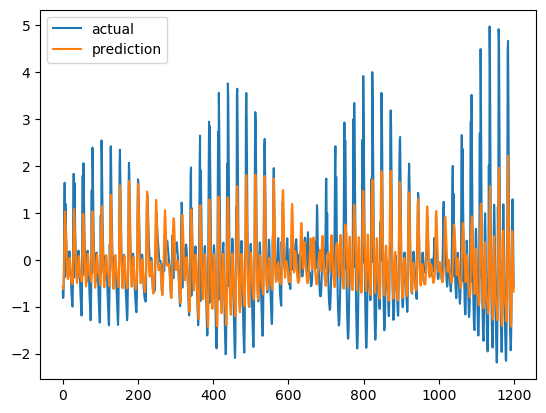

{'mae': 0    0.522495
dtype: float64, 'mape': 0   -16.735428
dtype: float64, 'mse': 0    0.60654
dtype: float64}


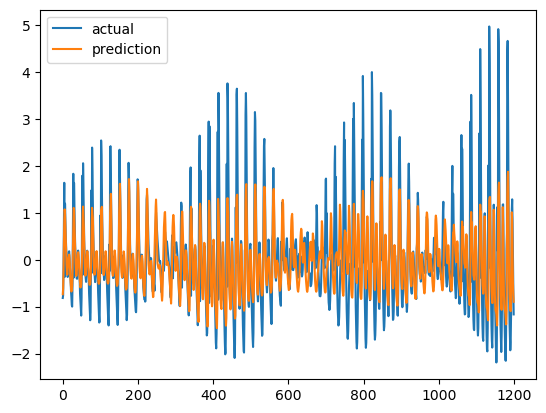

Model: "functional_37"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_37 (InputLayer)           [(None, 50, 6)]      0                                            
__________________________________________________________________________________________________
lstm_36 (LSTM)                  [(None, 50, 128), (N 69120       input_37[0][0]                   
__________________________________________________________________________________________________
batch_normalization_54 (BatchNo (None, 128)          512         lstm_36[0][1]                    
__________________________________________________________________________________________________
repeat_vector_18 (RepeatVector) (None, 3, 128)       0           batch_normalization_54[0][0]     
______________________________________________________________________________________

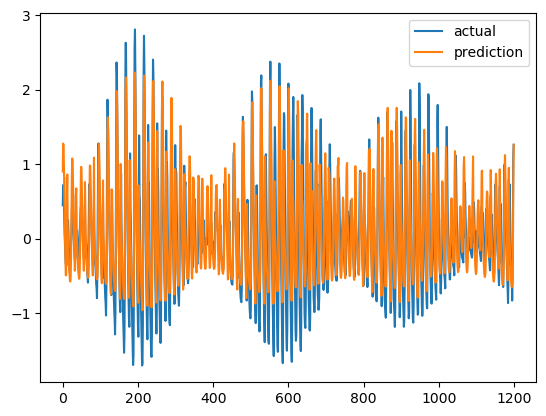

{'mae': 0    0.413479
dtype: float64, 'mape': 0   -91.257213
dtype: float64, 'mse': 0    0.26102
dtype: float64}


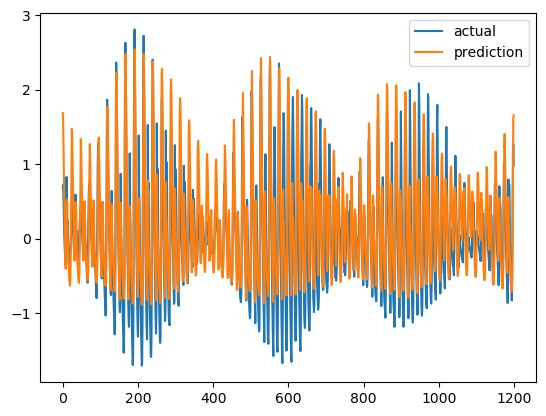

{'mae': 0    0.453878
dtype: float64, 'mape': 0   -67.50864
dtype: float64, 'mse': 0    0.325442
dtype: float64}


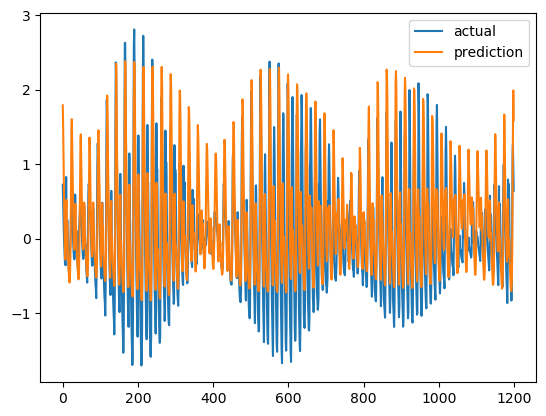

Model: "functional_39"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_39 (InputLayer)           [(None, 50, 6)]      0                                            
__________________________________________________________________________________________________
lstm_38 (LSTM)                  [(None, 50, 128), (N 69120       input_39[0][0]                   
__________________________________________________________________________________________________
batch_normalization_57 (BatchNo (None, 128)          512         lstm_38[0][1]                    
__________________________________________________________________________________________________
repeat_vector_19 (RepeatVector) (None, 3, 128)       0           batch_normalization_57[0][0]     
______________________________________________________________________________________

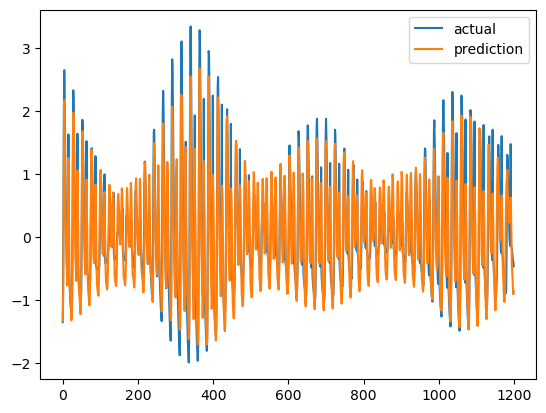

{'mae': 0    0.357383
dtype: float64, 'mape': 0   -52.615414
dtype: float64, 'mse': 0    0.207439
dtype: float64}


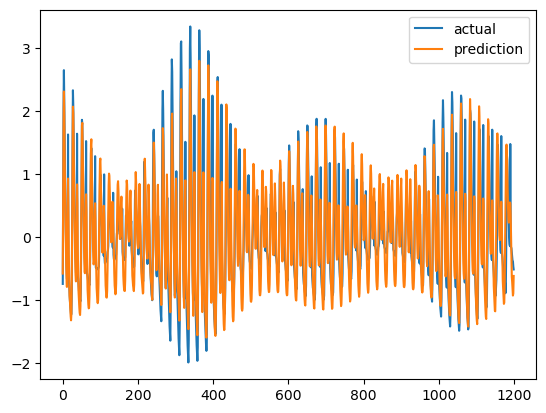

{'mae': 0    0.353315
dtype: float64, 'mape': 0   -51.346556
dtype: float64, 'mse': 0    0.203568
dtype: float64}


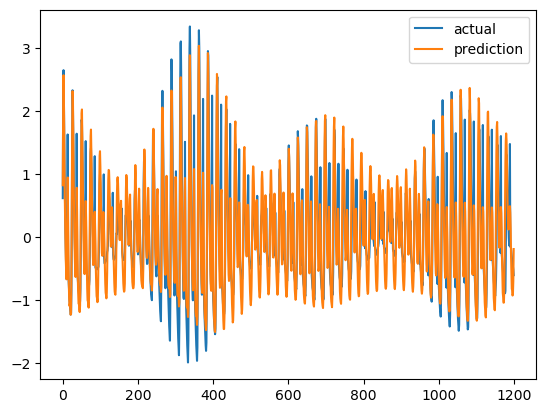

In [52]:
# CHECK!!!! 
for i in range(7):
    time_step = 50
    y_step = 3

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[1][i][0], scaled_data[1][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[1][i][2], scaled_data[1][i][3], time_step)

    model = attention_model(len(lstm_X_train[0][0]), time_step, y_step)
    model.summary()

    history = attention_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[1][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[1][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_32 (LSTM)               (None, 10, 128)           69120     
_________________________________________________________________
lstm_33 (LSTM)               (None, 64)                49408     
_________________________________________________________________
repeat_vector_8 (RepeatVecto (None, 3, 64)             0         
_________________________________________________________________
lstm_34 (LSTM)               (None, 3, 64)             33024     
_________________________________________________________________
lstm_35 (LSTM)               (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_8 (TimeDist (None, 3, 1)              129       
Total params: 250,497
Trainable params: 250,497
Non-trainable params: 0
________________________________________________

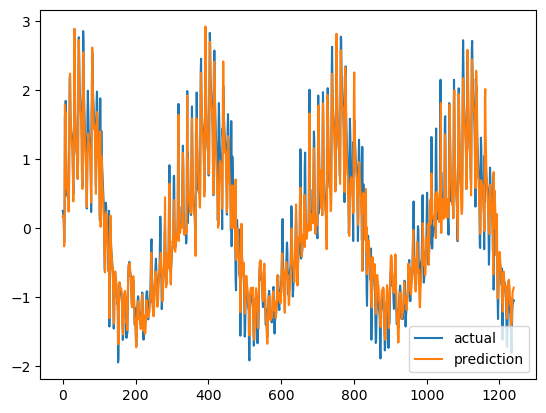

{'mae': 0    0.204868
dtype: float64, 'mape': 0   -6.918359
dtype: float64, 'mse': 0    0.098105
dtype: float64}


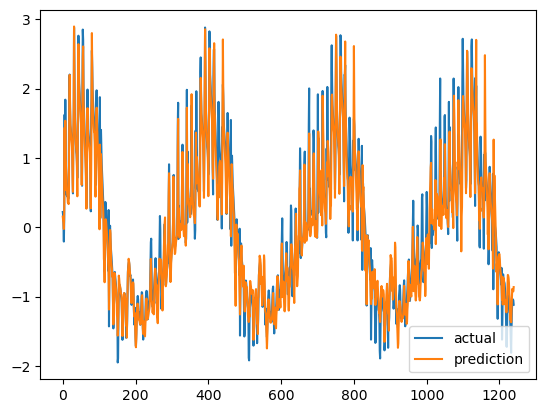

{'mae': 0    0.23358
dtype: float64, 'mape': 0    8.425328
dtype: float64, 'mse': 0    0.115658
dtype: float64}


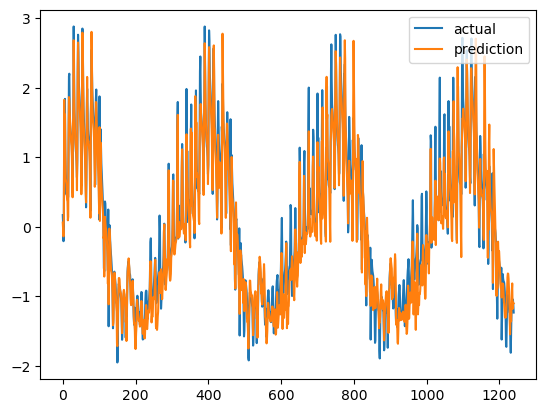

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_36 (LSTM)               (None, 10, 128)           69120     
_________________________________________________________________
lstm_37 (LSTM)               (None, 64)                49408     
_________________________________________________________________
repeat_vector_9 (RepeatVecto (None, 3, 64)             0         
_________________________________________________________________
lstm_38 (LSTM)               (None, 3, 64)             33024     
_________________________________________________________________
lstm_39 (LSTM)               (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_9 (TimeDist (None, 3, 1)              129       
Total params: 250,497
Trainable params: 250,497
Non-trainable params: 0
________________________________________________

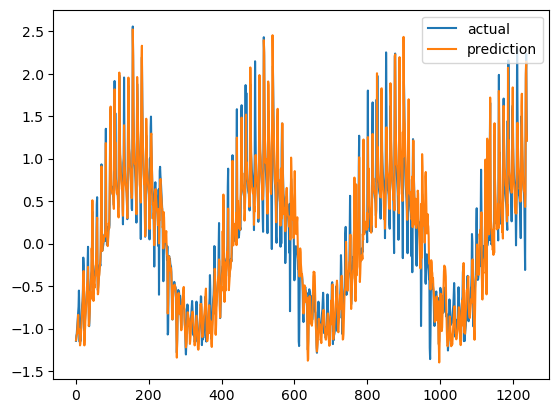

{'mae': 0    0.216937
dtype: float64, 'mape': 0   -49.321241
dtype: float64, 'mse': 0    0.11578
dtype: float64}


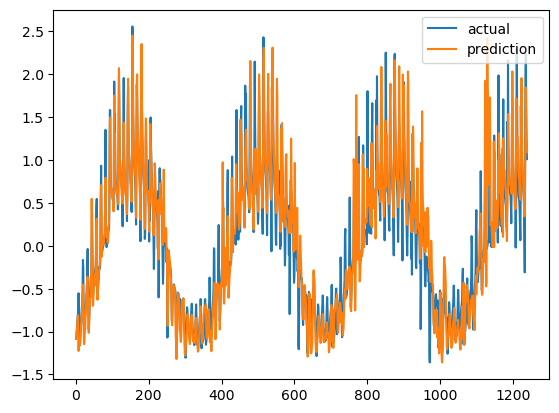

{'mae': 0    0.213576
dtype: float64, 'mape': 0   -18.407597
dtype: float64, 'mse': 0    0.108431
dtype: float64}


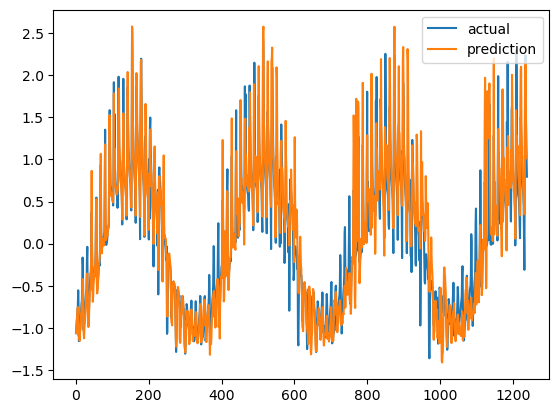

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_40 (LSTM)               (None, 10, 128)           69120     
_________________________________________________________________
lstm_41 (LSTM)               (None, 64)                49408     
_________________________________________________________________
repeat_vector_10 (RepeatVect (None, 3, 64)             0         
_________________________________________________________________
lstm_42 (LSTM)               (None, 3, 64)             33024     
_________________________________________________________________
lstm_43 (LSTM)               (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_10 (TimeDis (None, 3, 1)              129       
Total params: 250,497
Trainable params: 250,497
Non-trainable params: 0
_______________________________________________

In [ ]:
# CHECK!!!! seasonal_360
#time_step = 10, patience = 10, epochs = 300 했더니 꽤나 좋았다
#time_step = 50, patience = 100 했더니 오히려 안 좋음
#time_step = 10, patience = 100 오 개조아
for i in range(7):
    time_step = 10
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[2][i][0], scaled_data[2][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[2][i][2], scaled_data[2][i][3], time_step)

    model = Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    model.summary()

    history = Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[2][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[2][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

{'mae': 0    0.820339
dtype: float64, 'mape': 0   -243.417134
dtype: float64, 'mse': 0    1.129723
dtype: float64}


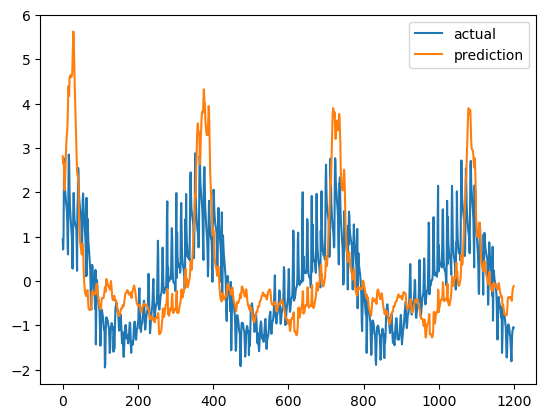

{'mae': 0    0.596119
dtype: float64, 'mape': 0   -260.463949
dtype: float64, 'mse': 0    0.533708
dtype: float64}


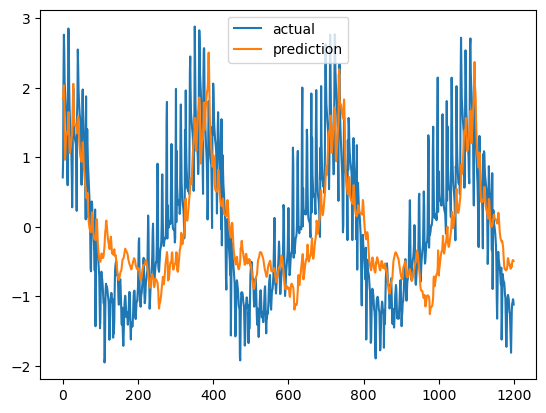

{'mae': 0    0.695736
dtype: float64, 'mape': 0   -259.465157
dtype: float64, 'mse': 0    0.832749
dtype: float64}


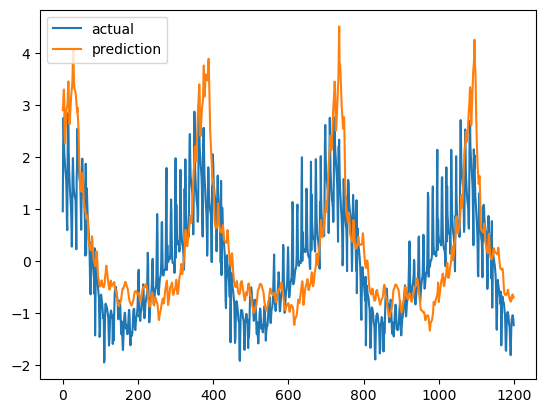

In [19]:
# ATTENTION 모델 적용, time_step = 50, patience = 100이었나 -> 쓰레기ㅎㅎ
for j in range(y_step):
    print(calculate_metrics(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[2][i], pred[:, j])))
    plt.plot(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), label = 'actual')
    plt.plot(inverse_min_max_scaling(scaler_y[2][i], pred[:, j]), label = 'prediction')
    plt.legend()
    plt.show()
        

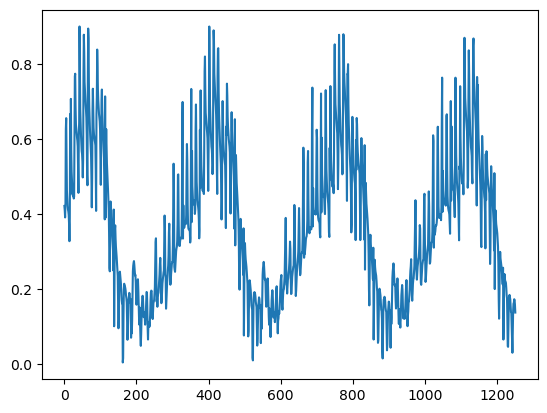

In [33]:
plt.plot(full_data[2][0][3])

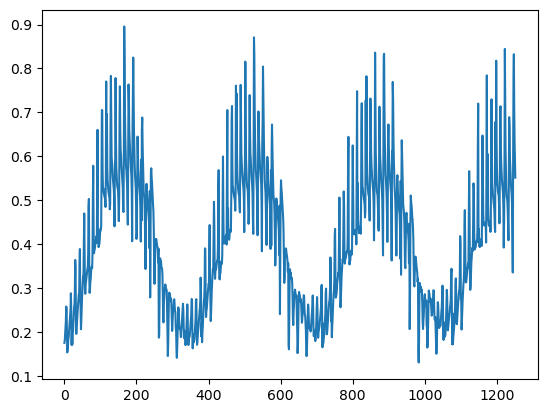

In [11]:
plt.plot(full_data[2][1][3])

In [ ]:
# import shutil
# shutil.rmtree("./attention_models")

In [47]:
# import os
# os.remove("attention_model_1.h5")
# os.remove("attention_model.h5")

In [647]:
tf.debugging.set_log_device_placement(True)
a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
c = tf.matmul(a, b)
print(c)

tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)


In [602]:
print(lstm_y_valid[:, 0])

[[0.54423796]
 [0.44021328]
 [0.35136779]
 ...
 [0.28505597]
 [0.2620818 ]
 [0.25042001]]


history = 

In [ ]:
input_train = Input(shape=(X_input_train.shape[1], X_input_train.shape[2]-1))
output_train = Input(shape=(X_output_train.shape[1], X_output_train.shape[2]-1))
print(input_train)
print(output_train)

In [502]:
n_hidden = 100

encoder_last_h1, encoder_last_h2, encoder_last_c = keras.layers.LSTM(n_hidden,
                                                        activation='relu', 
                                                        dropout=0.2, 
                                                        recurrent_dropout=0.2,
                                                       return_sequences=False,
                                                       return_state=True)(lstm_X_train)


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



In [504]:
encder_last_h1 = keras.layers.BatchNormalization(momentum=0.6)(encoder_last_h1)
encder_last_c = keras.layers.BatchNormalization(momentum=0.6)(encoder_last_c)

In [508]:
y_step = 3
decoder = keras.layers.RepeatVector(y_step)(encoder_last_h1)
decoder = keras.layers.LSTM(n_hidden,
               activation='relu', 
               dropout=0.2, 
               recurrent_dropout=0.2,
               return_sequences=True,
               return_state=False)(decoder, initial_state=[encoder_last_h1, encoder_last_c])

In [511]:
out= keras.layers.TimeDistributed(keras.layers.Dense(1))(decoder)

In [513]:
model = keras.Model(inputs = lstm_X_train, outputs = out)
opt = Adam(lr = 0.01, clipnorm = 1)
model.compile(loss='mean_squared_error', optimizer = opt, metrics = ['mae'])
model.summary()

AttributeError: Tensor.op is meaningless when eager execution is enabled.

In [ ]:
epc = 100
es = EarlyStopping(monitor='val_loss', mode='min', patience = 50)
history = model.fit(X_input_train[:,:,:2], X_output_train[:,:,:2], validation_split=0.2,
                    epochs=epc, verbose =1 , callbacks=[es],
                    batch_size=100)
train_mae = history.history['mae']
valid_mae = history.history['val_mae']
model.save('model_forecasting_seq2seq.h5')

In [ ]:
plt.plot(train_mae, label='train mae')
plt.plot(valid_mae, label='validation mae')
plt.ylabel('mae')
plt.xlabel('epoch')
plt.title('train vs. validation accuracy (mae)')
plt.legend(loc = 'upper center', bbox_to_anchor=(0.5,-0.15), fancybox=True, shadow=False, ncol=2)
plt.show()

## Bi-LSTM

In [11]:
def Bi_Seq2_model(feature_num, time_step, y_step):

    model = keras.Sequential()
    model.add(keras.layers.Bidirectional(keras.layers.LSTM(128, activation = 'relu', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal')))
    model.add(keras.layers.Bidirectional(keras.layers.LSTM(64, activation = 'relu')))
    model.add(keras.layers.RepeatVector(y_step))
    model.add(keras.layers.LSTM(64, activation = 'relu', return_sequences = True))
    model.add(keras.layers.LSTM(128, activation = 'relu', return_sequences = True))
    model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
    #model.compile(optimizer = 'nadam', loss = 'mse')
    #model.summary()
    
    return model

In [12]:
def Bi_Seq2_fit(model, X_train, y_train, X_valid, y_valid, time_step = 8, patience = 50, epochs = 1000):
    
    #adam = tf.keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon= None, decay=0.0, amsgrad=False)
    #nadam = tf.keras.optimizers.experimental.Nadam
    model.compile(loss='mean_squared_error', optimizer = 'nadam')
    early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience = patience)

    #model_path = 'model'
    #filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    #checkpoint = keras.callbacks.ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    
    history = model.fit(X_train, y_train, 
                        epochs = epochs,
                        validation_data = (X_valid, y_valid), 
                        callbacks = [early_stop],
                        shuffle = False)
    return history

Epoch 1/1000
157/157 [==============================] - 11s 70ms/step - loss: 0.0232 - val_loss: 0.0604
Epoch 2/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0051 - val_loss: 0.0404
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0036 - val_loss: 0.0294
Epoch 4/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0028 - val_loss: 0.0264
Epoch 5/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0022 - val_loss: 0.0233
Epoch 6/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0021 - val_loss: 0.0224
Epoch 7/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0017 - val_loss: 0.0216
Epoch 8/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0015 - val_loss: 0.0214
Epoch 9/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0014 - val_loss: 0.0205
Epoch 10/1000
157/157 [==============================] - 10s 67m

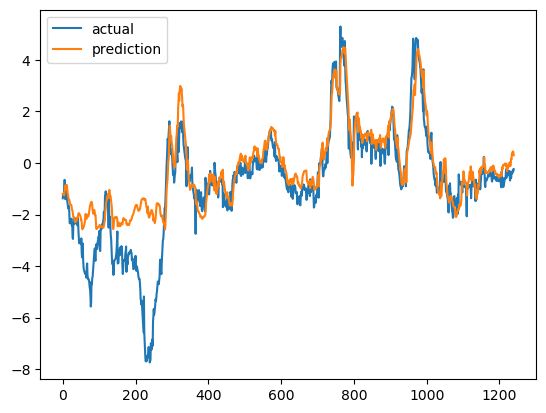

{'mae': 0    0.800812
dtype: float64, 'mape': 0    22.936793
dtype: float64, 'mse': 0    2.393651
dtype: float64}


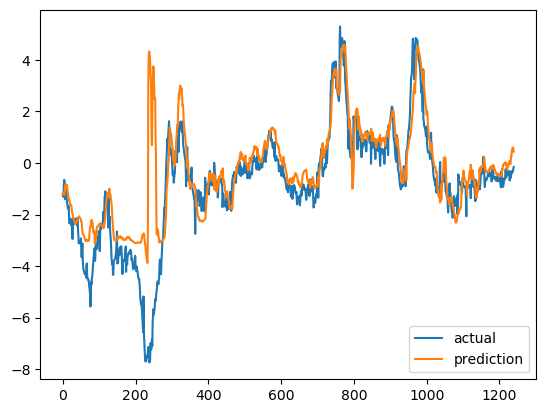

{'mae': 0    0.859759
dtype: float64, 'mape': 0    38.552728
dtype: float64, 'mse': 0    1.658635
dtype: float64}


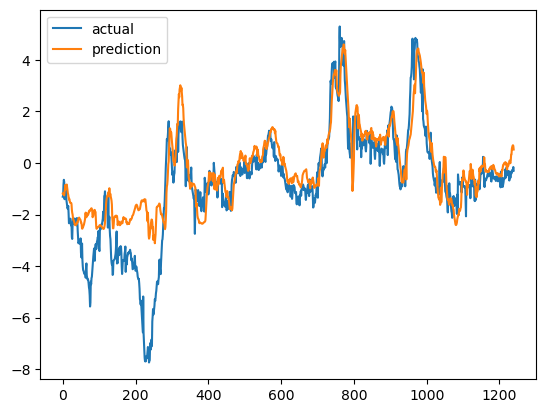

Epoch 1/1000
157/157 [==============================] - 11s 67ms/step - loss: 0.0244 - val_loss: 0.0837
Epoch 2/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0100 - val_loss: 0.0669
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0064 - val_loss: 0.0397
Epoch 4/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0047 - val_loss: 0.0304
Epoch 5/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0037 - val_loss: 0.0316
Epoch 6/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0035 - val_loss: 0.0294
Epoch 7/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0036 - val_loss: 0.0289
Epoch 8/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0032 - val_loss: 0.0280
Epoch 9/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0031 - val_loss: 0.0270
Epoch 10/1000
157/157 [==============================] - 10s 65m

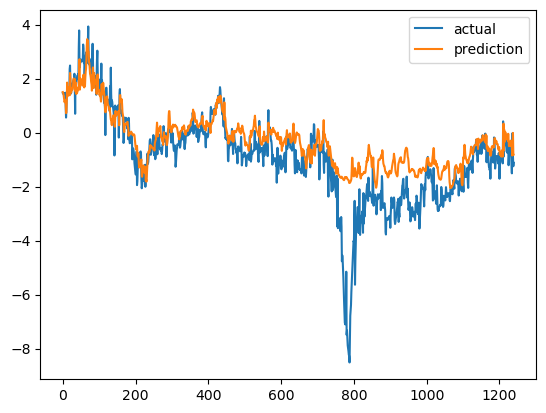

{'mae': 0    0.875848
dtype: float64, 'mape': 0   -49.773254
dtype: float64, 'mse': 0    1.629617
dtype: float64}


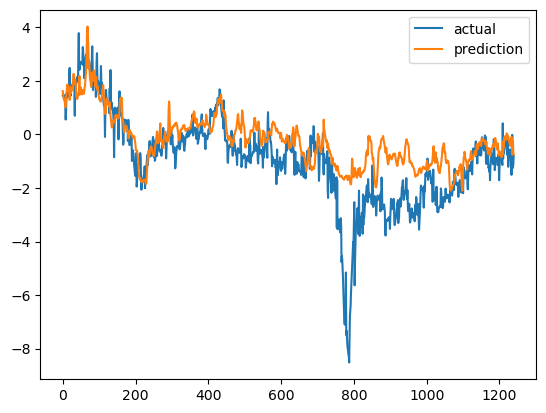

{'mae': 0    0.941758
dtype: float64, 'mape': 0   -53.275845
dtype: float64, 'mse': 0    1.839591
dtype: float64}


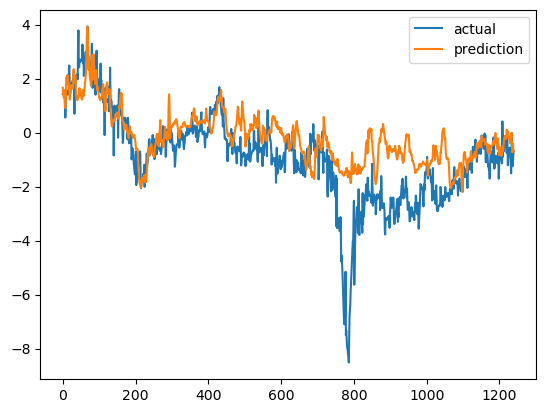

Epoch 1/1000
157/157 [==============================] - 11s 69ms/step - loss: 0.0374 - val_loss: 0.0046
Epoch 2/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0058 - val_loss: 0.0034
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0032 - val_loss: 0.0030
Epoch 4/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 5/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0024 - val_loss: 0.0028
Epoch 6/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0023 - val_loss: 0.0027
Epoch 7/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0022 - val_loss: 0.0029
Epoch 8/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0022 - val_loss: 0.0028
Epoch 9/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0021 - val_loss: 0.0030
Epoch 10/1000
157/157 [==============================] - 10s 61m

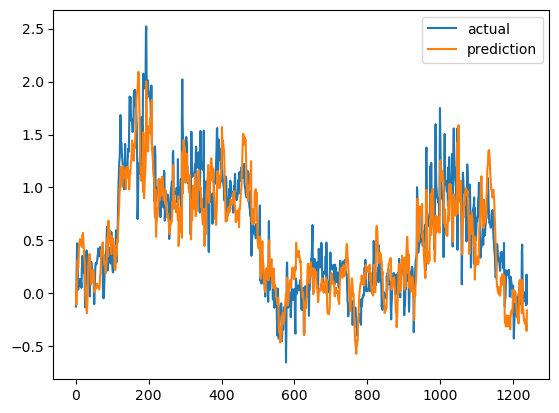

{'mae': 0    0.273016
dtype: float64, 'mape': 0    80.633496
dtype: float64, 'mse': 0    0.126681
dtype: float64}


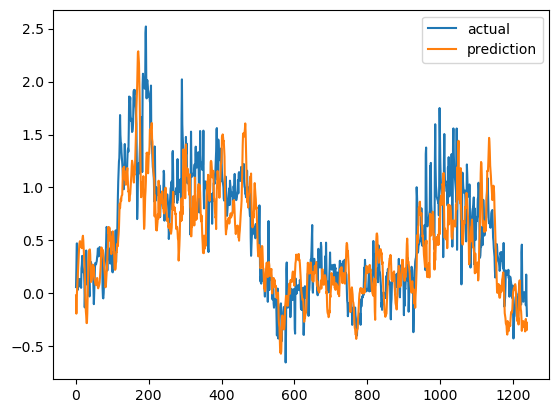

{'mae': 0    0.275882
dtype: float64, 'mape': 0    91.688526
dtype: float64, 'mse': 0    0.132359
dtype: float64}


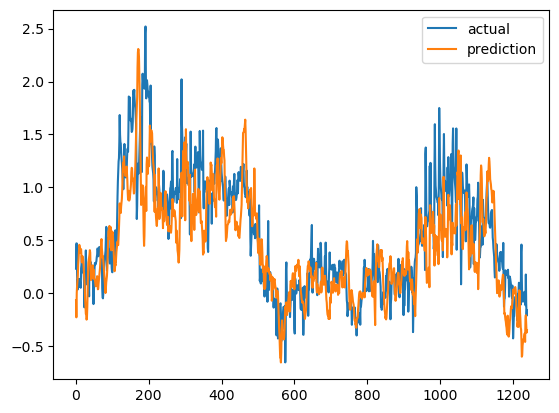

Epoch 1/1000
157/157 [==============================] - 11s 67ms/step - loss: 0.0530 - val_loss: 0.0032
Epoch 2/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0048 - val_loss: 0.0029
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0038 - val_loss: 0.0025
Epoch 4/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0024 - val_loss: 0.0014
Epoch 5/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0028 - val_loss: 0.0014
Epoch 6/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0018 - val_loss: 9.7981e-04
Epoch 7/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0011 - val_loss: 7.1461e-04
Epoch 8/1000
157/157 [==============================] - 10s 62ms/step - loss: 8.5090e-04 - val_loss: 5.9484e-04
Epoch 9/1000
157/157 [==============================] - 10s 63ms/step - loss: 6.9091e-04 - val_loss: 4.5355e-04
Epoch 10/1000
157/157 [=================

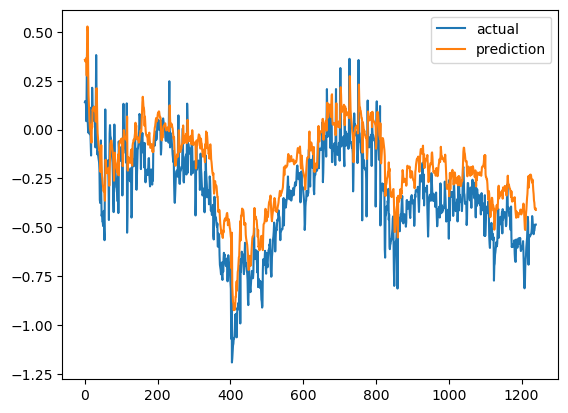

{'mae': 0    0.164606
dtype: float64, 'mape': 0   -54.914339
dtype: float64, 'mse': 0    0.035872
dtype: float64}


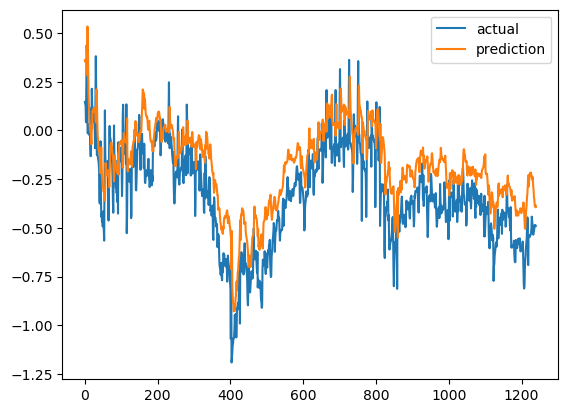

{'mae': 0    0.167978
dtype: float64, 'mape': 0   -51.516976
dtype: float64, 'mse': 0    0.037991
dtype: float64}


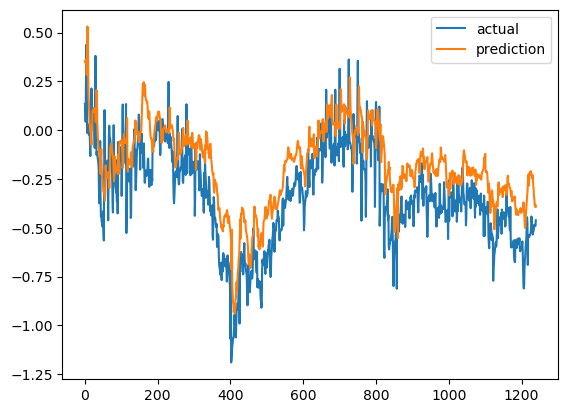

Epoch 1/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0266 - val_loss: 0.0455
Epoch 2/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0060 - val_loss: 0.0375
Epoch 3/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.0042 - val_loss: 0.0321
Epoch 4/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0036 - val_loss: 0.0276
Epoch 5/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0033 - val_loss: 0.0257
Epoch 6/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0031 - val_loss: 0.0252
Epoch 7/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0030 - val_loss: 0.0248
Epoch 8/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0029 - val_loss: 0.0245
Epoch 9/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0028 - val_loss: 0.0245
Epoch 10/1000
157/157 [==============================] - 10s 64m

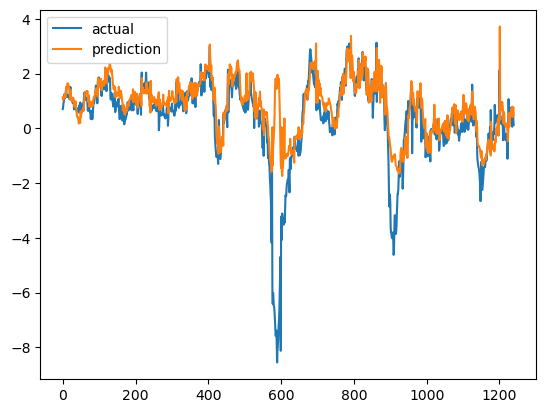

{'mae': 0    0.703662
dtype: float64, 'mape': 0   -533.028756
dtype: float64, 'mse': 0    1.607776
dtype: float64}


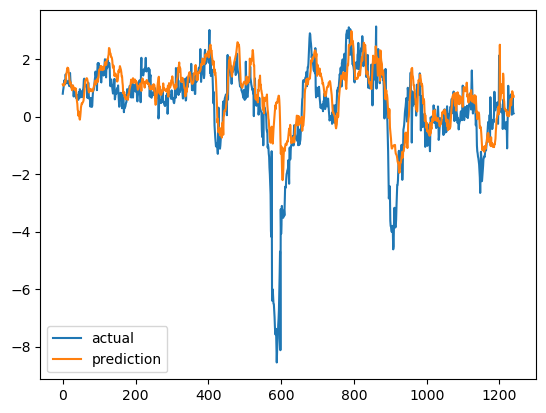

{'mae': 0    0.728573
dtype: float64, 'mape': 0   -536.571486
dtype: float64, 'mse': 0    1.461971
dtype: float64}


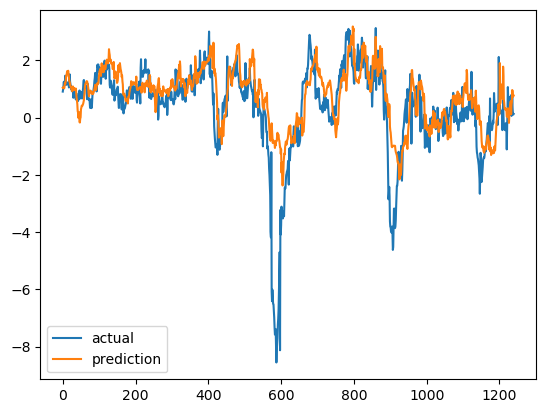

Epoch 1/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0319 - val_loss: 0.0043
Epoch 2/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0045 - val_loss: 0.0016
Epoch 3/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0020 - val_loss: 0.0013
Epoch 4/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 5/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0015 - val_loss: 0.0012
Epoch 6/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 7/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 8/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0013 - val_loss: 0.0012
Epoch 9/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 10/1000
157/157 [==============================] - 10s 66m

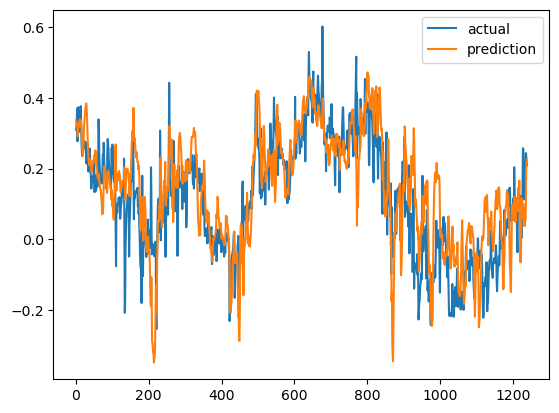

{'mae': 0    0.087535
dtype: float64, 'mape': 0   -42.657391
dtype: float64, 'mse': 0    0.012875
dtype: float64}


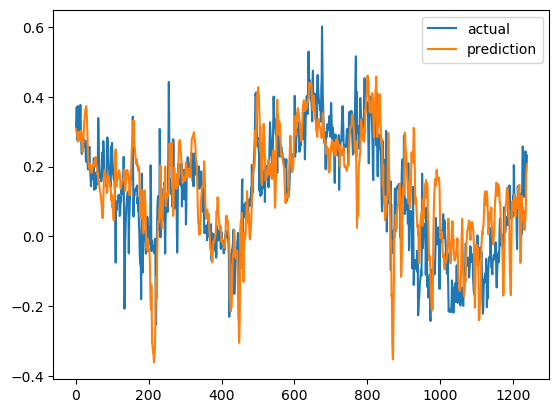

{'mae': 0    0.09212
dtype: float64, 'mape': 0   -40.697627
dtype: float64, 'mse': 0    0.014213
dtype: float64}


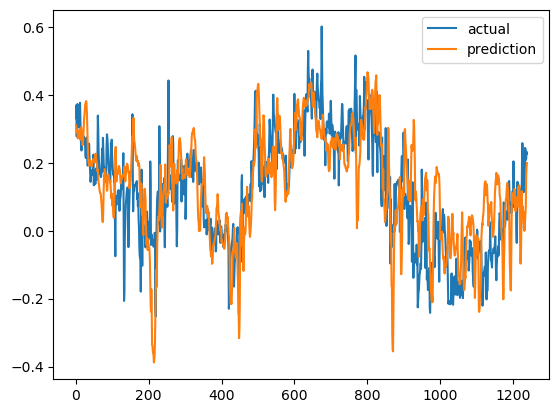

Epoch 1/1000
157/157 [==============================] - 11s 69ms/step - loss: 0.0335 - val_loss: 0.0014
Epoch 2/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0056 - val_loss: 4.1091e-04
Epoch 3/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0031 - val_loss: 5.0234e-04
Epoch 4/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0032 - val_loss: 5.2543e-04
Epoch 5/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0018 - val_loss: 3.2437e-04
Epoch 6/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0015 - val_loss: 2.9149e-04
Epoch 7/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0013 - val_loss: 2.7944e-04
Epoch 8/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0014 - val_loss: 3.1842e-04
Epoch 9/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0013 - val_loss: 2.4117e-04
Epoch 10/1000
157/157 [=========

In [ ]:
# CHECK!!!! resid
#이걸 돌리면 된다.
for i in range(7):
    time_step = 10
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[4][i][0], scaled_data[4][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[4][i][2], scaled_data[4][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[4][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[4][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[4][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[4][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

Epoch 1/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0363 - val_loss: 0.0014
Epoch 2/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0051 - val_loss: 4.7439e-04
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0028 - val_loss: 3.9337e-04
Epoch 4/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0019 - val_loss: 4.8003e-04
Epoch 5/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0016 - val_loss: 3.9793e-04
Epoch 6/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0016 - val_loss: 4.5254e-04
Epoch 7/1000
157/157 [==============================] - 11s 67ms/step - loss: 0.0013 - val_loss: 3.4147e-04
Epoch 8/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0013 - val_loss: 3.0691e-04
Epoch 9/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0012 - val_loss: 2.4477e-04
Epoch 10/1000
157/157 [=========

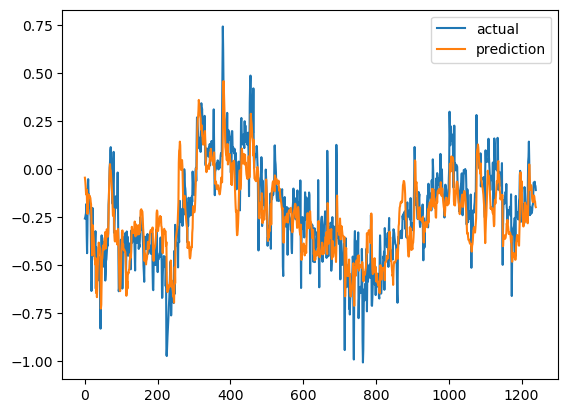

{'mae': 0    0.124311
dtype: float64, 'mape': 0   -80.313298
dtype: float64, 'mse': 0    0.025621
dtype: float64}


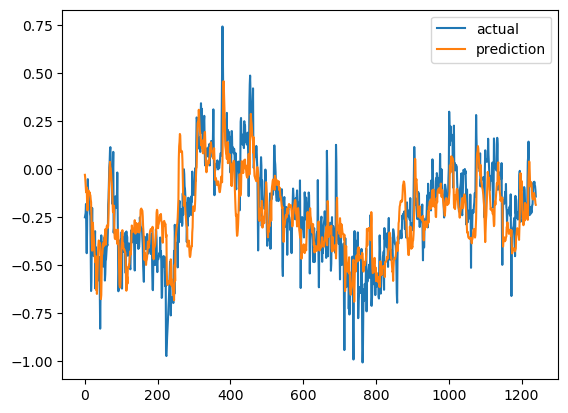

{'mae': 0    0.130739
dtype: float64, 'mape': 0   -70.958522
dtype: float64, 'mse': 0    0.028498
dtype: float64}


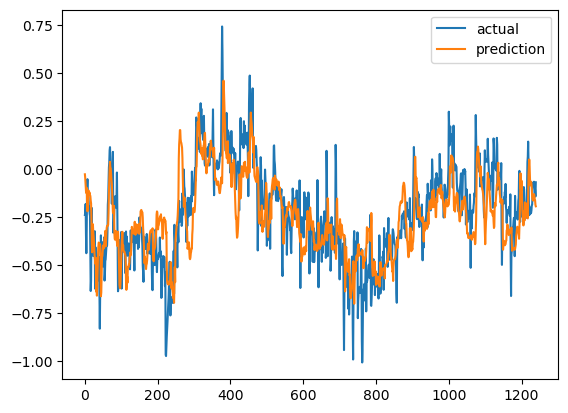

In [37]:
# CHECK!!!! resid
#이걸 돌리면 된다.
for i in [6]:
    time_step = 10
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[4][i][0], scaled_data[4][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[4][i][2], scaled_data[4][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[4][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[4][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[4][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[4][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

{'mae': 0    0.113888
dtype: float64, 'mape': 0   -83.982095
dtype: float64, 'mse': 0    0.020568
dtype: float64}


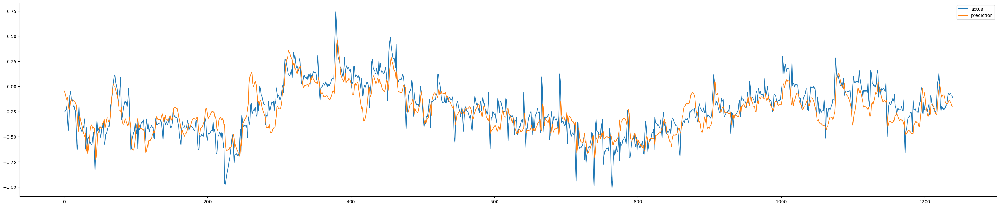

{'mae': 0    0.124311
dtype: float64, 'mape': 0   -80.313298
dtype: float64, 'mse': 0    0.025621
dtype: float64}


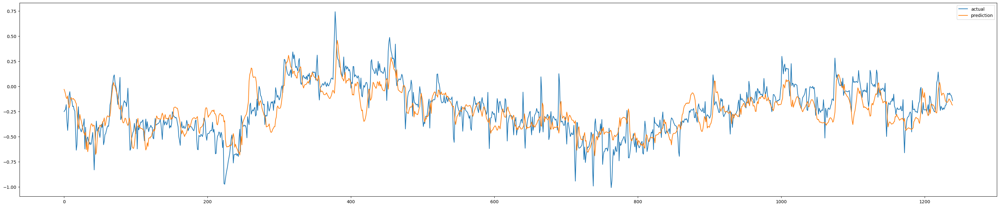

{'mae': 0    0.130739
dtype: float64, 'mape': 0   -70.958522
dtype: float64, 'mse': 0    0.028498
dtype: float64}


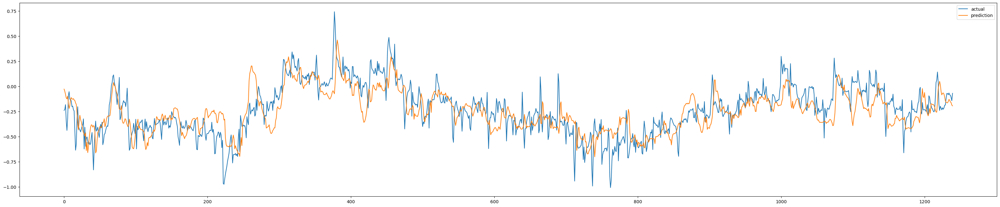

In [38]:
for j in range(y_step):
    plt.figure(figsize=(40,8))
    print(calculate_metrics(inverse_min_max_scaling(scaler_y[4][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[4][i], pred[:, j])))
    plt.plot(inverse_min_max_scaling(scaler_y[4][i], lstm_y_valid[:, j]), label = 'actual')
    plt.plot(inverse_min_max_scaling(scaler_y[4][i], pred[:, j]), label = 'prediction')
    plt.legend()
    plt.show()

In [36]:
scaled_data[4][0]

[[             0         1         2         3         4
  0     0.312854  0.562701  0.375290  0.488835  0.644143
  1     0.306964  0.563393  0.373943  0.503619  0.624109
  2     0.302795  0.563558  0.372099  0.516768  0.603819
  3     0.300349  0.563875  0.369872  0.528285  0.584803
  4     0.296274  0.551729  0.366265  0.532213  0.563714
  ...        ...       ...       ...       ...       ...
  5003  0.205815  0.875729  0.329467  0.403200  0.342340
  5004  0.212809  0.832761  0.351567  0.423789  0.349696
  5005  0.211987  0.771915  0.368422  0.432310  0.347673
  5006  0.200675  0.678536  0.379079  0.421597  0.333100
  5007  0.212634  0.675465  0.395022  0.453546  0.329895
  
  [5008 rows x 5 columns],
               0
  0     0.324671
  1     0.334174
  2     0.338139
  3     0.339005
  4     0.338248
  ...        ...
  5003  0.151902
  5004  0.155324
  5005  0.152732
  5006  0.174887
  5007  0.186673
  
  [5008 rows x 1 columns],
               0         1         2         3      

Epoch 1/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0277 - val_loss: 0.0102
Epoch 2/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0083 - val_loss: 0.0095
Epoch 3/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0066 - val_loss: 0.0093
Epoch 4/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0062 - val_loss: 0.0090
Epoch 5/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0059 - val_loss: 0.0086
Epoch 6/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0056 - val_loss: 0.0069
Epoch 7/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0051 - val_loss: 0.0171
Epoch 8/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0049 - val_loss: 0.0068
Epoch 9/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0044 - val_loss: 0.0059
Epoch 10/1000
157/157 [==============================] - 10s 64m

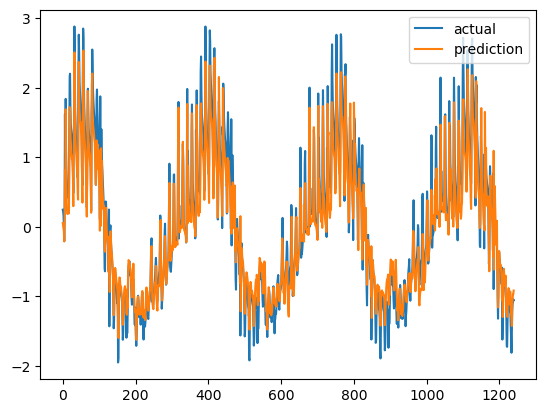

{'mae': 0    0.23762
dtype: float64, 'mape': 0   -8.713377
dtype: float64, 'mse': 0    0.106017
dtype: float64}


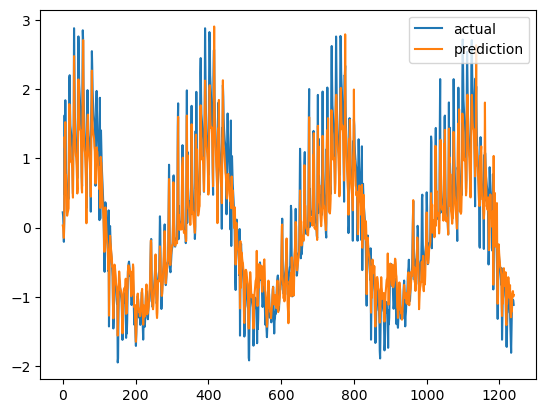

{'mae': 0    0.23281
dtype: float64, 'mape': 0    11.910775
dtype: float64, 'mse': 0    0.103694
dtype: float64}


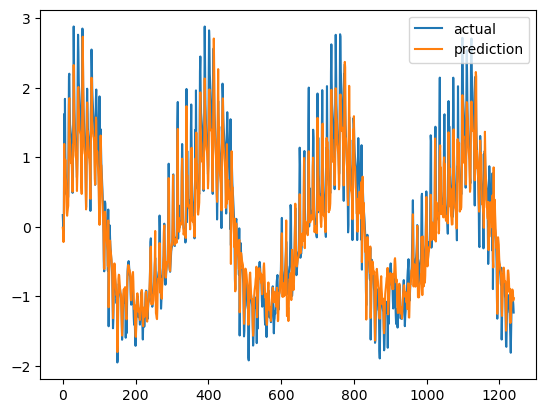

Epoch 1/1000
157/157 [==============================] - 11s 70ms/step - loss: 0.0278 - val_loss: 0.0108
Epoch 2/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 3/1000
157/157 [==============================] - 11s 67ms/step - loss: 0.0081 - val_loss: 0.0077
Epoch 4/1000
157/157 [==============================] - 11s 67ms/step - loss: 0.0068 - val_loss: 0.0071
Epoch 5/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0060 - val_loss: 0.0067
Epoch 6/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0056 - val_loss: 0.0060
Epoch 7/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0054 - val_loss: 0.0059
Epoch 8/1000
157/157 [==============================] - 11s 68ms/step - loss: 0.0050 - val_loss: 0.0053
Epoch 9/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0050 - val_loss: 0.0058
Epoch 10/1000
157/157 [==============================] - 10s 66m

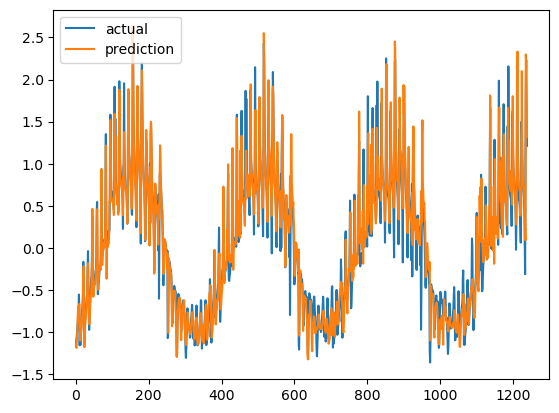

{'mae': 0    0.188323
dtype: float64, 'mape': 0   -136.119364
dtype: float64, 'mse': 0    0.091605
dtype: float64}


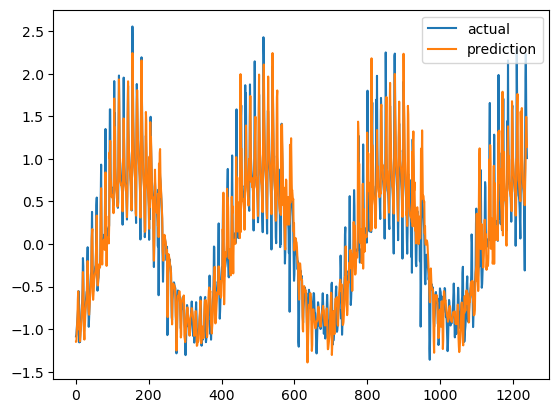

{'mae': 0    0.191101
dtype: float64, 'mape': 0   -36.508508
dtype: float64, 'mse': 0    0.079226
dtype: float64}


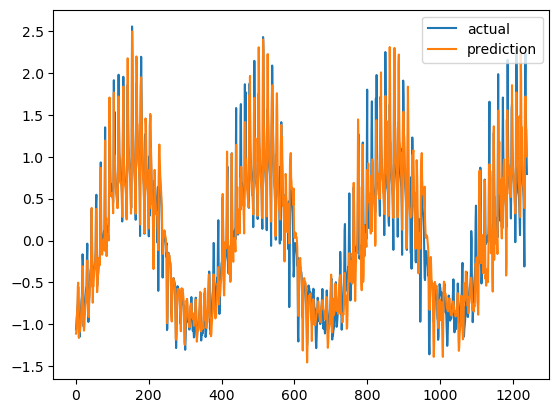

Epoch 1/1000
157/157 [==============================] - 11s 68ms/step - loss: 0.0369 - val_loss: 0.0094
Epoch 2/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0112 - val_loss: 0.0095
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0109 - val_loss: 0.0115
Epoch 4/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0099 - val_loss: 0.0118
Epoch 5/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0024 - val_loss: 0.0037
Epoch 35/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0024 - val_loss: 0.0062
Epoch 36/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0027 - val_loss: 0.0034
Epoch 37/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0024 - val_loss: 0.0051
Epoch 38/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0023 - val_loss: 0.0039
Epoch 39/1000
157/157 [==============================] - 10s

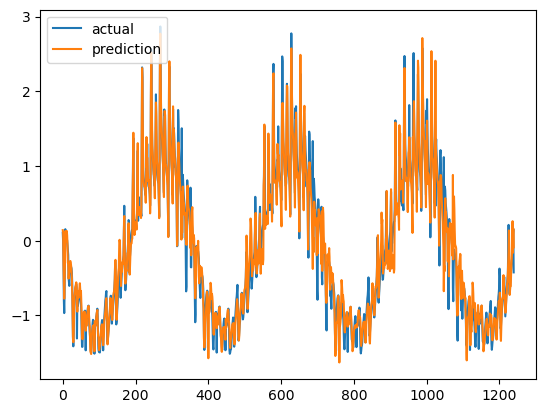

{'mae': 0    0.173051
dtype: float64, 'mape': 0   -1.520604
dtype: float64, 'mse': 0    0.066253
dtype: float64}


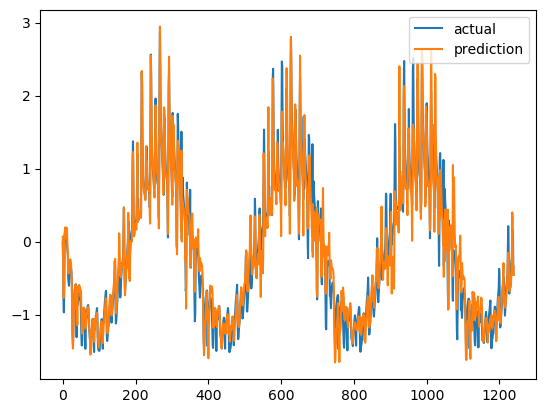

{'mae': 0    0.182143
dtype: float64, 'mape': 0   -8.6603
dtype: float64, 'mse': 0    0.069246
dtype: float64}


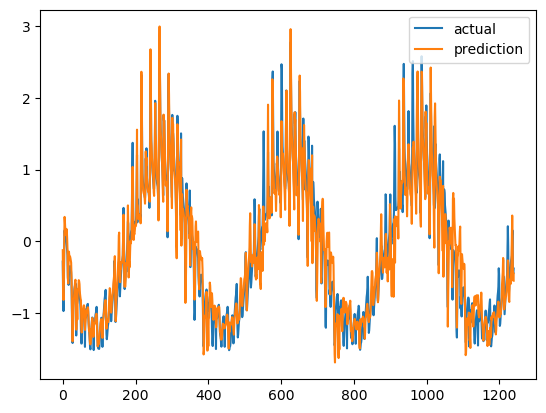

Epoch 1/1000
157/157 [==============================] - 11s 69ms/step - loss: 0.0242 - val_loss: 0.0271
Epoch 2/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0073 - val_loss: 0.0084
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0053 - val_loss: 0.0071
Epoch 4/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0051 - val_loss: 0.0070
Epoch 5/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0047 - val_loss: 0.0063
Epoch 6/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0046 - val_loss: 0.0059
Epoch 7/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0043 - val_loss: 0.0054
Epoch 8/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0041 - val_loss: 0.0053
Epoch 9/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0040 - val_loss: 0.0057
Epoch 10/1000
157/157 [==============================] - 10s 62m

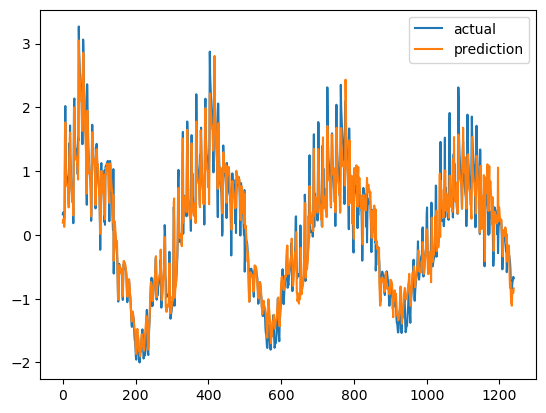

{'mae': 0    0.210063
dtype: float64, 'mape': 0   -897.31443
dtype: float64, 'mse': 0    0.096623
dtype: float64}


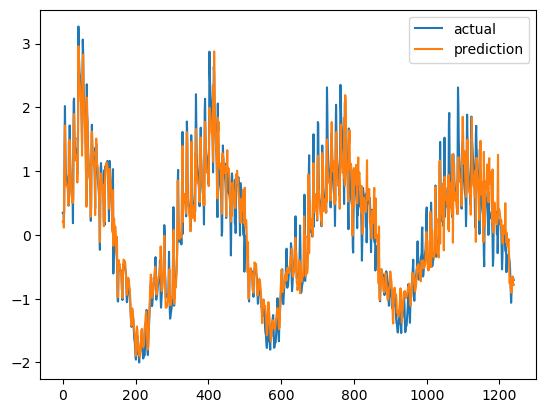

{'mae': 0    0.207812
dtype: float64, 'mape': 0   -856.858732
dtype: float64, 'mse': 0    0.09336
dtype: float64}


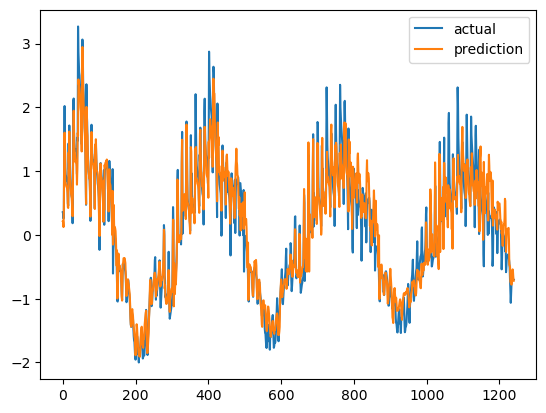

Epoch 1/1000
157/157 [==============================] - 11s 67ms/step - loss: 0.0339 - val_loss: 0.0133
Epoch 2/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0092 - val_loss: 0.0149
Epoch 3/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0081 - val_loss: 0.0134
Epoch 4/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0076 - val_loss: 0.0135
Epoch 5/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0069 - val_loss: 0.0134
Epoch 6/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0062 - val_loss: 0.0098
Epoch 7/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0057 - val_loss: 0.0090
Epoch 8/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0051 - val_loss: 0.0104
Epoch 9/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0049 - val_loss: 0.0082
Epoch 10/1000
157/157 [==============================] - 10s 63m

In [ ]:
# CHECK!!!! seasonal_360
#time_step = 10, patience = 10, epochs = 300 했더니 꽤나 좋았다
#time_step = 50, patience = 100 했더니 오히려 안 좋음
#time_step = 10, patience = 100 오 개조아
#이걸 돌리면 된다.
for i in range(7):
    time_step = 10
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[2][i][0], scaled_data[2][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[2][i][2], scaled_data[2][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[2][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[2][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

2023-10-14 18:50:06.199427: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2023-10-14 18:50:06.249835: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:d8:00.0 name: Tesla V100-PCIE-32GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 31.72GiB deviceMemoryBandwidth: 836.37GiB/s
2023-10-14 18:50:06.249882: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2023-10-14 18:50:06.251817: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-14 18:50:06.254010: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2023-10-14 18:50:06.254373: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/1000


2023-10-14 18:50:12.154258: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


157/157 [==============================] - 11s 70ms/step - loss: 0.0306 - val_loss: 0.0071
Epoch 2/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0115 - val_loss: 0.0059
Epoch 3/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0092 - val_loss: 0.0053
Epoch 4/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0086 - val_loss: 0.0051
Epoch 5/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0076 - val_loss: 0.0041
Epoch 6/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0067 - val_loss: 0.0045
Epoch 7/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0060 - val_loss: 0.0044
Epoch 8/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0058 - val_loss: 0.0043
Epoch 9/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0053 - val_loss: 0.0059
Epoch 10/1000
157/157 [==============================] - 10s 65ms/step - loss

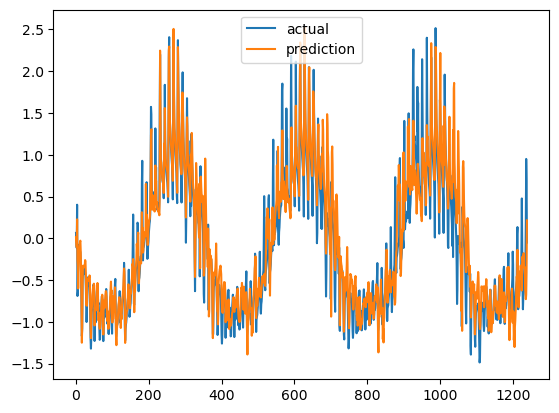

{'mae': 0    0.230301
dtype: float64, 'mape': 0    61.634689
dtype: float64, 'mse': 0    0.121373
dtype: float64}


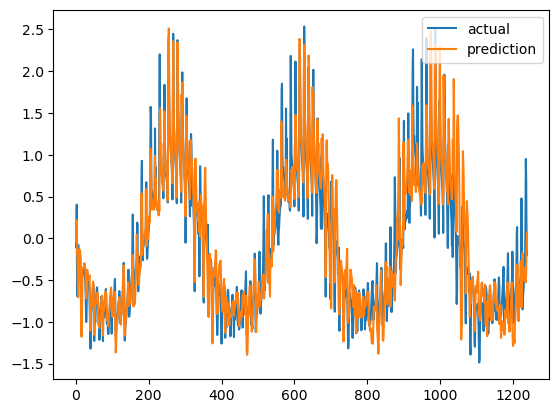

{'mae': 0    0.213742
dtype: float64, 'mape': 0    38.511427
dtype: float64, 'mse': 0    0.099831
dtype: float64}


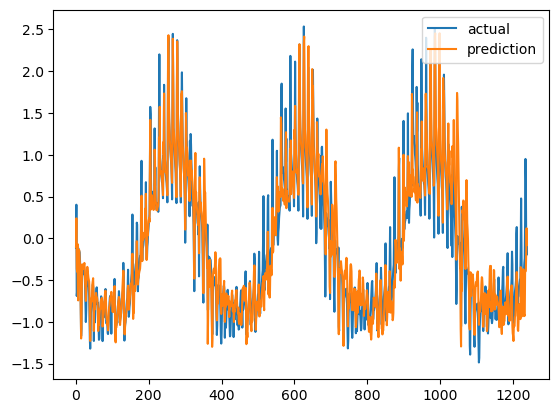

Epoch 1/1000
157/157 [==============================] - 11s 70ms/step - loss: 0.0504 - val_loss: 0.0163
Epoch 2/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0101 - val_loss: 0.0108
Epoch 3/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0082 - val_loss: 0.0098
Epoch 4/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0073 - val_loss: 0.0106
Epoch 5/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0068 - val_loss: 0.0102
Epoch 6/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0062 - val_loss: 0.0108
Epoch 7/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0057 - val_loss: 0.0219
Epoch 8/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0056 - val_loss: 0.0094
Epoch 9/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0050 - val_loss: 0.0115
Epoch 10/1000
157/157 [==============================] - 10s 65m

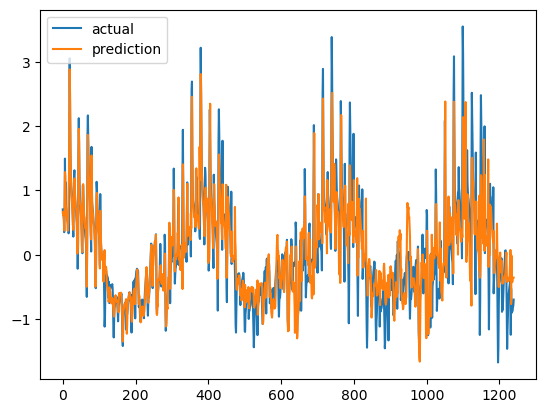

{'mae': 0    0.340325
dtype: float64, 'mape': 0   -85.037627
dtype: float64, 'mse': 0    0.294543
dtype: float64}


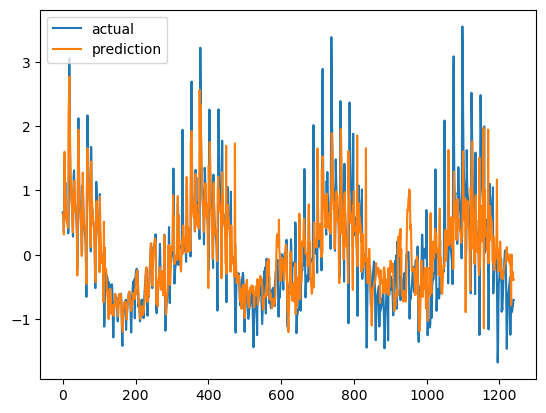

{'mae': 0    0.349359
dtype: float64, 'mape': 0   -43.707751
dtype: float64, 'mse': 0    0.322483
dtype: float64}


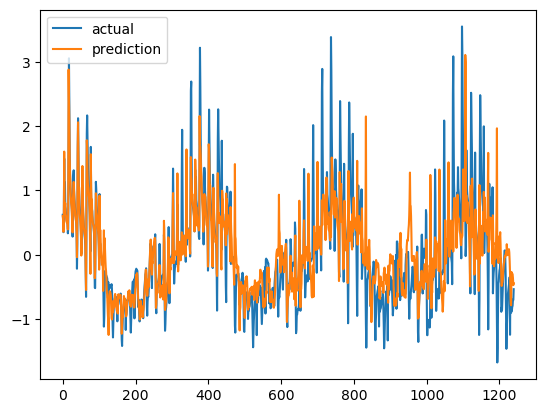

In [13]:
# CHECK!!!! seasonal_360
#time_step = 10, patience = 10, epochs = 300 했더니 꽤나 좋았다
#time_step = 50, patience = 100 했더니 오히려 안 좋음
#time_step = 10, patience = 100 오 개조아
#이걸 돌리면 된다.
for i in [5, 6]:
    time_step = 10
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[2][i][0], scaled_data[2][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[2][i][2], scaled_data[2][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[2][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[2][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

Epoch 1/1000
157/157 [==============================] - 11s 68ms/step - loss: 0.0285 - val_loss: 0.0134
Epoch 2/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0092 - val_loss: 0.0140
Epoch 3/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0083 - val_loss: 0.0118
Epoch 4/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0079 - val_loss: 0.0118
Epoch 5/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0074 - val_loss: 0.0115
Epoch 6/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0068 - val_loss: 0.0095
Epoch 7/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0064 - val_loss: 0.0104
Epoch 8/1000
157/157 [==============================] - 9s 60ms/step - loss: 0.0059 - val_loss: 0.0091
Epoch 9/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.0055 - val_loss: 0.0128
Epoch 10/1000
157/157 [==============================] - 9s 60ms/

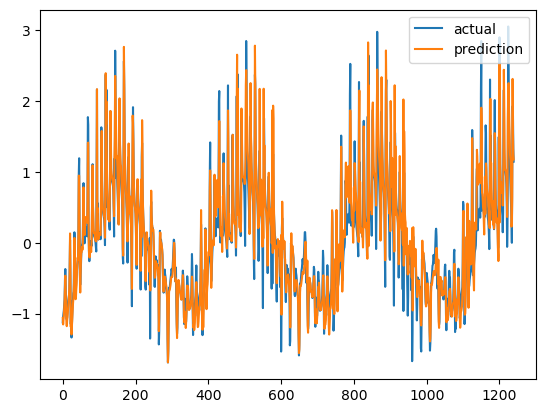

{'mae': 0    0.252782
dtype: float64, 'mape': 0   -25.887481
dtype: float64, 'mse': 0    0.167247
dtype: float64}


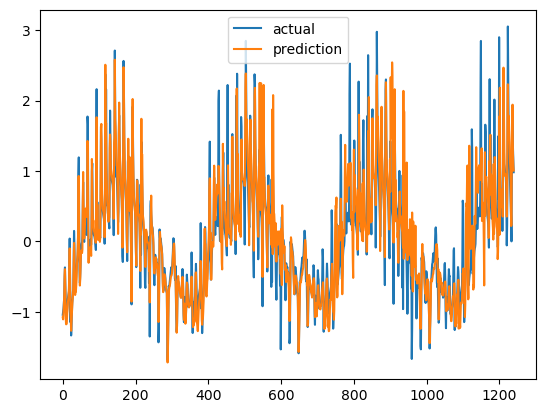

{'mae': 0    0.244706
dtype: float64, 'mape': 0    6.813495
dtype: float64, 'mse': 0    0.164143
dtype: float64}


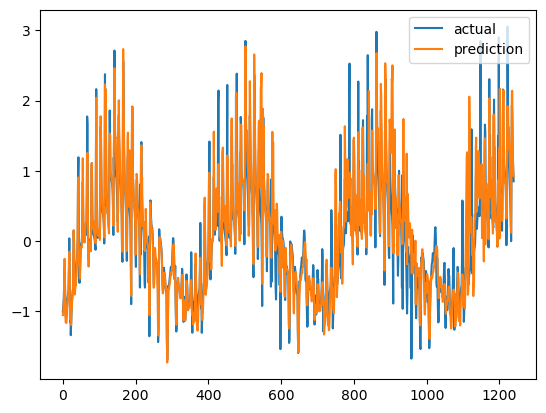

In [15]:
# CHECK!!!! seasonal_360
#time_step = 10, patience = 10, epochs = 300 했더니 꽤나 좋았다
#time_step = 50, patience = 100 했더니 오히려 안 좋음
#time_step = 10, patience = 100 오 개조아
#이걸 돌리면 된다.
for i in [4]:
    time_step = 10
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[2][i][0], scaled_data[2][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[2][i][2], scaled_data[2][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[2][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[2][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

Epoch 1/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0164 - val_loss: 0.0470
Epoch 2/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0054 - val_loss: 0.0329
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0053 - val_loss: 0.0300
Epoch 4/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0030 - val_loss: 0.0177
Epoch 5/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.0024 - val_loss: 0.0118
Epoch 6/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0020 - val_loss: 0.0123
Epoch 7/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.0018 - val_loss: 0.0091
Epoch 8/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.0017 - val_loss: 0.0106
Epoch 9/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0015 - val_loss: 0.0094
Epoch 10/1000
157/157 [==============================] - 10s 61m

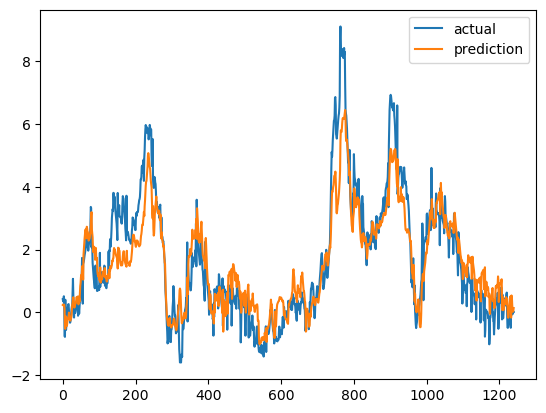

{'mae': 0    0.736785
dtype: float64, 'mape': 0    101.507772
dtype: float64, 'mse': 0    0.995799
dtype: float64}


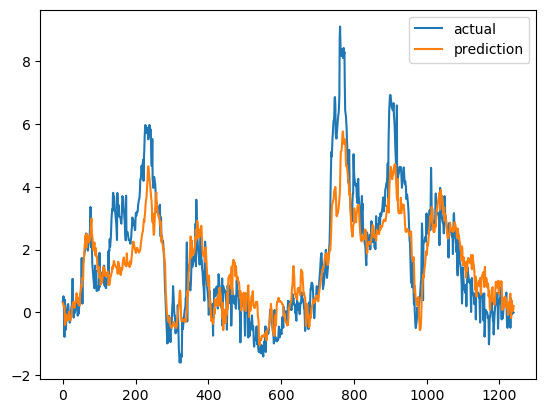

{'mae': 0    0.806662
dtype: float64, 'mape': 0    80.890887
dtype: float64, 'mse': 0    1.210181
dtype: float64}


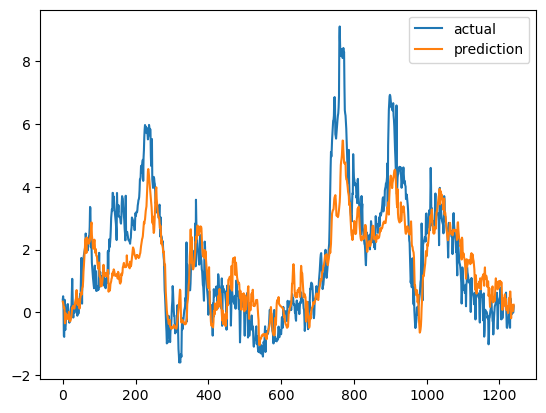

Epoch 1/1000
157/157 [==============================] - 11s 68ms/step - loss: 0.0331 - val_loss: 0.0444
Epoch 2/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0076 - val_loss: 0.0200
Epoch 3/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0052 - val_loss: 0.0169
Epoch 4/1000
157/157 [==============================] - 11s 67ms/step - loss: 0.0051 - val_loss: 0.0218
Epoch 5/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0048 - val_loss: 0.0166
Epoch 6/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0045 - val_loss: 0.0149
Epoch 7/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0043 - val_loss: 0.0149
Epoch 8/1000
157/157 [==============================] - 10s 66ms/step - loss: 0.0042 - val_loss: 0.0138
Epoch 9/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0040 - val_loss: 0.0144
Epoch 10/1000
157/157 [==============================] - 10s 63m

KeyboardInterrupt: 

In [106]:
# CHECK!!!! seasonal_8760
#time step 5, 10, 20, 50 중 10이 가장 좋다~
for i in range(7):
    time_step = 10
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[3][i][0], scaled_data[3][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[3][i][2], scaled_data[3][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[3][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[3][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[3][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[3][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

###### CHECK!!!! seasonal_8760
## 이걸 돌리면 된다.
#time_step = 10, patience = 10, epochs = 300 했더니 꽤나 좋았다
#time_step = 50, patience = 100 했더니 오히려 안 좋음
#time_step = 10, patience = 100 오 개조아
for i in range(7):
    time_step = 10
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[3][i][0], scaled_data[3][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[3][i][2], scaled_data[3][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[3][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[3][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[3][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[3][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

Epoch 1/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0182 - val_loss: 0.0267
Epoch 2/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0075 - val_loss: 0.0163
Epoch 3/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0057 - val_loss: 0.0140
Epoch 4/1000
156/156 [==============================] - 15s 98ms/step - loss: 0.0048 - val_loss: 0.0130
Epoch 5/1000
156/156 [==============================] - 15s 98ms/step - loss: 0.0042 - val_loss: 0.0121
Epoch 6/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0037 - val_loss: 0.0110
Epoch 7/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0033 - val_loss: 0.0098
Epoch 8/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0033 - val_loss: 0.0092
Epoch 9/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0028 - val_loss: 0.0078
Epoch 10/1000
156/156 [==============================] - 

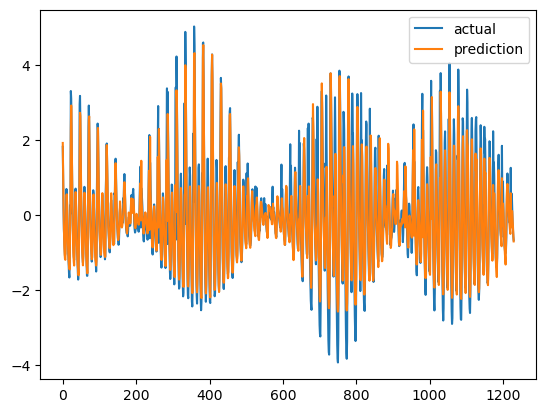

{'mae': 0    0.436914
dtype: float64, 'mape': 0    5.967015
dtype: float64, 'mse': 0    0.505246
dtype: float64}


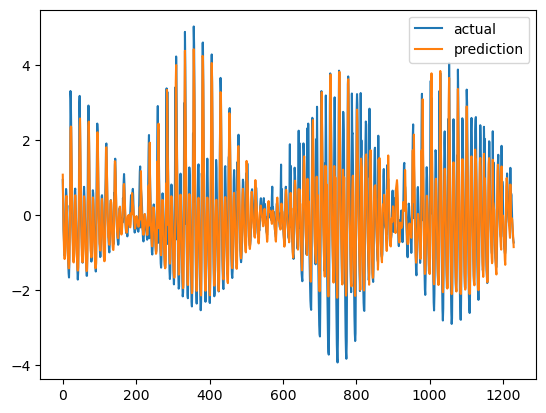

{'mae': 0    0.458168
dtype: float64, 'mape': 0    6.69855
dtype: float64, 'mse': 0    0.519114
dtype: float64}


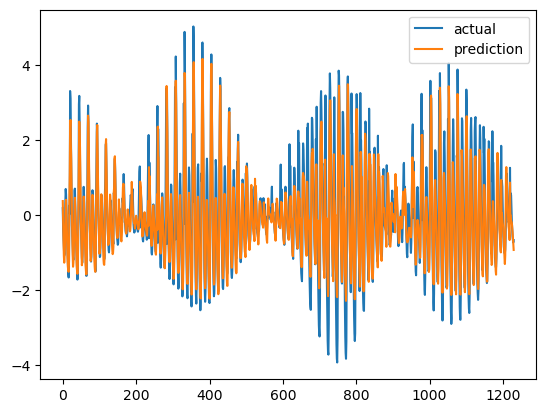

Epoch 1/1000
156/156 [==============================] - 16s 105ms/step - loss: 0.0337 - val_loss: 0.0183
Epoch 2/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0240 - val_loss: 0.0193
Epoch 3/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0104 - val_loss: 0.0120
Epoch 4/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0067 - val_loss: 0.0091
Epoch 5/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0078 - val_loss: 0.0077
Epoch 6/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0045 - val_loss: 0.0072
Epoch 7/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0037 - val_loss: 0.0070
Epoch 8/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0034 - val_loss: 0.0073
Epoch 9/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0031 - val_loss: 0.0067
Epoch 10/1000
156/156 [==============================] 

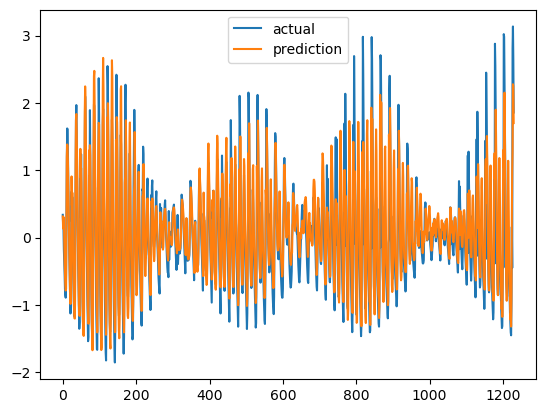

{'mae': 0    0.345963
dtype: float64, 'mape': 0    65.115618
dtype: float64, 'mse': 0    0.234238
dtype: float64}


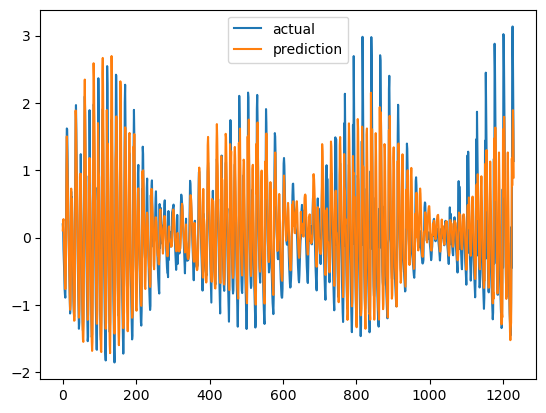

{'mae': 0    0.362528
dtype: float64, 'mape': 0    70.701617
dtype: float64, 'mse': 0    0.24996
dtype: float64}


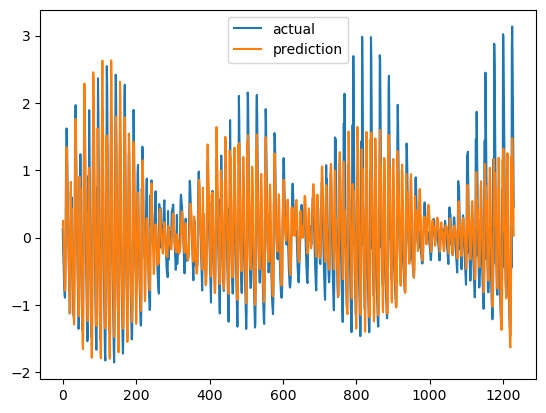

Epoch 1/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0245 - val_loss: 0.0092
Epoch 2/1000
156/156 [==============================] - 15s 97ms/step - loss: 0.0089 - val_loss: 0.0065
Epoch 3/1000
156/156 [==============================] - 15s 99ms/step - loss: 0.0062 - val_loss: 0.0053
Epoch 4/1000
156/156 [==============================] - 16s 99ms/step - loss: 0.0056 - val_loss: 0.0047
Epoch 5/1000
156/156 [==============================] - 16s 99ms/step - loss: 0.0045 - val_loss: 0.0042
Epoch 6/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0039 - val_loss: 0.0039
Epoch 7/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0038 - val_loss: 0.0043
Epoch 8/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0032 - val_loss: 0.0038
Epoch 9/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0029 - val_loss: 0.0037
Epoch 10/1000
156/156 [==============================] - 16

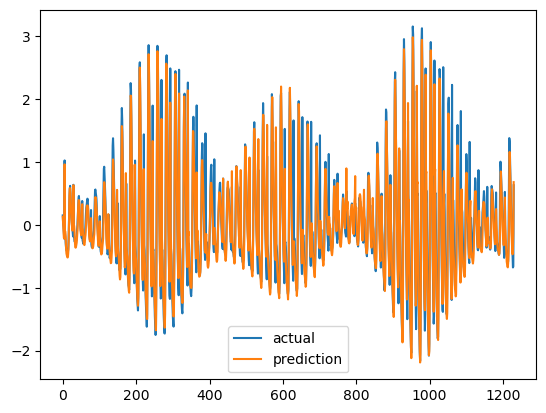

{'mae': 0    0.224114
dtype: float64, 'mape': 0   -118.016134
dtype: float64, 'mse': 0    0.147048
dtype: float64}


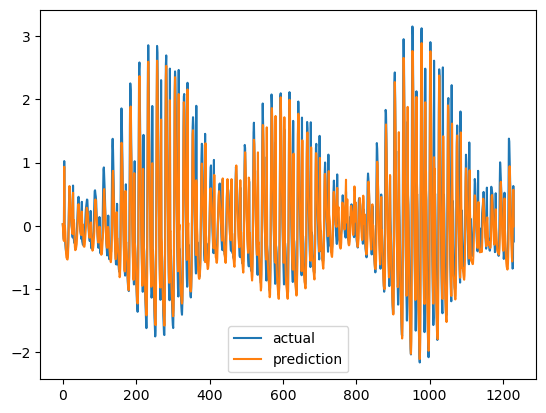

{'mae': 0    0.230721
dtype: float64, 'mape': 0   -114.62867
dtype: float64, 'mse': 0    0.152077
dtype: float64}


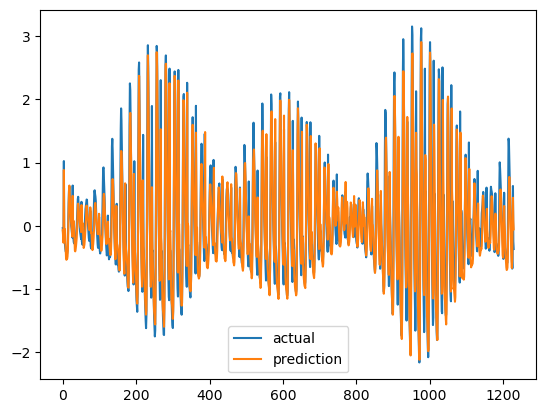

Epoch 1/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0182 - val_loss: 0.0189
Epoch 2/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0084 - val_loss: 0.0109
Epoch 3/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0050 - val_loss: 0.0117
Epoch 4/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0041 - val_loss: 0.0087
Epoch 5/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0035 - val_loss: 0.0080
Epoch 6/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0033 - val_loss: 0.0082
Epoch 7/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0030 - val_loss: 0.0079
Epoch 8/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0031 - val_loss: 0.0081
Epoch 9/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0026 - val_loss: 0.0062
Epoch 10/1000
156/156 [==============================] 

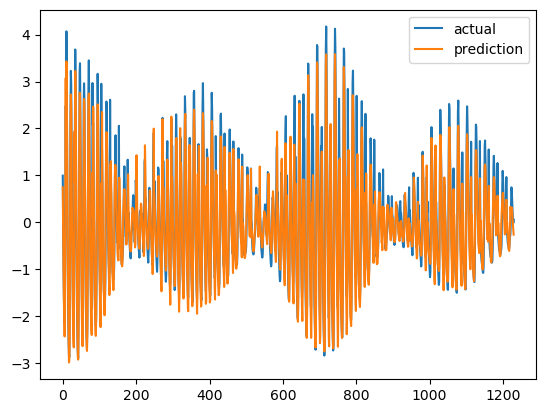

{'mae': 0    0.326526
dtype: float64, 'mape': 0    29.613291
dtype: float64, 'mse': 0    0.213362
dtype: float64}


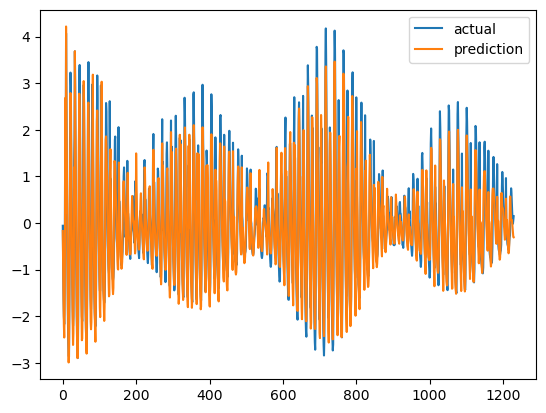

{'mae': 0    0.348397
dtype: float64, 'mape': 0    21.302942
dtype: float64, 'mse': 0    0.230946
dtype: float64}


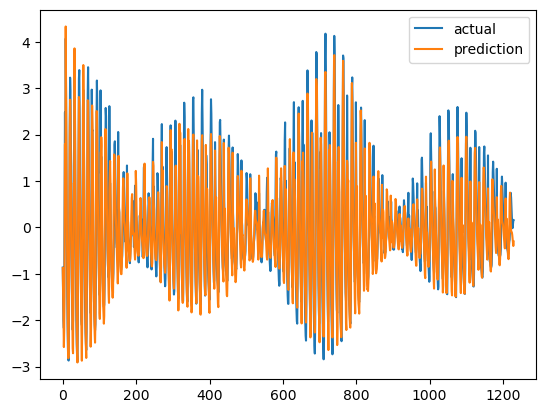

Epoch 1/1000
156/156 [==============================] - 16s 105ms/step - loss: 0.0374 - val_loss: 0.0212
Epoch 2/1000
156/156 [==============================] - 16s 104ms/step - loss: 0.0113 - val_loss: 0.0160
Epoch 3/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0077 - val_loss: 0.0097
Epoch 4/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0057 - val_loss: 0.0083
Epoch 5/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0048 - val_loss: 0.0084
Epoch 6/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0042 - val_loss: 0.0090
Epoch 7/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0037 - val_loss: 0.0093
Epoch 8/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0033 - val_loss: 0.0093
Epoch 9/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0030 - val_loss: 0.0098
Epoch 10/1000
156/156 [==============================] 

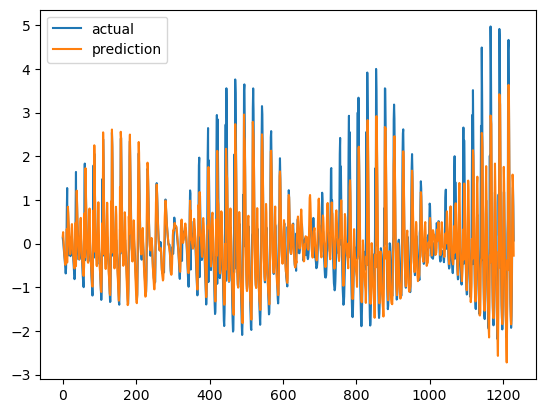

{'mae': 0    0.451527
dtype: float64, 'mape': 0    0.01178
dtype: float64, 'mse': 0    0.459986
dtype: float64}


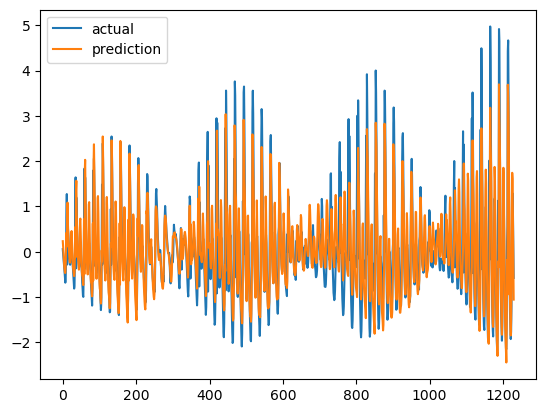

{'mae': 0    0.494681
dtype: float64, 'mape': 0   -10.427355
dtype: float64, 'mse': 0    0.502046
dtype: float64}


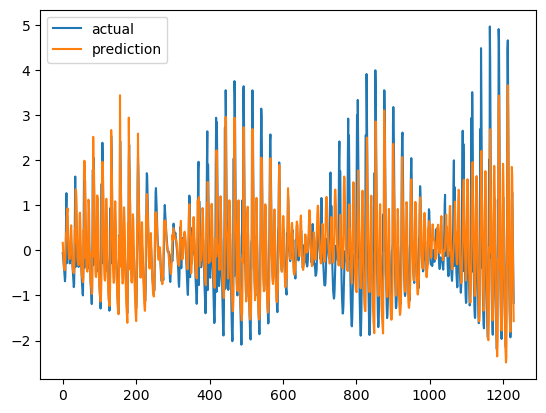

Epoch 1/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0277 - val_loss: 0.0076
Epoch 2/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0092 - val_loss: 0.0041
Epoch 3/1000
156/156 [==============================] - 16s 100ms/step - loss: 0.0058 - val_loss: 0.0029
Epoch 4/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0048 - val_loss: 0.0026
Epoch 5/1000
156/156 [==============================] - 15s 99ms/step - loss: 0.0044 - val_loss: 0.0026
Epoch 6/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0039 - val_loss: 0.0024
Epoch 7/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0036 - val_loss: 0.0023
Epoch 8/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0032 - val_loss: 0.0025
Epoch 9/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 10/1000
156/156 [==============================] -

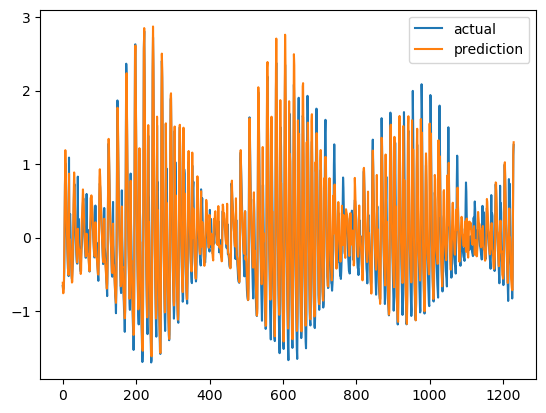

{'mae': 0    0.23393
dtype: float64, 'mape': 0   -143.752606
dtype: float64, 'mse': 0    0.111542
dtype: float64}


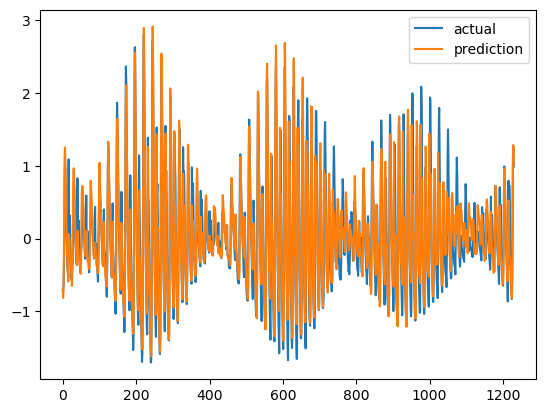

{'mae': 0    0.244654
dtype: float64, 'mape': 0   -154.53367
dtype: float64, 'mse': 0    0.115111
dtype: float64}


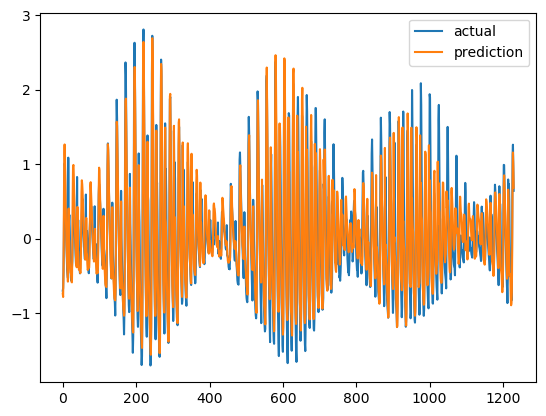

Epoch 1/1000
156/156 [==============================] - 16s 104ms/step - loss: 0.0284 - val_loss: 0.0081
Epoch 2/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0132 - val_loss: 0.0058
Epoch 3/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0069 - val_loss: 0.0045
Epoch 4/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0053 - val_loss: 0.0047
Epoch 5/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0059 - val_loss: 0.0045
Epoch 6/1000
156/156 [==============================] - 16s 104ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 7/1000
156/156 [==============================] - 16s 101ms/step - loss: 0.0041 - val_loss: 0.0044
Epoch 8/1000
156/156 [==============================] - 16s 102ms/step - loss: 0.0038 - val_loss: 0.0041
Epoch 9/1000
156/156 [==============================] - 16s 103ms/step - loss: 0.0036 - val_loss: 0.0041
Epoch 10/1000
156/156 [==============================] 

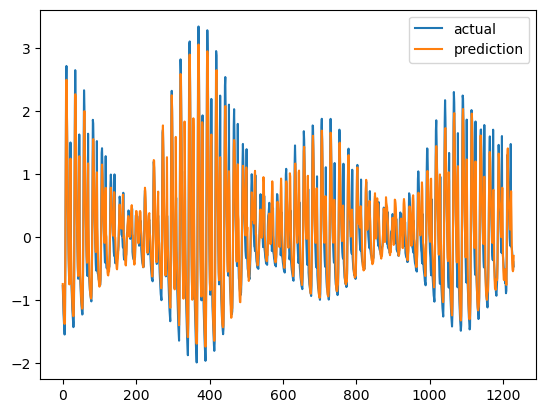

{'mae': 0    0.269456
dtype: float64, 'mape': 0   -53.420918
dtype: float64, 'mse': 0    0.16709
dtype: float64}


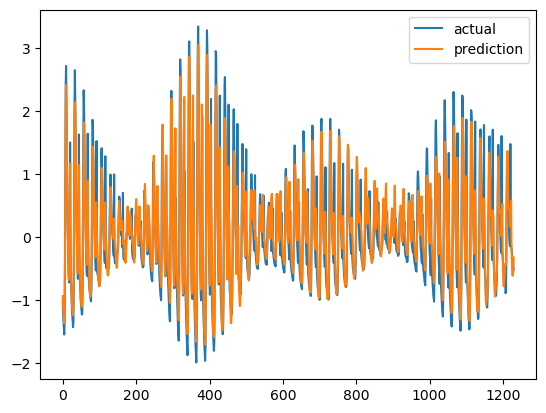

{'mae': 0    0.282724
dtype: float64, 'mape': 0   -61.13159
dtype: float64, 'mse': 0    0.177093
dtype: float64}


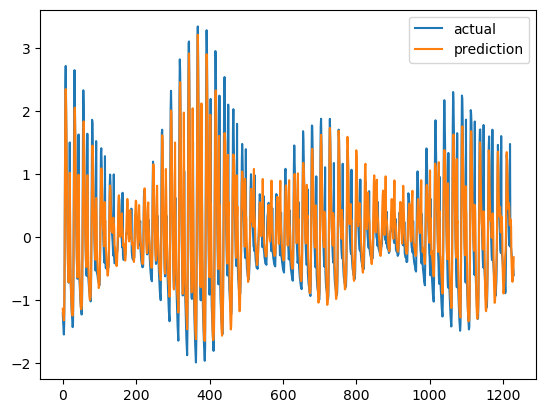

In [113]:
# CHECK!!!! seasonal_24
# time_step 10 그냥저냥...
# 50으로 늘려볼게 웅 졸라 발산해
# 20 해보자

for i in range(7):
    time_step = 20
    y_step = 3
    patience = 100
    epochs = 1000

    (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[1][i][0], scaled_data[1][i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[1][i][2], scaled_data[1][i][3], time_step)

    model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    #model.summary()

    history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

    pred = model.predict(lstm_X_valid)

    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[1][i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_y[1][i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_y[1][i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
        
    #model.save(f'./attention_models/attention_model{i}.h5')

{'mae': 0    0.217217
dtype: float64, 'mape': 0   -13.754638
dtype: float64, 'mse': 0    0.115022
dtype: float64}


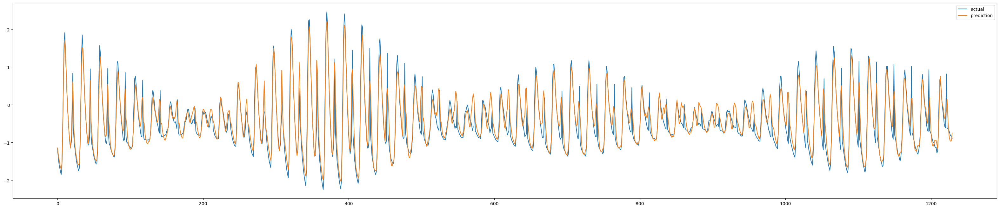

{'mae': 0    0.237803
dtype: float64, 'mape': 0    12.493526
dtype: float64, 'mse': 0    0.13014
dtype: float64}


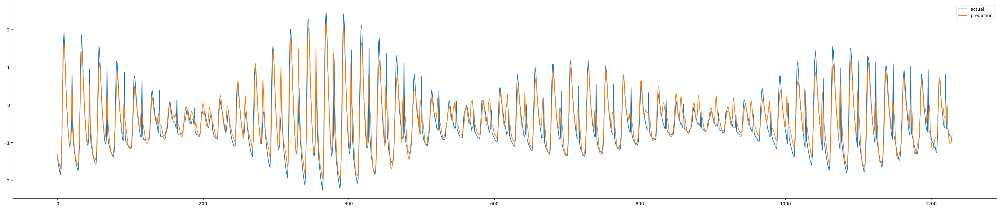

{'mae': 0    0.249513
dtype: float64, 'mape': 0   -0.24849
dtype: float64, 'mse': 0    0.137931
dtype: float64}


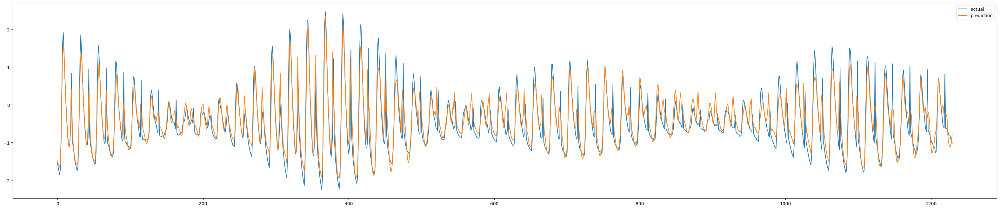

In [119]:
for j in range(y_step):
    plt.figure(figsize=(40,8))
    print(calculate_metrics(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_y[2][i], pred[:, j])))
    plt.plot(inverse_min_max_scaling(scaler_y[2][i], lstm_y_valid[:, j]), label = 'actual')
    plt.plot(inverse_min_max_scaling(scaler_y[2][i], pred[:, j]), label = 'prediction')
    plt.legend()
    plt.show()

## Without time series decomposition

In [3]:
colnames_AWS = ["locCode", "time", "temp", "windDir", "windSpd", "precip", "groundP", "seaP", "humid", "rad", "sunShine"]

def climate_data_merging(locCode):
    climate_data_2018 = pd.read_csv(
        "./data_weatherAWS/SURFACE_AWS_%d_HR_2018_2018_2019.csv"%locCode,
        header = 0,
        names = colnames_AWS
    )

    climate_data_2019 = pd.read_csv(
        "./data_weatherAWS/SURFACE_AWS_%d_HR_2019_2019_2020.csv"%locCode,
        header = 0,
        names = colnames_AWS
    )

    climate_data_2020 = pd.read_csv(
        "./data_weatherAWS/SURFACE_AWS_%d_HR_2020_2020_2021.csv"%locCode,
        header = 0,
        names = colnames_AWS
    )

    climate_data_2021 = pd.read_csv(
        "./data_weatherAWS/SURFACE_AWS_%d_HR_2021_2021_2022.csv"%locCode,
        header = 0,
        names = colnames_AWS
    )

    climate_data_2022 = pd.read_csv(
        "./data_weatherAWS/SURFACE_AWS_%d_HR_2022_2022_2023.csv"%locCode,
        header = 0,
        names = colnames_AWS
    )
    
    return pd.concat([climate_data_2018, climate_data_2019, climate_data_2020, climate_data_2021, climate_data_2022])

climate_data_yongsan = climate_data_merging(415)
climate_data_yeongdeungpo = climate_data_merging(510)
climate_data_cemetery = climate_data_merging(889)


print(climate_data_yongsan)
print(climate_data_yeongdeungpo)
print(climate_data_cemetery)

      locCode              time  temp  windDir  windSpd  precip  groundP  \
0         415   2018-01-01 1:00  -1.5     31.7      0.9     0.0      NaN   
1         415   2018-01-01 2:00  -1.3      0.0      0.3     0.0      NaN   
2         415   2018-01-01 3:00  -2.2     16.6      0.8     0.0      NaN   
3         415   2018-01-01 4:00  -1.8    336.7      0.6     0.0      NaN   
4         415   2018-01-01 5:00  -2.2      5.8      0.5     0.0      NaN   
...       ...               ...   ...      ...      ...     ...      ...   
8754      415  2022-12-31 19:00  -0.4     35.6      0.6     0.0   1025.6   
8755      415  2022-12-31 20:00  -1.1     24.2      1.0     0.0   1025.3   
8756      415  2022-12-31 21:00  -1.5      0.0      0.2     0.0   1025.4   
8757      415  2022-12-31 22:00  -1.6      0.0      0.0     0.0   1025.6   
8758      415  2022-12-31 23:00  -1.6      0.0      0.4     0.0   1025.8   

        seaP  humid  rad  sunShine  
0        NaN    NaN  0.0       0.0  
1        NaN 

In [4]:
colnames_waterLvl = ["date"]
for i in range(1, 25):
    colnames_waterLvl.append("lvl%02d"%i)

water_level = pd.read_csv(
    "./data_waterLvl/수위_시자료_서울시(한강대교)_2018-2022.csv",
    header = 0,
    names = colnames_waterLvl
)

print(water_level.head())

         date  lvl01  lvl02  lvl03  lvl04  lvl05  lvl06  lvl07  lvl08  lvl09  \
0  2022-12-31   0.55   0.55   0.60   0.59   0.56   0.57   0.56   0.55   0.56   
1  2022-12-30   0.72   0.87   0.79   0.75   0.74   0.71   0.68   0.67   0.65   
2  2022-12-29   1.08   0.97   0.92   0.89   0.84   0.79   0.77   0.73   0.70   
3  2022-12-28   1.48   1.29   1.17   1.07   1.01   0.95   0.89   0.84   0.80   
4  2022-12-27   1.48   1.31   1.19   1.10   1.04   0.98   0.92   0.87   0.81   

   ...  lvl15  lvl16  lvl17  lvl18  lvl19  lvl20  lvl21  lvl22  lvl23  lvl24  
0  ...   0.54   0.54   0.54   0.54   0.54   0.53   0.53   0.53   0.53    NaN  
1  ...   0.58   0.58   0.58   0.57   0.56   0.56   0.56   0.56   0.56   0.55  
2  ...   0.61   0.60   0.60   0.59   0.58   0.57   0.57   0.57   0.57   0.56  
3  ...   0.70   0.68   0.67   0.65   0.64   0.62   0.61   0.61   0.60   0.83  
4  ...   0.79   0.74   0.72   0.69   0.66   0.65   0.64   0.63   1.09   1.52  

[5 rows x 25 columns]


In [5]:
def drop_column(climate_data):
    climate_data.drop(["locCode", "groundP", "seaP", "humid", "rad", "sunShine"], axis = 1, inplace = True)
drop_column(climate_data_yongsan)
drop_column(climate_data_yeongdeungpo)
drop_column(climate_data_cemetery)

In [6]:
def full_time(climate_data):
    climate_data['time'] = pd.to_datetime(climate_data['time'], format='%Y-%m-%d %H:%M')
    time_indx = pd.date_range("2018-01-01 1:00:00", "2022-12-31 23:00:00", freq = "H")
    tmp_time = pd.DataFrame({"time": time_indx})
    new_climate_data = pd.merge(tmp_time, climate_data, left_on = "time", right_on = "time", how = "left")
    return new_climate_data

climate_data_yongsan = full_time(climate_data_yongsan)
climate_data_yeongdeungpo = full_time(climate_data_yeongdeungpo)
climate_data_cemetery = full_time(climate_data_cemetery)


In [7]:
import math
from datetime import timedelta
from datetime import datetime
import pandas as pd # 최신 버전으로 해야 됨...

water_level = pd.wide_to_long(water_level, ["lvl"], i = "date", j = "hours")
water_level.sort_values(by = ["date", "hours"], axis = 0, inplace = True)
water_level.reset_index(drop = False, inplace = True)
water_level['hours'].loc[water_level['hours'] == 24] = 0 #change 24h to 0h
water_level['date'] = pd.to_datetime(water_level['date'], format='%Y-%m-%d')
water_level['date'].loc[water_level['hours'] == 0] += timedelta(days = 1)
water_level["time"] = water_level["date"].astype(str) + " " + water_level["hours"].astype(str) + ":00"
water_level['time'] = pd.to_datetime(water_level['time'], format='%Y-%m-%d %H:%M')
water_level = water_level[:-1]

water_level.head(30)

/tmp/ipykernel_2924/230749578.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  water_level['hours'].loc[water_level['hours'] == 24] = 0 #change 24h to 0h
/tmp/ipykernel_2924/230749578.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  water_level['date'].loc[water_level['hours'] == 0] += timedelta(days = 1)


,date,hours,lvl,time
0,2018-01-01,1,0.78,2018-01-01 01:00:00
1,2018-01-01,2,0.75,2018-01-01 02:00:00
2,2018-01-01,3,0.73,2018-01-01 03:00:00
3,2018-01-01,4,0.70,2018-01-01 04:00:00
4,2018-01-01,5,0.69,2018-01-01 05:00:00
5,2018-01-01,6,0.67,2018-01-01 06:00:00
6,2018-01-01,7,0.65,2018-01-01 07:00:00
7,2018-01-01,8,0.77,2018-01-01 08:00:00
8,2018-01-01,9,0.77,2018-01-01 09:00:00
9,2018-01-01,10,0.78,2018-01-01 10:00:00


In [8]:
def wind_dir_triangulation(climate_data):
    climate_data["horizon_dir"] = (climate_data["windDir"]-28).map(math.radians).map(math.cos) #다리 방향
    climate_data["vertical_dir"] = (climate_data["windDir"]-28).map(math.radians).map(math.sin) #다리 수직 방향 (물 방향)
    climate_data.drop(["windDir"], axis = 1, inplace = True)
wind_dir_triangulation(climate_data_yongsan)
wind_dir_triangulation(climate_data_yeongdeungpo)
wind_dir_triangulation(climate_data_cemetery)

In [9]:
def missingImput_climate(df):
    while df.isnull().values.any():
        df['precip'] = df[['precip']].rolling(window = 3, min_periods = 1).mean()
        df['horizon_dir'] = df[['horizon_dir']].rolling(window = 3, min_periods = 1).mean()
        df['vertical_dir'] = df[['vertical_dir']].rolling(window = 3, min_periods = 1).mean()
        df['temp'] = df[['temp']].interpolate().values
        df['windSpd'] = df[['windSpd']].interpolate().values
    return

missingImput_climate(climate_data_yongsan)
missingImput_climate(climate_data_yeongdeungpo)
missingImput_climate(climate_data_cemetery)

In [10]:
index_num = water_level.index[water_level['lvl'].isna() == True]
for num in index_num:
    if num == 0:
        water_level['lvl'][num] = water_level['lvl'][num + 1]
    elif num == len(water_level) - 1:
        water_level['lvl'][num] = water_level['lvl'][num - 1]
    else:
        water_level['lvl'][num] = (water_level['lvl'][num + 1] + water_level['lvl'][num - 1])/2

/tmp/ipykernel_2924/702953331.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  water_level['lvl'][num] = (water_level['lvl'][num + 1] + water_level['lvl'][num - 1])/2


In [17]:
water_level.head(3)

,date,hours,lvl,time
0,2018-01-01,1,0.78,2018-01-01 01:00:00
1,2018-01-01,2,0.75,2018-01-01 02:00:00
2,2018-01-01,3,0.73,2018-01-01 03:00:00


In [19]:
climate_data_yongsan.drop(["time"], inplace = True, axis = 1)
climate_data_yongsan.columns = ["ys_tp", "ys_ws", "ys_pr", "ys_hor", "ys_ver"]
climate_data_yeongdeungpo.drop(["time"], inplace = True, axis = 1)
climate_data_yeongdeungpo.columns = ["yd_tp", "yd_ws", "yd_pr", "yd_hor", "yd_ver"]
climate_data_cemetery.drop(["time"], inplace = True, axis = 1)
climate_data_cemetery.columns = ["ce_tp", "ce_ws", "ce_pr", "ce_hor", "ce_ver"]
water_level.drop(["time", "hours", "date"], inplace = True, axis = 1)

In [20]:
merged_df = pd.concat([water_level, climate_data_yongsan, climate_data_yeongdeungpo, climate_data_cemetery], axis = 1)
merged_df.head(30)

,lvl,ys_tp,ys_ws,ys_pr,ys_hor,ys_ver,yd_tp,yd_ws,yd_pr,yd_hor,yd_ver,ce_tp,ce_ws,ce_pr,ce_hor,ce_ver
0,0.78,-1.5,0.9,0.0,0.997916,0.064532,-0.9,0.3,0.0,0.882948,-0.469472,-4.6,0.9,0.0,-0.882127,-0.471012
1,0.75,-1.3,0.3,0.0,0.997916,0.064532,-0.8,0.4,0.0,0.882948,-0.469472,-5.4,0.8,0.0,-0.882127,-0.471012
2,0.73,-2.2,0.8,0.0,0.997916,0.064532,-0.9,0.5,0.0,0.882948,-0.469472,-5.7,0.5,0.0,-0.882127,-0.471012
3,0.70,-1.8,0.6,0.0,0.997916,0.064532,-1.3,0.3,0.0,0.882948,-0.469472,-6.2,0.8,0.0,-0.882127,-0.471012
4,0.69,-2.2,0.5,0.0,0.997916,0.064532,-1.7,0.2,0.0,0.882948,-0.469472,-6.5,0.7,0.0,-0.882127,-0.471012
5,0.67,-2.2,0.4,0.0,0.997916,0.064532,-2.1,0.1,0.0,0.882948,-0.469472,-6.5,0.5,0.0,-0.882127,-0.471012
6,0.65,-2.9,0.4,0.0,0.997916,0.064532,-2.1,1.1,0.0,0.882948,-0.469472,-6.8,0.8,0.0,-0.882127,-0.471012
7,0.77,-3.6,0.8,0.0,0.997916,0.064532,-1.8,0.7,0.0,0.882948,-0.469472,-7.2,0.9,0.0,-0.882127,-0.471012
8,0.77,-1.3,1.1,0.0,0.997916,0.064532,-0.9,0.1,0.0,0.882948,-0.469472,-5.3,0.3,0.0,-0.882127,-0.471012
9,0.78,-0.8,0.8,0.0,0.997916,0.064532,0.5,0.5,0.0,0.882948,-0.469472,-0.3,0.4,0.0,-0.882127,-0.471012


In [23]:
import numpy as np

class BlockingTimeSeriesSplit():
    def __init__(self, n_splits):
        self.n_splits = n_splits
    
    def get_n_splits(self, groups):
        return self.n_splits
    
    def split(self, X, y=None, groups=None):
        n_samples = len(X)
        k_fold_size = n_samples // self.n_splits
        indices = np.arange(n_samples)
    
        margin = 0
        for i in range(self.n_splits):
            start = i * k_fold_size
            stop = start + k_fold_size
            mid = int(0.8 * (stop - start)) + start
            yield indices[start: mid], indices[mid + margin: stop]

In [26]:
bcv = BlockingTimeSeriesSplit(n_splits = 7)
split_data = bcv.split(merged_df)
ind1 = next(split_data)
ind2 = next(split_data)
ind3 = next(split_data)
ind4 = next(split_data)
ind5 = next(split_data)
ind6 = next(split_data)
ind7 = next(split_data)
ind_set = [ind1, ind2, ind3, ind4, ind5, ind6, ind7]

In [32]:
merged_df.head(3)

,lvl,ys_tp,ys_ws,ys_pr,ys_hor,ys_ver,yd_tp,yd_ws,yd_pr,yd_hor,yd_ver,ce_tp,ce_ws,ce_pr,ce_hor,ce_ver
0,0.78,-1.5,0.9,0.0,0.997916,0.064532,-0.9,0.3,0.0,0.882948,-0.469472,-4.6,0.9,0.0,-0.882127,-0.471012
1,0.75,-1.3,0.3,0.0,0.997916,0.064532,-0.8,0.4,0.0,0.882948,-0.469472,-5.4,0.8,0.0,-0.882127,-0.471012
2,0.73,-2.2,0.8,0.0,0.997916,0.064532,-0.9,0.5,0.0,0.882948,-0.469472,-5.7,0.5,0.0,-0.882127,-0.471012


In [38]:
######### working for the entire data

new_data = []

for i, ind in enumerate(ind_set):
    print(i, ind)
    train_df = merged_df.loc[ind[0]]
    valid_df = merged_df.loc[ind[1]]
    train_df.reset_index()
    valid_df.reset_index()
    
    x_train = train_df.drop(['lvl'], axis=1)
    y_train = train_df[['lvl']]
    
    x_valid = valid_df.drop(['lvl'], axis=1)
    y_valid = valid_df[['lvl']]
    
    new_data.append([x_train, y_train, x_valid, y_valid])

print(new_data[0][0])

0 (array([   0,    1,    2, ..., 5005, 5006, 5007]), array([5008, 5009, 5010, ..., 6257, 6258, 6259]))
1 (array([ 6260,  6261,  6262, ..., 11265, 11266, 11267]), array([11268, 11269, 11270, ..., 12517, 12518, 12519]))
2 (array([12520, 12521, 12522, ..., 17525, 17526, 17527]), array([17528, 17529, 17530, ..., 18777, 18778, 18779]))
3 (array([18780, 18781, 18782, ..., 23785, 23786, 23787]), array([23788, 23789, 23790, ..., 25037, 25038, 25039]))
4 (array([25040, 25041, 25042, ..., 30045, 30046, 30047]), array([30048, 30049, 30050, ..., 31297, 31298, 31299]))
5 (array([31300, 31301, 31302, ..., 36305, 36306, 36307]), array([36308, 36309, 36310, ..., 37557, 37558, 37559]))
6 (array([37560, 37561, 37562, ..., 42565, 42566, 42567]), array([42568, 42569, 42570, ..., 43817, 43818, 43819]))
      ys_tp  ys_ws         ys_pr    ys_hor    ys_ver  yd_tp  yd_ws  \
0      -1.5    0.9  0.000000e+00  0.997916  0.064532   -0.9    0.3   
1      -1.3    0.3  0.000000e+00  0.997916  0.064532   -0.8    0.4 

In [40]:
from sklearn.preprocessing import StandardScaler

def normalize(train_df, valid_df):
    scaler = StandardScaler()
    scaler = scaler.fit(train_df)
    
    train_scaled = scaler.transform(train_df)
    train_scaled = pd.DataFrame(train_scaled)
    
    valid_scaled = scaler.transform(valid_df)
    valid_scaled = pd.DataFrame(valid_scaled)
    
    return train_scaled, valid_scaled


In [54]:
scaled_new_data = []

for i, comp in enumerate(new_data):
    x_train_scaled, x_valid_scaled = normalize(comp[0], comp[2])
    y_train_scaled, y_valid_scaled = normalize(comp[1], comp[3])
        
    scaled_new_data.append([x_train_scaled, y_train_scaled, x_valid_scaled, y_valid_scaled])

In [56]:
from sklearn.decomposition import PCA

In [57]:
# buidling PCA process into a function:

def result_PCA(train_df, valid_df):
    n = len(train_df.columns)
    pca = PCA(n_components = n)
    pca_train = pca.fit_transform(train_df)
    pca_train_df = pd.DataFrame(pca_train, columns = [f"pca{num + 1}" for num in range(n)])
    
    eig = pca.explained_variance_
    ratio = pca.explained_variance_ratio_
    acc_ratio = ratio.cumsum()
    
    plt.plot(
        range(1, n+1),
        acc_ratio,
        marker = "+",
        color = "y"
    )
    plt.show()
    
    pca_info = pd.DataFrame({
        "eig for variance": eig,
        "acc. explained": acc_ratio},
        index = np.array([f"pca{num + 1}" for num in range(n)])
    )
    print(pca_info)
    
    pca_valid = pca.transform(valid_df) # Apply 'fit_transform' method to only train set. 
    pca_valid_df = pd.DataFrame(pca_valid, columns = [f"pca{num + 1}" for num in range(n)])
    
    return pca_train_df, pca_valid_df

0


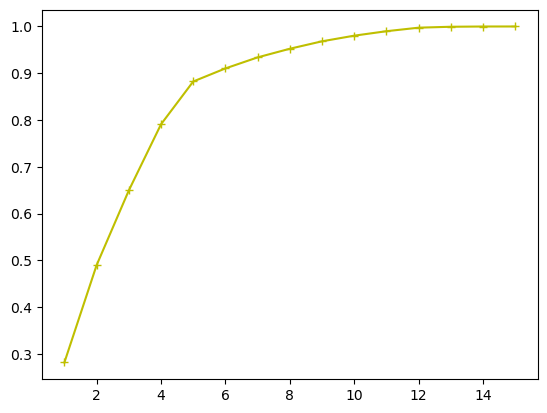

       eig for variance  acc. explained
pca1           4.231192        0.282023
pca2           3.119100        0.489922
pca3           2.395267        0.649574
pca4           2.122181        0.791025
pca5           1.371481        0.882438
pca6           0.419458        0.910397
pca7           0.353836        0.933981
pca8           0.276786        0.952430
pca9           0.238426        0.968322
pca10          0.180851        0.980376
pca11          0.142910        0.989902
pca12          0.113253        0.997450
pca13          0.029337        0.999406
pca14          0.008103        0.999946
pca15          0.000815        1.000000
--------
1


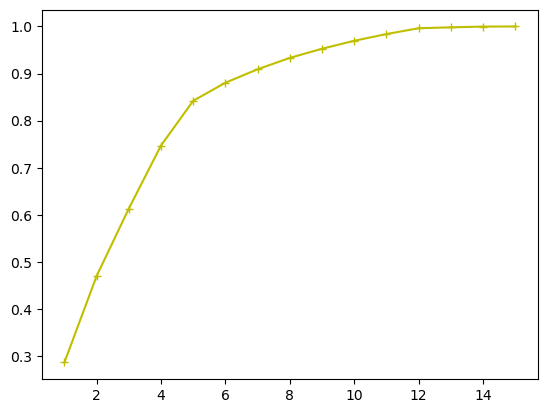

       eig for variance  acc. explained
pca1           4.293806        0.286197
pca2           2.754225        0.469775
pca3           2.151086        0.613152
pca4           2.009682        0.747104
pca5           1.426709        0.842199
pca6           0.575342        0.880547
pca7           0.428496        0.909108
pca8           0.363169        0.933315
pca9           0.290765        0.952695
pca10          0.254199        0.969638
pca11          0.213941        0.983898
pca12          0.186213        0.996310
pca13          0.027893        0.998169
pca14          0.024263        0.999786
pca15          0.003207        1.000000
--------
2


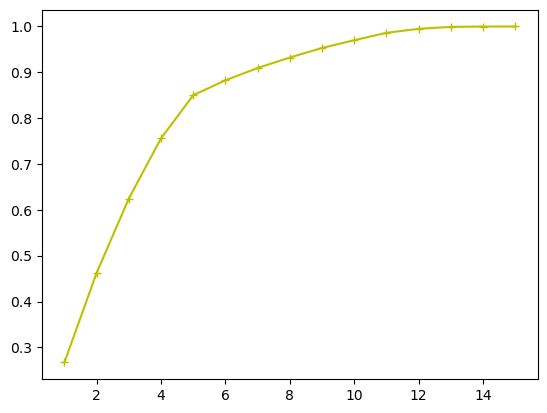

       eig for variance  acc. explained
pca1           4.005838        0.267003
pca2           2.930650        0.462340
pca3           2.434448        0.624604
pca4           1.970116        0.755919
pca5           1.412413        0.850061
pca6           0.487356        0.882545
pca7           0.403298        0.909426
pca8           0.343376        0.932314
pca9           0.312249        0.953126
pca10          0.254487        0.970088
pca11          0.241310        0.986172
pca12          0.131867        0.994962
pca13          0.061737        0.999077
pca14          0.011731        0.999859
pca15          0.002120        1.000000
--------
3


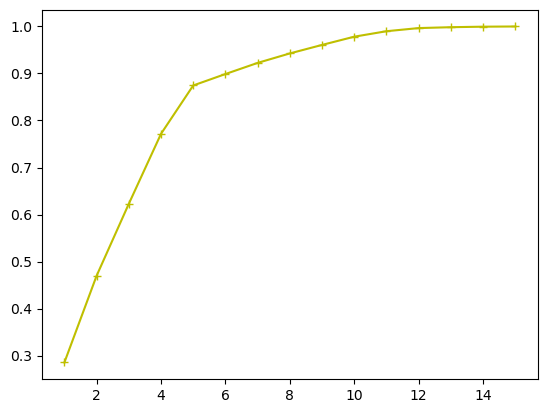

       eig for variance  acc. explained
pca1           4.279852        0.285266
pca2           2.767257        0.469713
pca3           2.296044        0.622753
pca4           2.234171        0.771668
pca5           1.543150        0.874524
pca6           0.364690        0.898831
pca7           0.355659        0.922537
pca8           0.302340        0.942689
pca9           0.271277        0.960771
pca10          0.262661        0.978278
pca11          0.174710        0.989923
pca12          0.100070        0.996593
pca13          0.027994        0.998459
pca14          0.016488        0.999558
pca15          0.006633        1.000000
--------
4


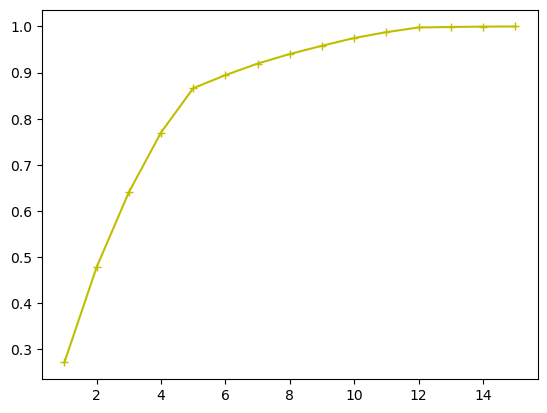

       eig for variance  acc. explained
pca1           4.072245        0.271429
pca2           3.099937        0.478050
pca3           2.435185        0.640363
pca4           1.944862        0.769995
pca5           1.443057        0.866179
pca6           0.425150        0.894517
pca7           0.376441        0.919608
pca8           0.310295        0.940290
pca9           0.269215        0.958234
pca10          0.251545        0.975001
pca11          0.192105        0.987805
pca12          0.150600        0.997843
pca13          0.014977        0.998841
pca14          0.013754        0.999758
pca15          0.003628        1.000000
--------
5


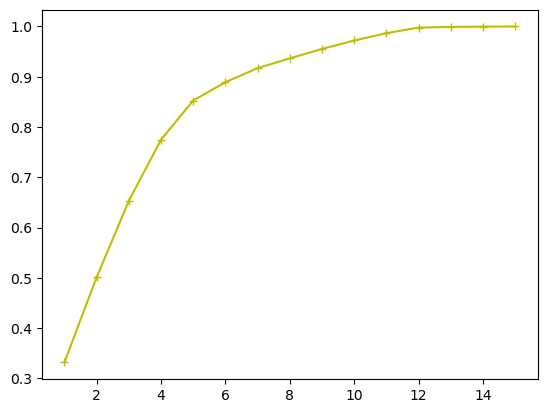

       eig for variance  acc. explained
pca1           4.973548        0.331504
pca2           2.543005        0.501003
pca3           2.278731        0.652889
pca4           1.829152        0.774808
pca5           1.168356        0.852683
pca6           0.547563        0.889179
pca7           0.420152        0.917184
pca8           0.290846        0.936570
pca9           0.281098        0.955306
pca10          0.252087        0.972108
pca11          0.219172        0.986717
pca12          0.166011        0.997782
pca13          0.020344        0.999138
pca14          0.009813        0.999792
pca15          0.003119        1.000000
--------
6


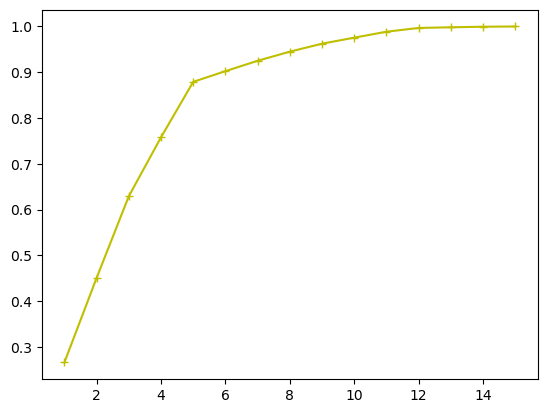

       eig for variance  acc. explained
pca1           3.988929        0.265875
pca2           2.770835        0.450561
pca3           2.679005        0.629126
pca4           1.930785        0.757819
pca5           1.818752        0.879045
pca6           0.349972        0.902372
pca7           0.340193        0.925047
pca8           0.299283        0.944995
pca9           0.261182        0.962404
pca10          0.197728        0.975583
pca11          0.194395        0.988540
pca12          0.123514        0.996772
pca13          0.021781        0.998224
pca14          0.018338        0.999446
pca15          0.008304        1.000000
--------


In [60]:
import matplotlib.pyplot as plt

pca_new_data = []

for i, comp in enumerate(scaled_new_data):
    print(i)
    
    x_train_pca, x_valid_pca = result_PCA(comp[0], comp[2])
    y_train_pca, y_valid_pca = comp[1], comp[3]  # not applying PCA on y
        
    pca_new_data.append([x_train_pca, y_train_pca, x_valid_pca, y_valid_pca])
        
    print("--------")

In [62]:
f_pca_new_data = []

param = [5, 5, 5, 5, 5, 5, 5]

for i, comp in enumerate(pca_new_data):
    no = param[i]
    x_train_pca, x_valid_pca = comp[0][[f"pca{d+1}" for d in range(no)]], comp[2][[f"pca{d+1}" for d in range(no)]]
    y_train_pca, y_valid_pca = comp[1], comp[3]  # not applying PCA on y
        
    f_pca_new_data.append([x_train_pca, y_train_pca, x_valid_pca, y_valid_pca])

In [65]:
f_pca_new_data[0]

[          pca1      pca2      pca3      pca4      pca5
 0    -1.650980  2.348581 -1.284815 -1.216536 -0.509727
 1    -1.690925  2.345949 -1.487283 -1.340051 -0.485125
 2    -1.696643  2.383295 -1.425504 -1.287057 -0.525513
 3    -1.724288  2.401120 -1.475880 -1.300673 -0.534655
 4    -1.750404  2.424834 -1.652296 -1.397640 -0.538886
 ...        ...       ...       ...       ...       ...
 5003  1.033078 -2.215282  0.792571 -0.873202  2.422907
 5004  1.039302 -2.058218  1.157279 -0.700908  2.560490
 5005  0.808138 -1.811732  1.796972 -0.234540  2.580866
 5006  0.218142 -1.267729  1.891075  0.078217  2.359383
 5007  0.261751 -1.280204  0.022956 -1.193260  2.706456
 
 [5008 rows x 5 columns],
              0
 0    -0.485574
 1    -0.551946
 2    -0.596193
 3    -0.662565
 4    -0.684689
 ...        ...
 5003  0.310888
 5004  0.156021
 5005 -0.065219
 5006 -0.175839
 5007 -0.264334
 
 [5008 rows x 1 columns],
           pca1      pca2      pca3      pca4      pca5
 0     0.240605 -1.23135

In [67]:
new_data = []
for i in range(7):
    x_train = pd.DataFrame(f_pca_new_data[i][0])
    y_train = pd.DataFrame(f_pca_new_data[i][1])
    x_valid = pd.DataFrame(f_pca_new_data[i][2])
    y_valid = pd.DataFrame(f_pca_new_data[i][3])
    split_data = [x_train, y_train, x_valid, y_valid]
    new_data.append(split_data)

In [24]:
def calculate_metrics(true, pred):
    true = pd.DataFrame(true)
    pred = pd.DataFrame(pred)
    mae = (true - pred).abs().mean()
    mape = (true - pred).abs().div(true).mean() * 100
    mse = ((true - pred) ** 2).mean()
    return {
        "mae": mae,
        "mape": mape,
        "mse": mse,
    }

In [72]:
# Min-Max scaling
# To prevent excessively large values from interfering with the learning process, applying min-max scaling.

from sklearn.preprocessing import MinMaxScaler

def min_max_scaling(train_df, valid_df):
    scaler = MinMaxScaler()
    scaler = scaler.fit(train_df)
    
    train_scaled = scaler.transform(train_df)
    train_scaled = pd.DataFrame(train_scaled)
    
    valid_scaled = scaler.transform(valid_df)
    valid_scaled = pd.DataFrame(valid_scaled)
    
    return scaler, train_scaled, valid_scaled

In [73]:
def inverse_min_max_scaling(scaler, df):
    return scaler.inverse_transform(df)

In [74]:
scaled_new_data = new_data

scaler_new_X = []
scaler_new_y = []

for i in range(len(new_data)):
    (scaler, scaled_new_data[i][0], scaled_new_data[i][2]) = min_max_scaling(new_data[i][0], new_data[i][2])
    (scaler, scaled_new_data[i][1], scaled_new_data[i][3]) = min_max_scaling(new_data[i][1], new_data[i][3])
    scaler_new_X.append(scaler)
    scaler_new_y.append(scaler)

In [75]:
def make_dataset(X_df, y_df, time_step = 8, y_step = 3):
    new_X_df = []
    new_y_df = []
    X_df = pd.concat([X_df, y_df], axis=1)
    for i in range(len(X_df) - time_step - y_step + 1):
        new_X_df.append(np.array(X_df.iloc[i:i + time_step]))
        new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step]))
    return np.array(new_X_df), np.array(new_y_df)

In [76]:
def Seq2_model(feature_num, time_step, y_step):

    model = keras.Sequential()
    model.add(keras.layers.LSTM(128, activation = 'relu', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal'))
    model.add(keras.layers.LSTM(64, activation = 'relu'))
    model.add(keras.layers.RepeatVector(y_step))
    model.add(keras.layers.LSTM(64, activation = 'relu', return_sequences = True))
    model.add(keras.layers.LSTM(128, activation = 'relu', return_sequences = True))
    model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
    model.compile(optimizer = 'nadam', loss = 'mse')
    model.summary()
    
    return model

In [90]:
def Seq2_fit(model, X_train, y_train, X_valid, y_valid, time_step = 8, patience = 10, epochs = 300):
    
    #adam = tf.keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon= None, decay=0.0, amsgrad=False)
    #nadam = tf.keras.optimizers.experimental.Nadam
    model.compile(loss='mean_squared_error', optimizer = 'nadam')
    early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience = patience)

    #model_path = 'model'
    #filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    #checkpoint = keras.callbacks.ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    
    history = model.fit(X_train, y_train, 
                        epochs = epochs,
                        validation_data = (X_valid, y_valid), 
                        callbacks = [early_stop],
                        shuffle = False)
    return history

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 10, 128)           67072     
_________________________________________________________________
lstm_5 (LSTM)                (None, 64)                49408     
_________________________________________________________________
repeat_vector_1 (RepeatVecto (None, 3, 64)             0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 3, 64)             33024     
_________________________________________________________________
lstm_7 (LSTM)                (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
________________________________________________

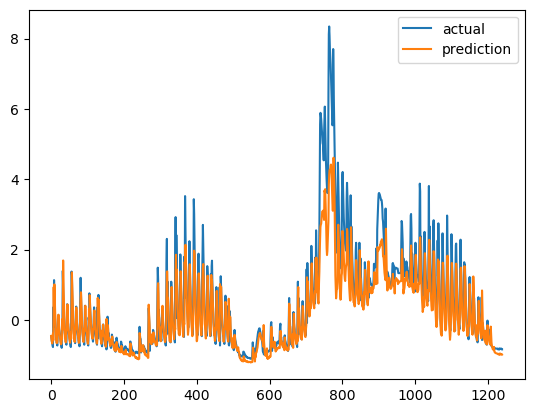

{'mae': 0    0.429044
dtype: float64, 'mape': 0    65.024399
dtype: float64, 'mse': 0    0.60539
dtype: float64}


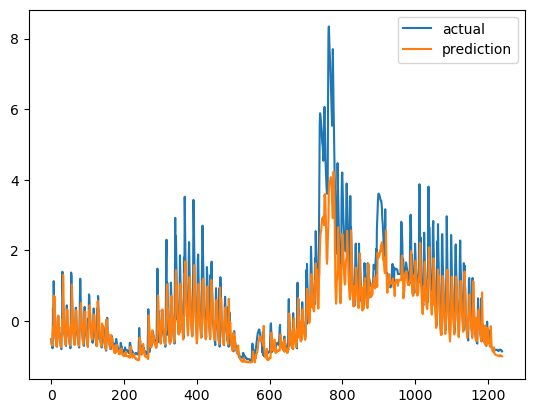

{'mae': 0    0.447
dtype: float64, 'mape': 0    70.057367
dtype: float64, 'mse': 0    0.690506
dtype: float64}


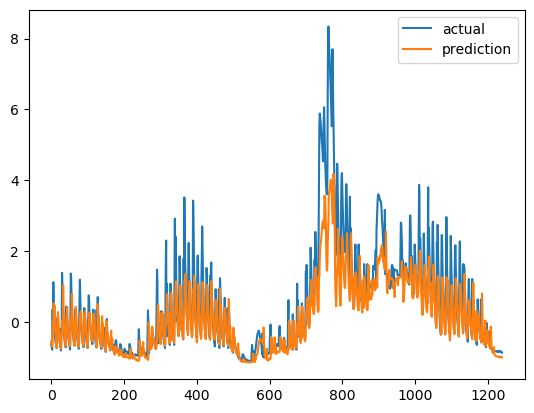

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_8 (LSTM)                (None, 10, 128)           67072     
_________________________________________________________________
lstm_9 (LSTM)                (None, 64)                49408     
_________________________________________________________________
repeat_vector_2 (RepeatVecto (None, 3, 64)             0         
_________________________________________________________________
lstm_10 (LSTM)               (None, 3, 64)             33024     
_________________________________________________________________
lstm_11 (LSTM)               (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_2 (TimeDist (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
________________________________________________

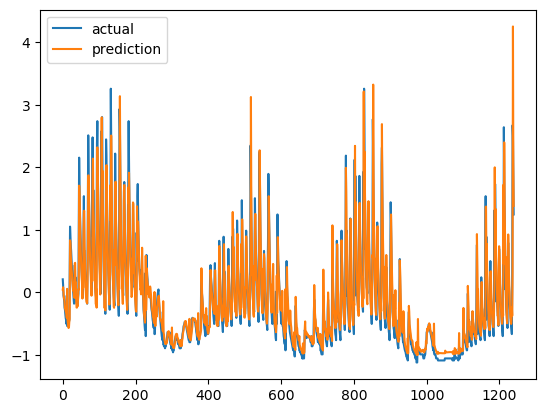

{'mae': 0    0.253181
dtype: float64, 'mape': 0    3.396866
dtype: float64, 'mse': 0    0.187348
dtype: float64}


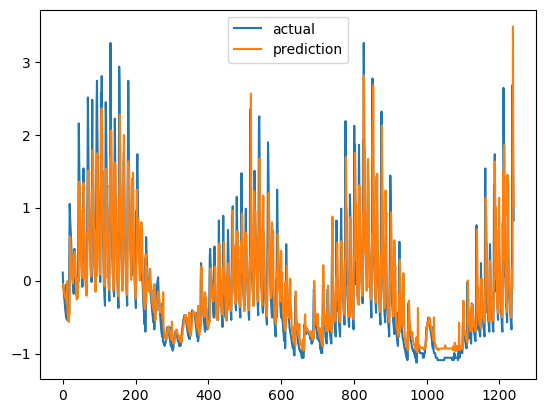

{'mae': 0    0.300745
dtype: float64, 'mape': 0    23.774199
dtype: float64, 'mse': 0    0.224525
dtype: float64}


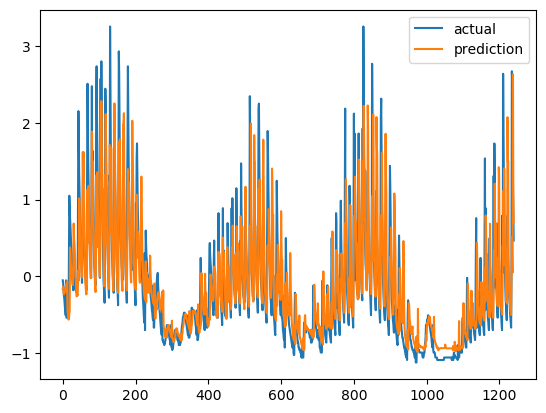

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 10, 128)           67072     
_________________________________________________________________
lstm_13 (LSTM)               (None, 64)                49408     
_________________________________________________________________
repeat_vector_3 (RepeatVecto (None, 3, 64)             0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 3, 64)             33024     
_________________________________________________________________
lstm_15 (LSTM)               (None, 3, 128)            98816     
_________________________________________________________________
time_distributed_3 (TimeDist (None, 3, 1)              129       
Total params: 248,449
Trainable params: 248,449
Non-trainable params: 0
________________________________________________

KeyboardInterrupt: 

In [85]:
# CHECK!!!! seasonal_24
for i in range(7):
    
    time_step = 10
    y_step = 3
    
    (lstm_X_train, lstm_y_train) = make_dataset(scaled_new_data[i][1], scaled_new_data[i][1], time_step)
    (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_new_data[i][3], scaled_new_data[i][3], time_step)
    
    model = Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
    # model.summary()
    
    history = Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step)
    
    pred = model.predict(lstm_X_valid)
    
    for j in range(y_step):
        print(calculate_metrics(inverse_min_max_scaling(scaler_new_y[i], lstm_y_valid[:, j]), inverse_min_max_scaling(scaler_new_y[i], pred[:, j])))
        plt.plot(inverse_min_max_scaling(scaler_new_y[i], lstm_y_valid[:, j]), label = 'actual')
        plt.plot(inverse_min_max_scaling(scaler_new_y[i], pred[:, j]), label = 'prediction')
        plt.legend()
        plt.show()
    
    

## Time Series Decomposition (Only trend, seasonal, and residual)

아ㅋㅋ 이게 더 귀찮네... seasonal 3개 다 합해서 해봅시당... 이렇게 해야 var에서 residual 적합한 거 사용도 가능하니

In [31]:
water_level

,lvl
0,0.78
1,0.75
2,0.73
3,0.70
4,0.69
...,...
43818,0.54
43819,0.53
43820,0.53
43821,0.53


## LSTM - TREND

**time step = 10**

====================5
Epoch 1/1000
157/157 [==============================] - 7s 46ms/step - loss: 0.0602 - val_loss: 0.0263
Epoch 2/1000
157/157 [==============================] - 6s 39ms/step - loss: 1.1849 - val_loss: 0.0195
Epoch 3/1000
157/157 [==============================] - 6s 39ms/step - loss: 0.1165 - val_loss: 0.0235
Epoch 4/1000
157/157 [==============================] - 6s 40ms/step - loss: 0.0099 - val_loss: 0.0368
Epoch 5/1000
157/157 [==============================] - 6s 39ms/step - loss: 0.0034 - val_loss: 0.0201
Epoch 6/1000
157/157 [==============================] - 6s 39ms/step - loss: 0.0019 - val_loss: 0.0046
Epoch 7/1000
157/157 [==============================] - 6s 40ms/step - loss: 7.1212e-04 - val_loss: 0.0176
Epoch 8/1000
157/157 [==============================] - 6s 41ms/step - loss: 3.1029e-04 - val_loss: 0.0222
Epoch 9/1000
157/157 [==============================] - 6s 40ms/step - loss: 6.6725e-04 - val_loss: 0.0335
Epoch 10/1000
157/157 [================

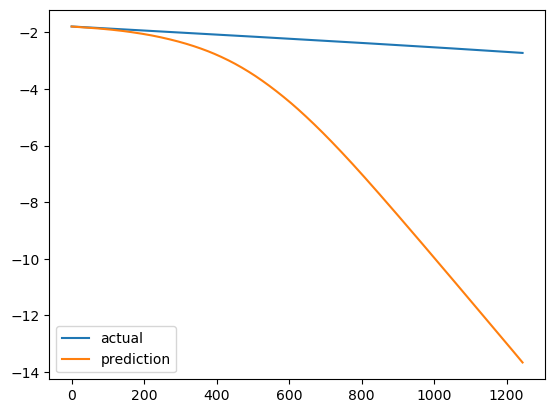

{'mae': 0    1.409212
dtype: float64, 'mape': 0   -56.303203
dtype: float64, 'mse': 0    4.079908
dtype: float64}


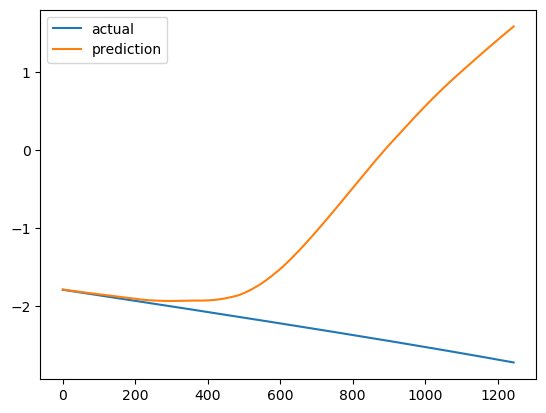

{'mae': 0    1.882808
dtype: float64, 'mape': 0   -74.359908
dtype: float64, 'mse': 0    8.362527
dtype: float64}


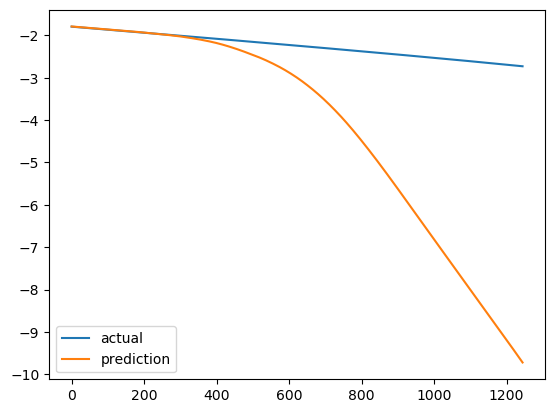

Epoch 1/1000
157/157 [==============================] - 7s 45ms/step - loss: 0.0457 - val_loss: 0.0194
Epoch 2/1000
157/157 [==============================] - 6s 40ms/step - loss: 0.2412 - val_loss: 0.0758
Epoch 3/1000
157/157 [==============================] - 6s 41ms/step - loss: 0.0070 - val_loss: 0.2623
Epoch 4/1000
157/157 [==============================] - 6s 40ms/step - loss: 0.0197 - val_loss: 1.1348
Epoch 5/1000
157/157 [==============================] - 6s 41ms/step - loss: 9.0135e-04 - val_loss: 0.8233
Epoch 6/1000
157/157 [==============================] - 7s 42ms/step - loss: 2.9634e-04 - val_loss: 0.7353
Epoch 7/1000
157/157 [==============================] - 7s 42ms/step - loss: 2.0270e-04 - val_loss: 0.3846
Epoch 8/1000
157/157 [==============================] - 7s 42ms/step - loss: 1.0351e-04 - val_loss: 0.2671
Epoch 9/1000
157/157 [==============================] - 6s 41ms/step - loss: 1.3085e-04 - val_loss: 0.1683
Epoch 10/1000
157/157 [==============================

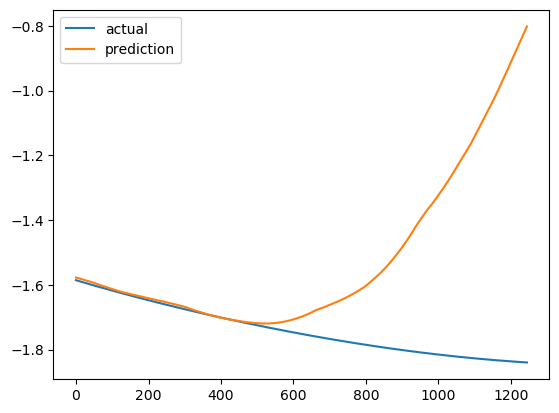

{'mae': 0    0.211023
dtype: float64, 'mape': 0   -11.603948
dtype: float64, 'mse': 0    0.131712
dtype: float64}


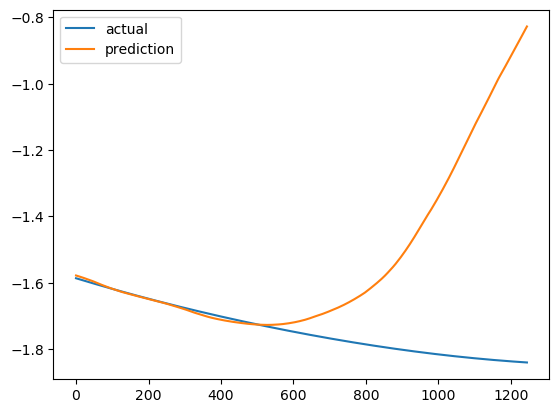

{'mae': 0    0.212742
dtype: float64, 'mape': 0   -11.70315
dtype: float64, 'mse': 0    0.130774
dtype: float64}


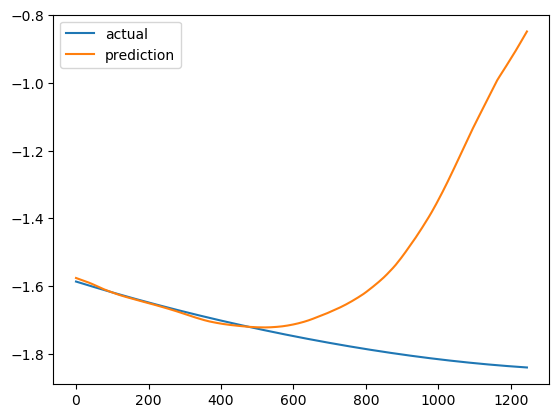

Epoch 1/1000
157/157 [==============================] - 7s 43ms/step - loss: 0.0019 - val_loss: 0.4940
Epoch 2/1000
157/157 [==============================] - 6s 41ms/step - loss: 0.0057 - val_loss: 0.5245
Epoch 3/1000
157/157 [==============================] - 7s 42ms/step - loss: 0.0018 - val_loss: 0.6432
Epoch 4/1000
157/157 [==============================] - 7s 43ms/step - loss: 0.0013 - val_loss: 0.5483
Epoch 5/1000
157/157 [==============================] - 7s 42ms/step - loss: 4.7393e-04 - val_loss: 0.4210
Epoch 6/1000
157/157 [==============================] - 7s 43ms/step - loss: 7.7393e-04 - val_loss: 0.4522
Epoch 7/1000
157/157 [==============================] - 7s 43ms/step - loss: 3.2080e-04 - val_loss: 0.4175
Epoch 8/1000
157/157 [==============================] - 7s 42ms/step - loss: 5.4897e-04 - val_loss: 0.4681
Epoch 9/1000
157/157 [==============================] - 7s 42ms/step - loss: 4.6615e-04 - val_loss: 0.3615
Epoch 10/1000
157/157 [==============================

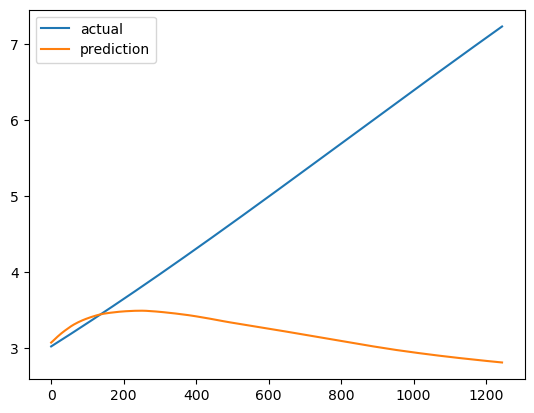

{'mae': 0    1.639832
dtype: float64, 'mape': 0    27.562942
dtype: float64, 'mse': 0    4.515203
dtype: float64}


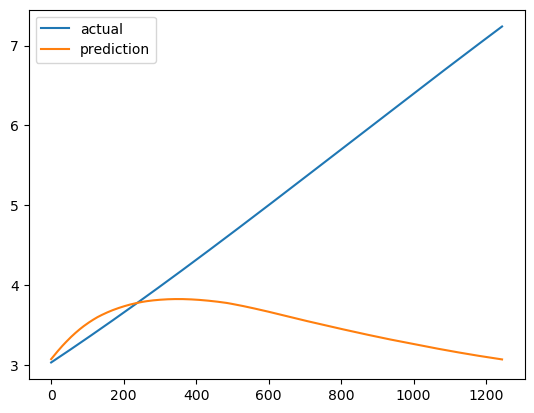

{'mae': 0    1.619608
dtype: float64, 'mape': 0    27.273186
dtype: float64, 'mse': 0    4.332266
dtype: float64}


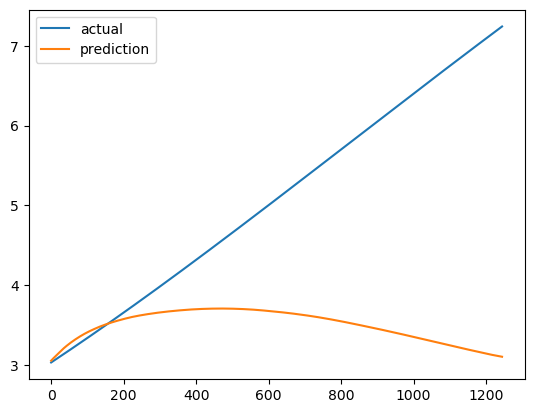

Epoch 1/1000
157/157 [==============================] - 7s 44ms/step - loss: 0.0050 - val_loss: 0.0160
Epoch 2/1000
157/157 [==============================] - 7s 41ms/step - loss: 0.7776 - val_loss: 0.0067
Epoch 3/1000
157/157 [==============================] - 6s 41ms/step - loss: 0.0133 - val_loss: 0.0118
Epoch 4/1000
157/157 [==============================] - 7s 42ms/step - loss: 0.0115 - val_loss: 0.0074
Epoch 5/1000
157/157 [==============================] - 7s 42ms/step - loss: 0.0090 - val_loss: 0.0084
Epoch 6/1000
157/157 [==============================] - 6s 38ms/step - loss: 0.0078 - val_loss: 0.0121
Epoch 7/1000
157/157 [==============================] - 6s 39ms/step - loss: 0.0048 - val_loss: 0.0074
Epoch 8/1000
157/157 [==============================] - 6s 39ms/step - loss: 0.0015 - val_loss: 0.0010
Epoch 9/1000
157/157 [==============================] - 6s 40ms/step - loss: 6.1111e-04 - val_loss: 6.7493e-04
Epoch 10/1000
157/157 [==============================] - 6s 40ms/

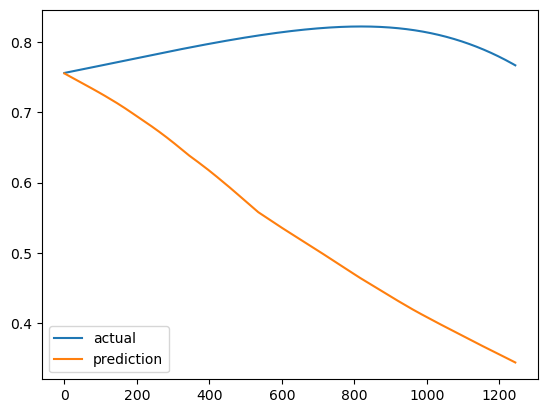

{'mae': 0    0.205962
dtype: float64, 'mape': 0    25.577606
dtype: float64, 'mse': 0    0.05689
dtype: float64}


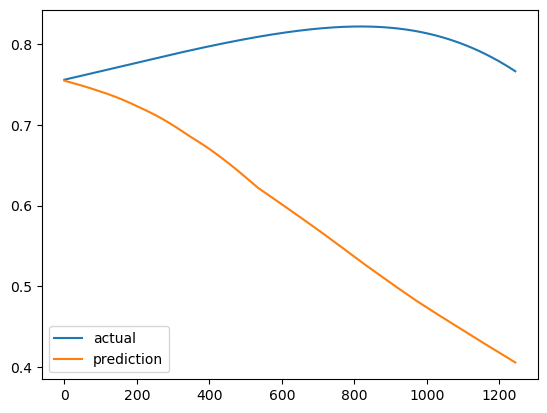

{'mae': 0    0.199644
dtype: float64, 'mape': 0    24.796692
dtype: float64, 'mse': 0    0.05133
dtype: float64}


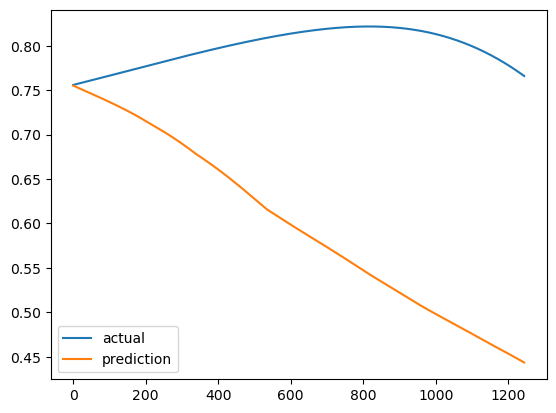

Epoch 1/1000
157/157 [==============================] - 7s 43ms/step - loss: 0.0634 - val_loss: 5.7123e-04
Epoch 2/1000
157/157 [==============================] - 6s 41ms/step - loss: 0.1563 - val_loss: 0.0011
Epoch 3/1000
157/157 [==============================] - 7s 43ms/step - loss: 0.0337 - val_loss: 7.9672e-04
Epoch 4/1000
157/157 [==============================] - 7s 44ms/step - loss: 0.0037 - val_loss: 0.0018
Epoch 5/1000
157/157 [==============================] - 7s 44ms/step - loss: 0.0150 - val_loss: 0.0012
Epoch 6/1000
157/157 [==============================] - 7s 46ms/step - loss: 0.0015 - val_loss: 0.0059
Epoch 7/1000
157/157 [==============================] - 7s 45ms/step - loss: 8.9728e-04 - val_loss: 0.0108
Epoch 8/1000
157/157 [==============================] - 7s 44ms/step - loss: 0.0021 - val_loss: 0.0084
Epoch 9/1000
157/157 [==============================] - 7s 45ms/step - loss: 2.4497e-04 - val_loss: 0.0095
Epoch 10/1000
157/157 [==============================] - 

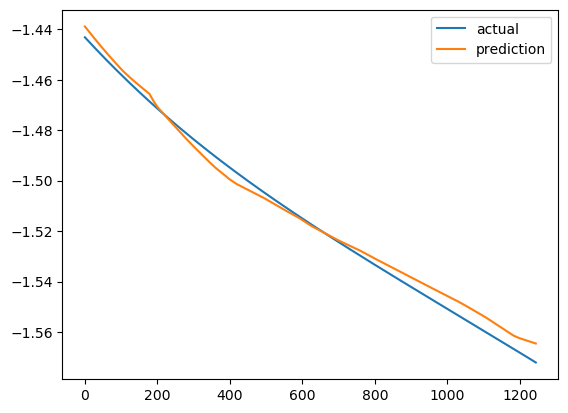

{'mae': 0    0.004191
dtype: float64, 'mape': 0   -0.2789
dtype: float64, 'mse': 0    0.000027
dtype: float64}


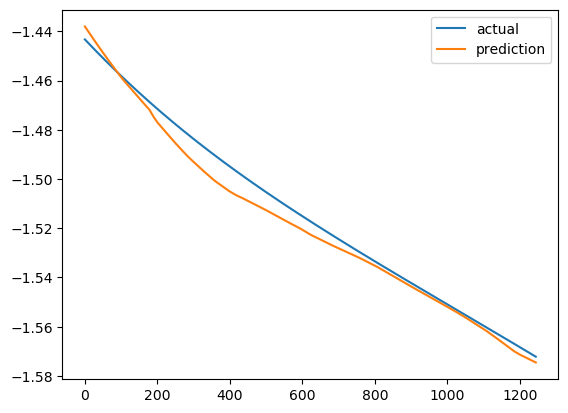

{'mae': 0    0.012158
dtype: float64, 'mape': 0   -0.798783
dtype: float64, 'mse': 0    0.000165
dtype: float64}


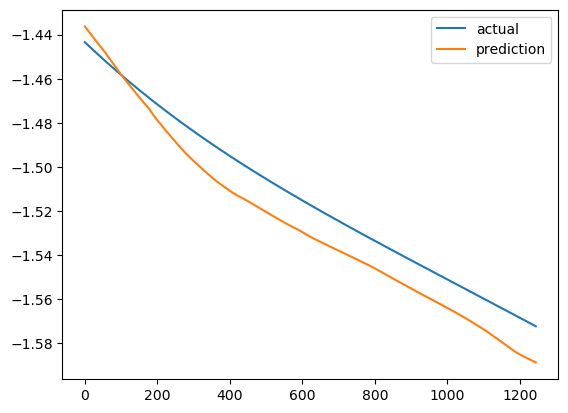

Epoch 1/1000
157/157 [==============================] - 7s 46ms/step - loss: 0.0052 - val_loss: 0.2235
Epoch 2/1000
157/157 [==============================] - 7s 43ms/step - loss: 0.0023 - val_loss: 0.6111
Epoch 3/1000
157/157 [==============================] - 7s 42ms/step - loss: 0.0016 - val_loss: 0.2475
Epoch 4/1000
157/157 [==============================] - 7s 43ms/step - loss: 0.0011 - val_loss: 0.2448
Epoch 5/1000
157/157 [==============================] - 7s 42ms/step - loss: 0.0018 - val_loss: 1.0783
Epoch 6/1000
157/157 [==============================] - 7s 42ms/step - loss: 3.9011e-04 - val_loss: 1.7550
Epoch 7/1000
157/157 [==============================] - 7s 42ms/step - loss: 5.4314e-04 - val_loss: 1.0077
Epoch 8/1000
157/157 [==============================] - 7s 43ms/step - loss: 1.0931e-04 - val_loss: 0.8952
Epoch 9/1000
157/157 [==============================] - 6s 41ms/step - loss: 0.0010 - val_loss: 0.4337
Epoch 10/1000
157/157 [==============================] - 7s 4

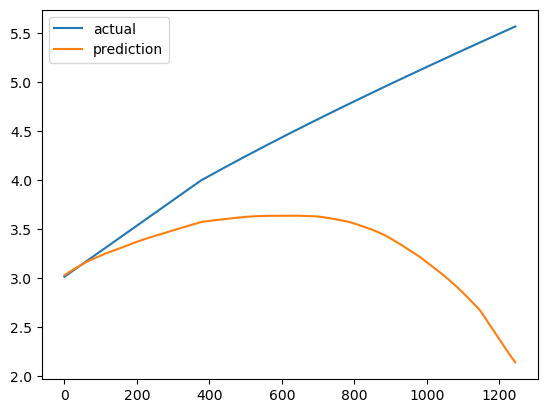

{'mae': 0    1.146925
dtype: float64, 'mape': 0    23.537558
dtype: float64, 'mse': 0    2.059906
dtype: float64}


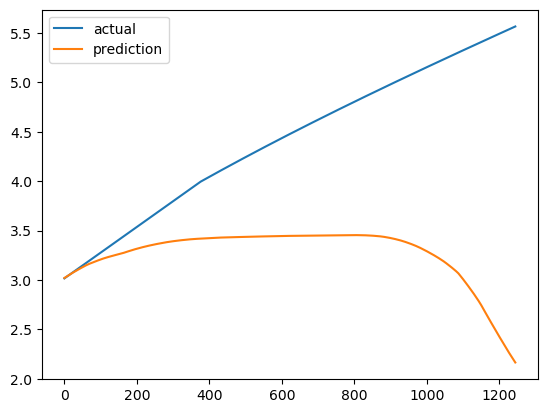

{'mae': 0    1.051951
dtype: float64, 'mape': 0    21.371891
dtype: float64, 'mse': 0    1.869365
dtype: float64}


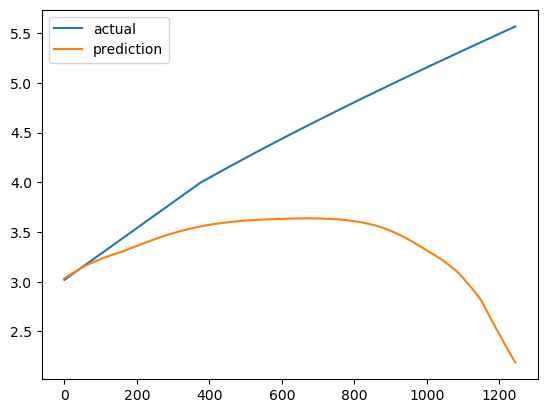

Epoch 1/1000
157/157 [==============================] - 7s 43ms/step - loss: 0.0042 - val_loss: 0.1203
Epoch 2/1000
157/157 [==============================] - 6s 40ms/step - loss: 0.0039 - val_loss: 0.0430
Epoch 3/1000
157/157 [==============================] - 6s 39ms/step - loss: 0.0042 - val_loss: 0.0091
Epoch 4/1000
157/157 [==============================] - 6s 41ms/step - loss: 0.0020 - val_loss: 0.0241
Epoch 5/1000
157/157 [==============================] - 6s 41ms/step - loss: 4.4672e-04 - val_loss: 0.0083
Epoch 6/1000
157/157 [==============================] - 6s 41ms/step - loss: 6.9731e-04 - val_loss: 0.0198
Epoch 7/1000
157/157 [==============================] - 7s 42ms/step - loss: 2.4490e-04 - val_loss: 0.0266
Epoch 8/1000
157/157 [==============================] - 7s 43ms/step - loss: 3.5434e-04 - val_loss: 0.0436
Epoch 9/1000
157/157 [==============================] - 7s 43ms/step - loss: 1.1729e-04 - val_loss: 0.0172
Epoch 10/1000
157/157 [==============================

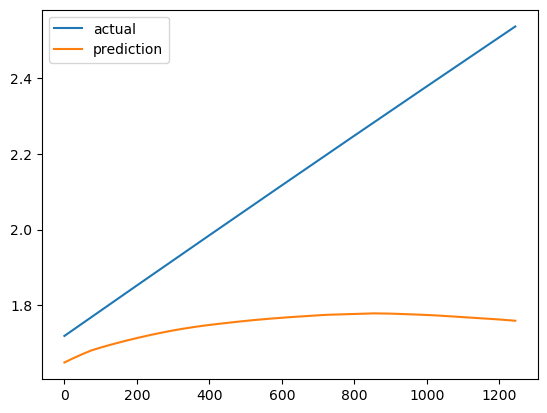

{'mae': 0    0.371238
dtype: float64, 'mape': 0    16.551963
dtype: float64, 'mse': 0    0.181402
dtype: float64}


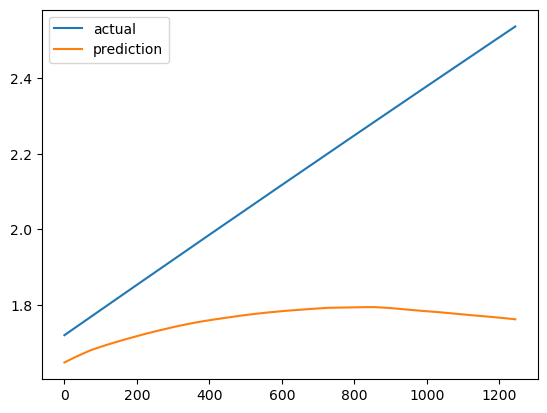

{'mae': 0    0.368229
dtype: float64, 'mape': 0    16.426569
dtype: float64, 'mse': 0    0.177158
dtype: float64}


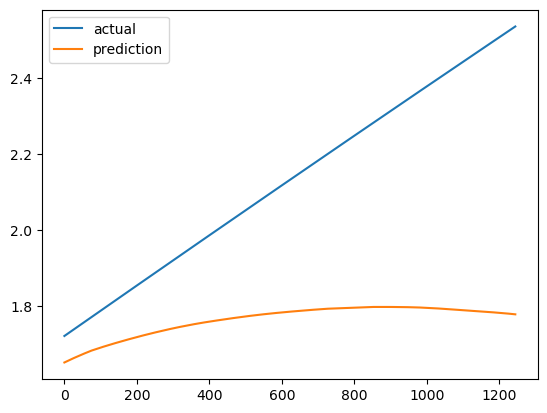

====================10
Epoch 1/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0436 - val_loss: 0.0266
Epoch 2/1000
157/157 [==============================] - 9s 58ms/step - loss: 0.0909 - val_loss: 0.0179
Epoch 3/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.1430 - val_loss: 0.0217
Epoch 4/1000
157/157 [==============================] - 9s 60ms/step - loss: 0.1102 - val_loss: 0.0053
Epoch 5/1000
157/157 [==============================] - 9s 59ms/step - loss: 0.0603 - val_loss: 0.0205
Epoch 6/1000
157/157 [==============================] - 9s 59ms/step - loss: 0.0280 - val_loss: 0.0555
Epoch 7/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.0420 - val_loss: 0.1051
Epoch 8/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0039 - val_loss: 0.0968
Epoch 9/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0013 - val_loss: 0.1009
Epoch 10/1000
157/157 [======================

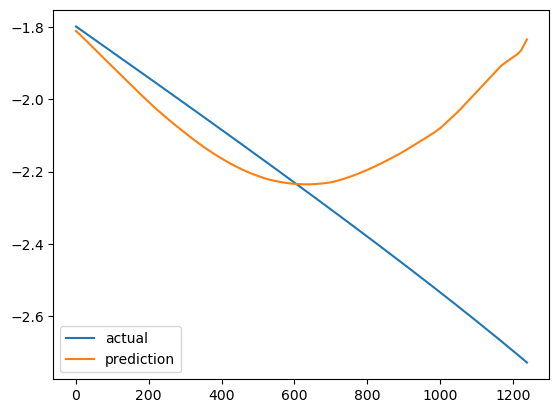

{'mae': 0    0.345873
dtype: float64, 'mape': 0   -13.732522
dtype: float64, 'mse': 0    0.269023
dtype: float64}


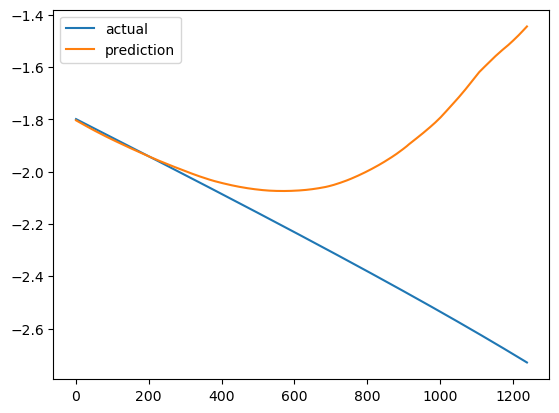

{'mae': 0    0.370825
dtype: float64, 'mape': 0   -14.777553
dtype: float64, 'mse': 0    0.294822
dtype: float64}


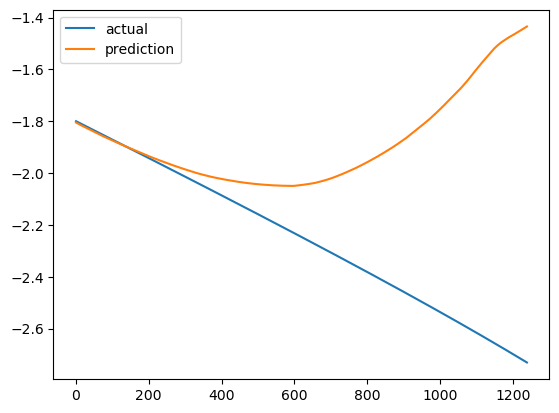

Epoch 1/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0689 - val_loss: 0.0291
Epoch 2/1000
157/157 [==============================] - 10s 63ms/step - loss: 614.8880 - val_loss: 0.0032
Epoch 3/1000
157/157 [==============================] - 10s 65ms/step - loss: 2.6020 - val_loss: 0.0071
Epoch 4/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0256 - val_loss: 0.0104
Epoch 5/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0055 - val_loss: 0.0046
Epoch 6/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0113 - val_loss: 0.0030
Epoch 7/1000
157/157 [==============================] - 9s 57ms/step - loss: 0.0035 - val_loss: 0.0043
Epoch 8/1000
157/157 [==============================] - 9s 60ms/step - loss: 0.0016 - val_loss: 0.0061
Epoch 9/1000
157/157 [==============================] - 9s 59ms/step - loss: 8.7459e-04 - val_loss: 0.0064
Epoch 10/1000
157/157 [==============================] - 10s 

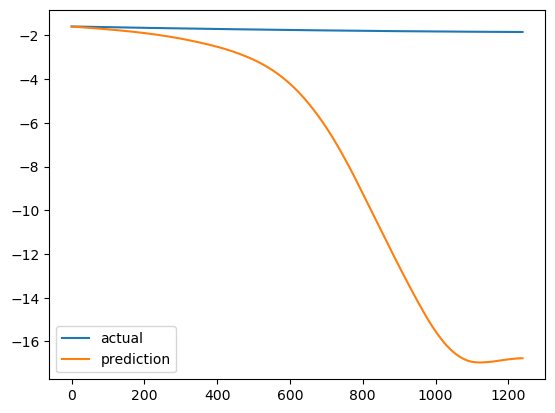

{'mae': 0    0.986141
dtype: float64, 'mape': 0   -55.277524
dtype: float64, 'mse': 0    1.504929
dtype: float64}


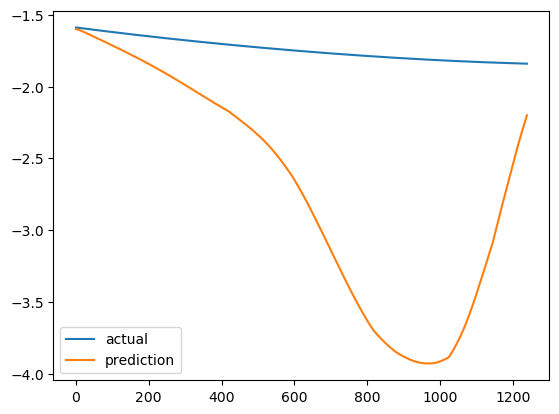

{'mae': 0    1.054678
dtype: float64, 'mape': 0   -58.760043
dtype: float64, 'mse': 0    1.975895
dtype: float64}


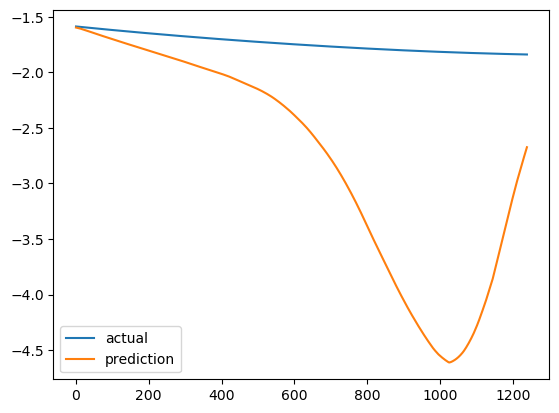

Epoch 1/1000
157/157 [==============================] - 10s 67ms/step - loss: 0.0021 - val_loss: 0.3043
Epoch 2/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0085 - val_loss: 0.4745
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0013 - val_loss: 0.4265
Epoch 4/1000
157/157 [==============================] - 10s 64ms/step - loss: 5.5789e-04 - val_loss: 0.3267
Epoch 5/1000
157/157 [==============================] - 10s 66ms/step - loss: 7.2319e-04 - val_loss: 0.1931
Epoch 6/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.0011 - val_loss: 0.1968
Epoch 7/1000
157/157 [==============================] - 10s 67ms/step - loss: 8.6553e-04 - val_loss: 0.2363
Epoch 8/1000
157/157 [==============================] - 10s 65ms/step - loss: 2.0543e-04 - val_loss: 0.2323
Epoch 9/1000
157/157 [==============================] - 9s 60ms/step - loss: 3.3990e-04 - val_loss: 0.2002
Epoch 10/1000
157/157 [======================

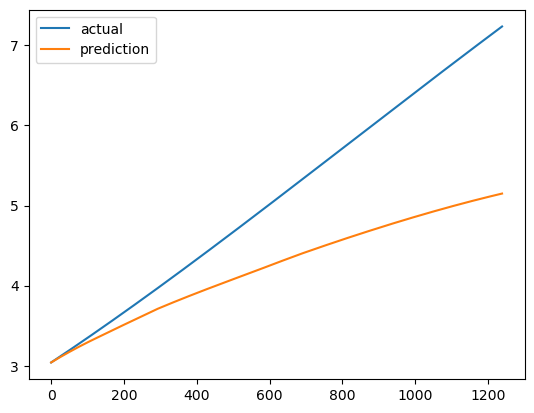

{'mae': 0    1.387304
dtype: float64, 'mape': 0    23.890923
dtype: float64, 'mse': 0    2.924399
dtype: float64}


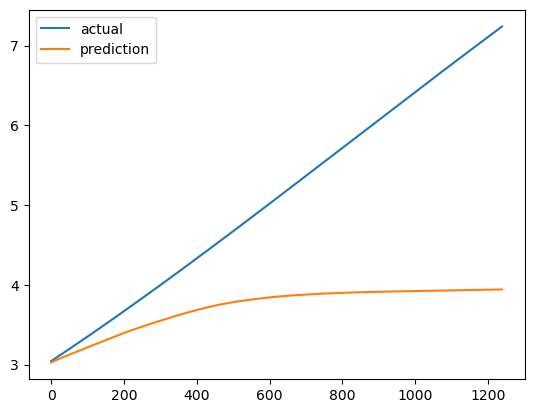

{'mae': 0    1.164721
dtype: float64, 'mape': 0    20.052664
dtype: float64, 'mse': 0    2.046165
dtype: float64}


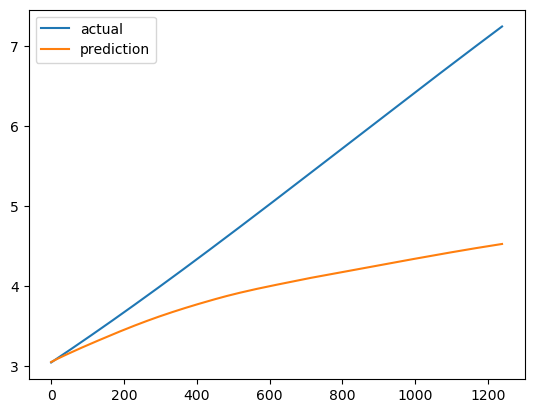

Epoch 1/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0142 - val_loss: 0.0350
Epoch 2/1000
157/157 [==============================] - 9s 60ms/step - loss: 0.0076 - val_loss: 0.0918
Epoch 3/1000
157/157 [==============================] - 10s 63ms/step - loss: 0.0046 - val_loss: 0.0080
Epoch 4/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.0016 - val_loss: 0.0023
Epoch 5/1000
157/157 [==============================] - 9s 58ms/step - loss: 7.9279e-04 - val_loss: 0.0022
Epoch 6/1000
157/157 [==============================] - 9s 58ms/step - loss: 7.7458e-04 - val_loss: 0.0018
Epoch 7/1000
157/157 [==============================] - 9s 60ms/step - loss: 8.2788e-04 - val_loss: 0.0010
Epoch 8/1000
157/157 [==============================] - 10s 62ms/step - loss: 5.5825e-05 - val_loss: 4.5600e-04
Epoch 9/1000
157/157 [==============================] - 10s 61ms/step - loss: 5.5462e-04 - val_loss: 4.9146e-04
Epoch 10/1000
157/157 [=================

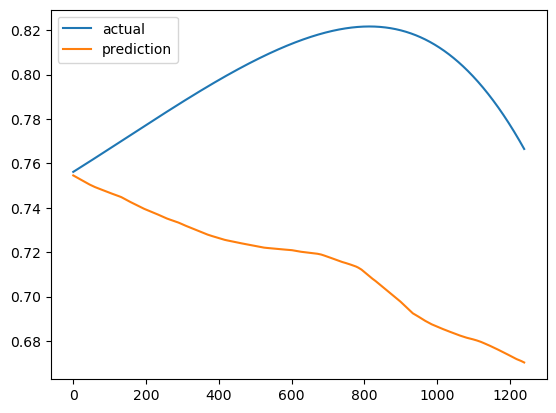

{'mae': 0    0.105587
dtype: float64, 'mape': 0    13.107655
dtype: float64, 'mse': 0    0.013504
dtype: float64}


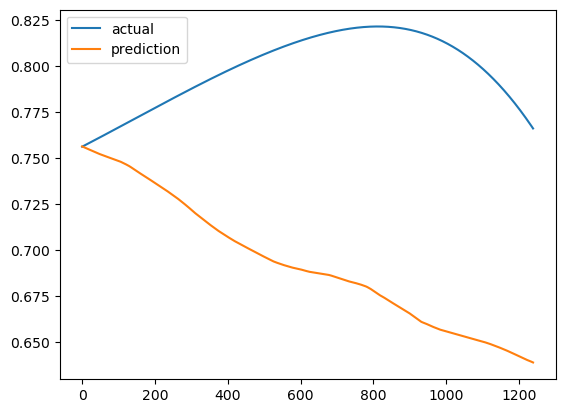

{'mae': 0    0.125669
dtype: float64, 'mape': 0    15.599748
dtype: float64, 'mse': 0    0.019219
dtype: float64}


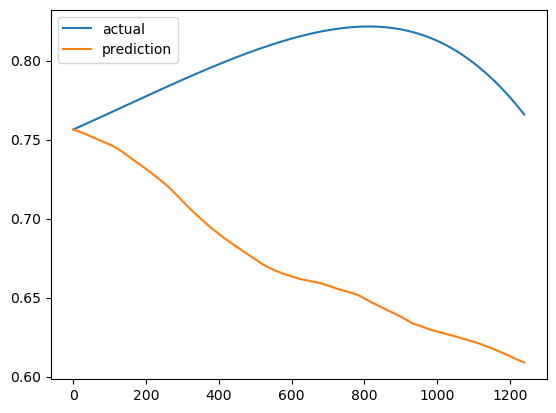

Epoch 1/1000
157/157 [==============================] - 10s 65ms/step - loss: 0.0587 - val_loss: 0.0063
Epoch 2/1000
157/157 [==============================] - 10s 63ms/step - loss: 74.3917 - val_loss: 6.0025e-04
Epoch 3/1000
157/157 [==============================] - 10s 64ms/step - loss: 0.6990 - val_loss: 6.2576e-04
Epoch 4/1000
157/157 [==============================] - 9s 60ms/step - loss: 2.6930 - val_loss: 7.5207e-04
Epoch 5/1000
157/157 [==============================] - 10s 63ms/step - loss: 111.1813 - val_loss: 4.1516e-04
Epoch 6/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.3000 - val_loss: 3.2243e-04
Epoch 7/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0212 - val_loss: 3.2092e-04
Epoch 8/1000
157/157 [==============================] - 10s 62ms/step - loss: 0.0174 - val_loss: 2.9195e-04
Epoch 9/1000
157/157 [==============================] - 10s 61ms/step - loss: 0.0014 - val_loss: 2.6139e-04
Epoch 10/1000
157/157 [=======

In [ ]:
# CHECK!!!! trend

for tp in [5, 10, 20]:
    print("====================%d"%tp)
    for i in range(7):
        time_step = tp
        y_step = 3
        patience = 100
        epochs = 1000

        (lstm_X_train, lstm_y_train) = make_dataset(scaled_data[0][i][0], scaled_data[0][i][1], time_step)
        (lstm_X_valid, lstm_y_valid) = make_dataset(scaled_data[0][i][2], scaled_data[0][i][3], time_step)

        model = Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)
        #model.summary()

        history = Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

        pred = model.predict(lstm_X_valid)

        for j in range(y_step):
            print(calculate_metrics(
                inverse_min_max_scaling(scaler_y[0][i], lstm_y_valid[:, j]),
                inverse_min_max_scaling(scaler_y[0][i], pred[:, j])
            ))
            plt.plot(inverse_min_max_scaling(scaler_y[0][i],  np.reshape(lstm_y_valid[:, j], (-1, 1))), label = 'actual')
            plt.plot(inverse_min_max_scaling(scaler_y[0][i], np.reshape(pred[:, j], (-1, 1))), label = 'prediction')
            plt.legend()
            plt.show()
    print("====================")
        